In [1]:
#coding=utf-8
import time
import torch
import torchvision
import numpy as np
import pandas as pd
import seaborn as sns
import torch.nn as nn
import matplotlib.pyplot as plt

from pycaret.classification import *
from torch.utils.data import DataLoader
from torch.utils.data import TensorDataset
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import roc_curve, roc_auc_score,precision_recall_curve, f1_score, recall_score, accuracy_score



In [2]:
start = time.time()

# Load data

In [3]:
def preprocess_train(data_path):
    # 1-1 加载数据
    df = pd.read_csv(data_path)
    for i in ['State', 'International plan','Voice mail plan','Churn']:
        df[i], unique = pd.factorize(df[i])
    
    df_01 = df.sort_values(by=['Churn'],ascending=True)
    df_balanced_1 = df_01[:388][:]
    df_balanced_2 = df_01[388:][:]
    df_balanced = pd.concat([df_balanced_1, df_balanced_2])
    
    df_value = np.array(df_balanced)
    scaler = StandardScaler()
    X = scaler.fit_transform(df_value[:,:19])
    Y = df_value[:,19].reshape(-1, 1)


    return X, Y

In [4]:
def preprocess_test(data_path):
    # 1-1 加载数据
    df = pd.read_csv(data_path)
    for i in ['State', 'International plan','Voice mail plan','Churn']:
        df[i], unique = pd.factorize(df[i])
    df_value = np.array(df)
    
    scaler = StandardScaler()
    X = scaler.fit_transform(df_value[:,:19])
    Y = df_value[:,19].reshape(-1, 1)
    return X, Y

In [5]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [6]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(in_features=19, out_features=100), nn.Sigmoid(),
            nn.Linear(100, 128), nn.Sigmoid(), nn.BatchNorm1d(128), nn.Dropout(0.1),
            nn.Linear(128, 108), nn.Sigmoid(), nn.BatchNorm1d(108), nn.Dropout(0.1),
            nn.Linear(108, 100), nn.Sigmoid(), nn.BatchNorm1d(100), nn.Dropout(0.1),
            nn.Linear(100, 2), nn.Softmax(dim=1)
        )

    def forward(self, input:torch.FloatTensor):
        return self.net(input)


In [7]:
epoch_number = 300
learning_rate = 0.1
threshold = 0.5

loss_all = []        # Collect all MSE loss
accuracy_all = []    # Collect all accuracy
acc_high = [0]      # Collect the highest accuracy
f1_all = []
recall_all = []

In [8]:
X, Y = preprocess_train('.//churn-bigml-80.csv')
X_test, Y_test = preprocess_test('.//churn-bigml-20.csv')

X_tens = torch.tensor(X_test, dtype=torch.float)
Y_tens = torch.tensor(Y_test, dtype=torch.float)

data_set = TensorDataset(torch.tensor(X, dtype=torch.float),
                         torch.tensor(Y, dtype=torch.float))

# Create data_set of tensors with torch.utils.data.TensorDataset
dataloader = DataLoader(data_set,
                        batch_size=256,  # size = 16/64/128/256
                        shuffle=True)
net = Net().to(device)

# Set optimizer and loss function
# optim = torch.optim.SGD(Net.parameters(net), lr=0.05, momentum = 0.9)
optim = torch.optim.Adam(Net.parameters(net), lr=learning_rate, 
                         weight_decay=0.00001
                        )
# optim = torch.optim.RMSprop(Net.parameters(net),lr=learning_rate
#                             ,weight_decay=0.0001
#                             ,momentum=0.9
#                            )
# Loss = nn.MSELoss()
criterion = nn.CrossEntropyLoss()


In [9]:
def adjust_learning_rate(optimizer, epoch, lr):
    """lr decayed by __ every __ epochs"""
    lr *= (0.7 ** (epoch // 40))
    for param_group in optimizer.param_groups:
        param_group['lr'] = lr

x_opt = list(range(epoch_number))
y_opt = []
lr_init = optim.param_groups[0]['lr']

for epoch in range(epoch_number):
    adjust_learning_rate(optim, epoch, lr_init)
    lr = optim.param_groups[0]['lr']
    print(epoch, lr)
    y_opt.append(lr)

0 0.1
1 0.1
2 0.1
3 0.1
4 0.1
5 0.1
6 0.1
7 0.1
8 0.1
9 0.1
10 0.1
11 0.1
12 0.1
13 0.1
14 0.1
15 0.1
16 0.1
17 0.1
18 0.1
19 0.1
20 0.1
21 0.1
22 0.1
23 0.1
24 0.1
25 0.1
26 0.1
27 0.1
28 0.1
29 0.1
30 0.1
31 0.1
32 0.1
33 0.1
34 0.1
35 0.1
36 0.1
37 0.1
38 0.1
39 0.1
40 0.06999999999999999
41 0.06999999999999999
42 0.06999999999999999
43 0.06999999999999999
44 0.06999999999999999
45 0.06999999999999999
46 0.06999999999999999
47 0.06999999999999999
48 0.06999999999999999
49 0.06999999999999999
50 0.06999999999999999
51 0.06999999999999999
52 0.06999999999999999
53 0.06999999999999999
54 0.06999999999999999
55 0.06999999999999999
56 0.06999999999999999
57 0.06999999999999999
58 0.06999999999999999
59 0.06999999999999999
60 0.06999999999999999
61 0.06999999999999999
62 0.06999999999999999
63 0.06999999999999999
64 0.06999999999999999
65 0.06999999999999999
66 0.06999999999999999
67 0.06999999999999999
68 0.06999999999999999
69 0.06999999999999999
70 0.06999999999999999
71 0.069999999999

Step: 2   Cross Entropy Loss: 0.49185559153556824   Accuracy: 80.65967016491754 % 
F1 score is 0.30270270270270266 Recall score is 0.29473684210526313


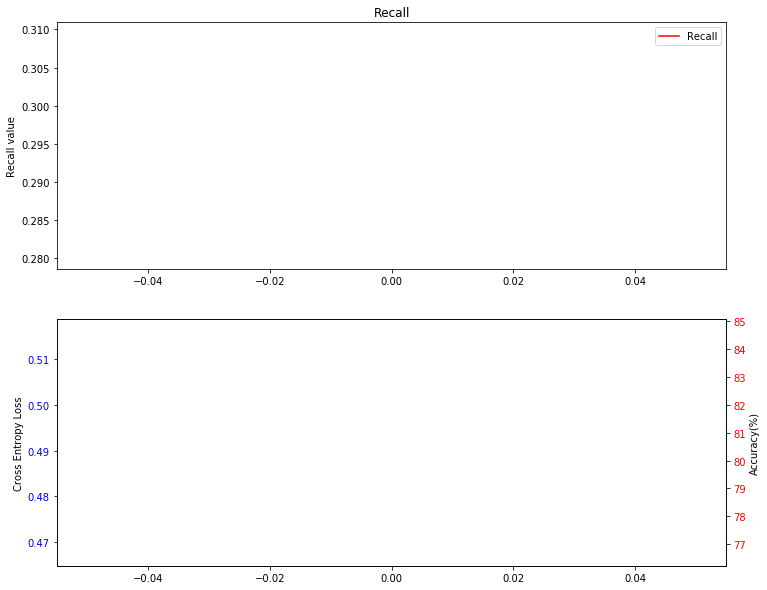

Step: 4   Cross Entropy Loss: 0.43536457419395447   Accuracy: 85.75712143928035 % 
F1 score is 0.5077720207253886 Recall score is 0.5157894736842106


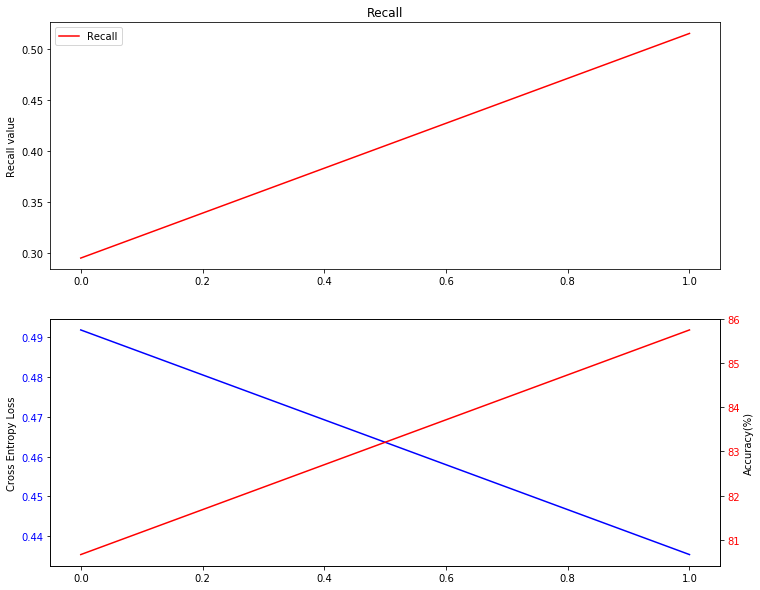

Step: 6   Cross Entropy Loss: 0.4135562479496002   Accuracy: 88.30584707646177 % 
F1 score is 0.6285714285714286 Recall score is 0.6947368421052632


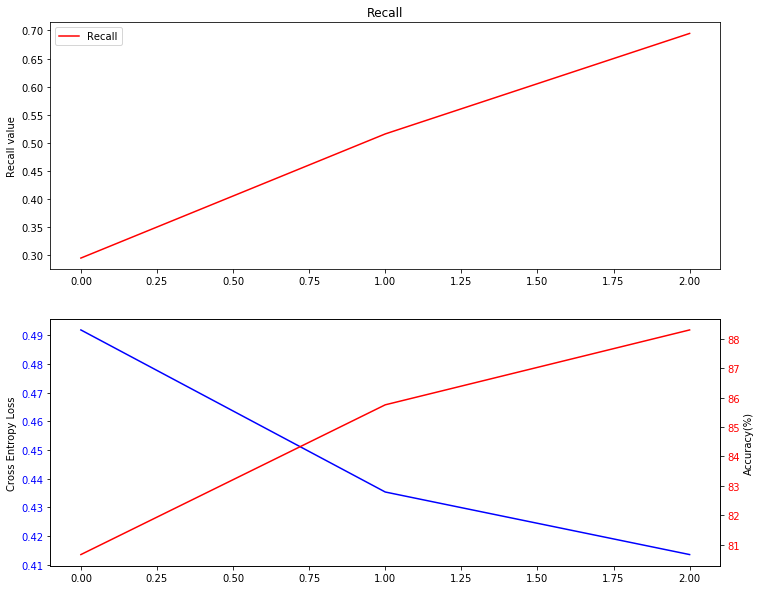

Step: 8   Cross Entropy Loss: 0.43252500891685486   Accuracy: 87.25637181409296 % 
F1 score is 0.5685279187817259 Recall score is 0.5894736842105263


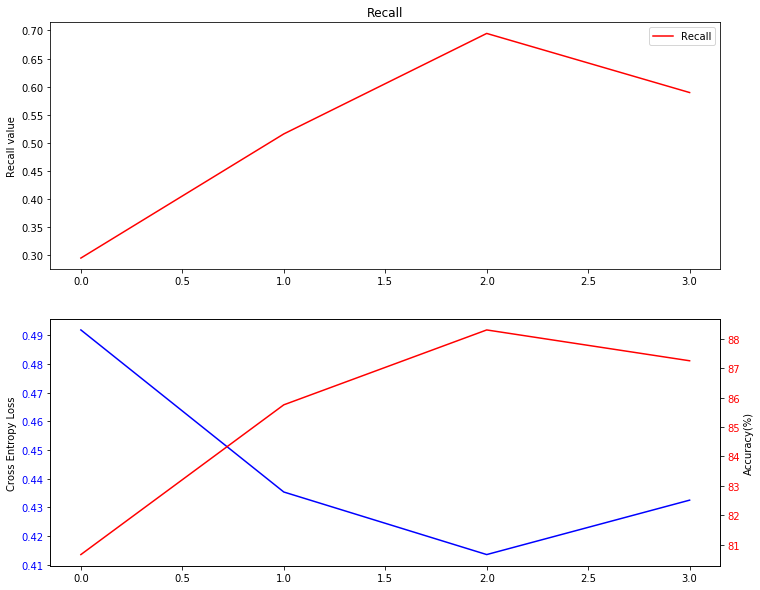

Step: 10   Cross Entropy Loss: 0.413975328207016   Accuracy: 86.20689655172413 % 
F1 score is 0.5740740740740742 Recall score is 0.6526315789473685


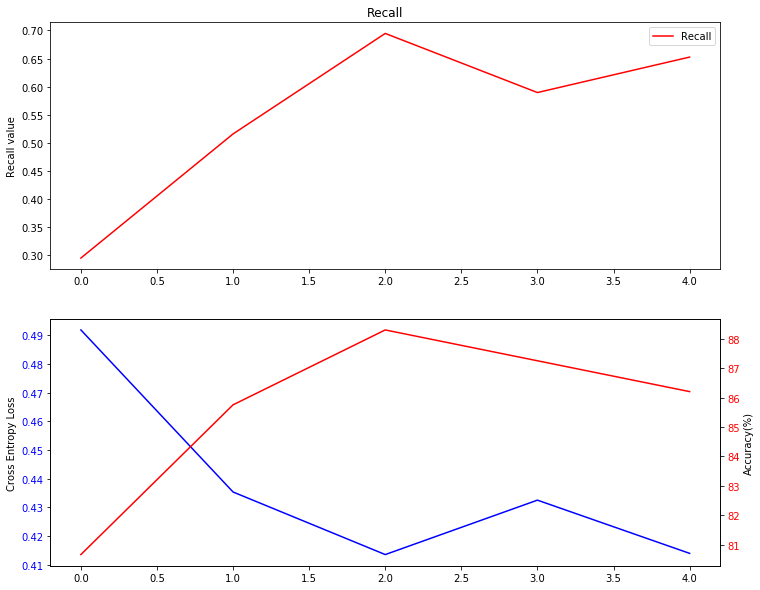

Step: 12   Cross Entropy Loss: 0.38747739791870117   Accuracy: 86.3568215892054 % 
F1 score is 0.5991189427312775 Recall score is 0.7157894736842105


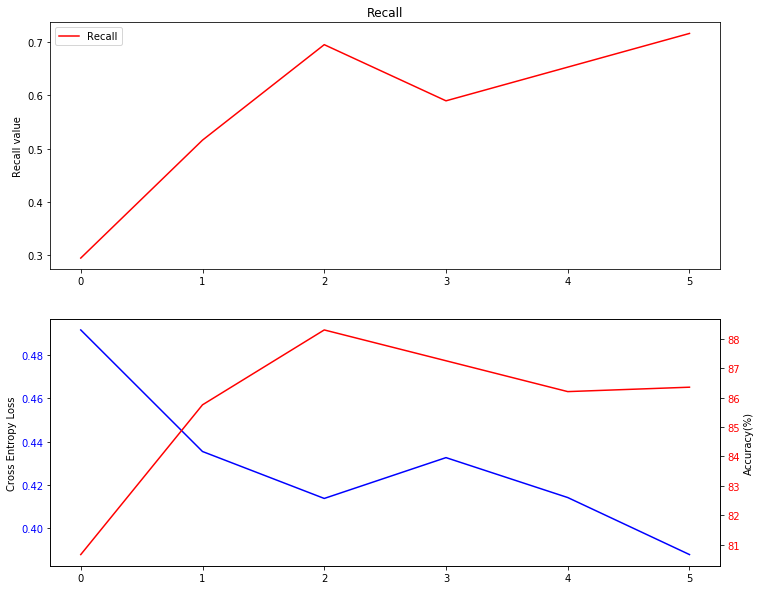

Step: 14   Cross Entropy Loss: 0.4183741807937622   Accuracy: 86.05697151424287 % 
F1 score is 0.5753424657534246 Recall score is 0.6631578947368421


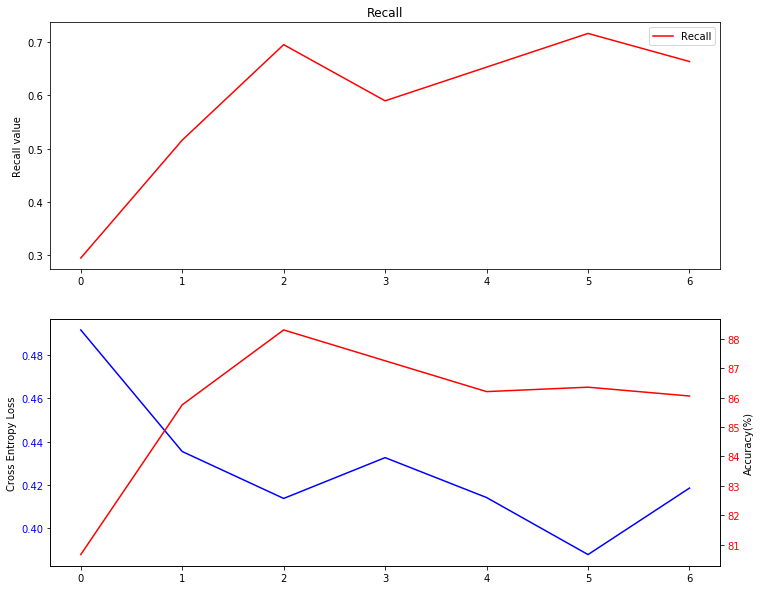

Step: 16   Cross Entropy Loss: 0.45397186279296875   Accuracy: 88.45577211394303 % 
F1 score is 0.6384976525821596 Recall score is 0.7157894736842105


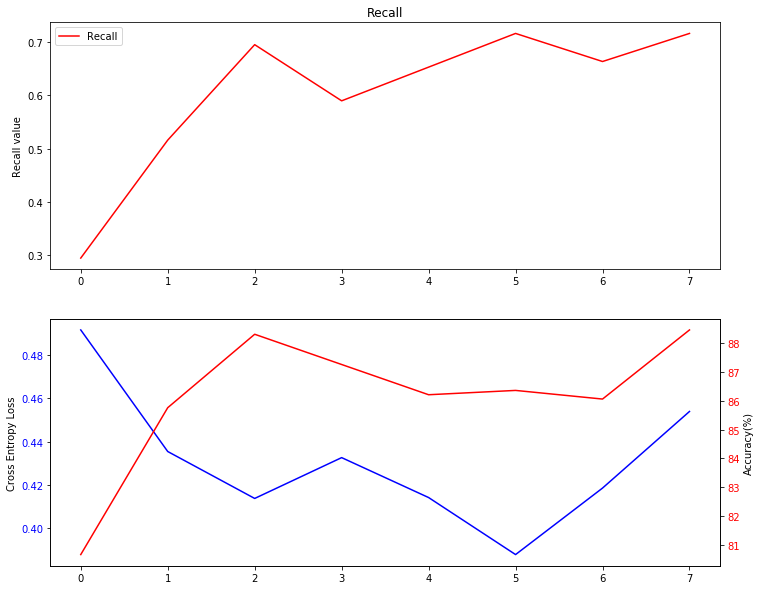

Step: 18   Cross Entropy Loss: 0.4113580286502838   Accuracy: 89.35532233883059 % 
F1 score is 0.5644171779141104 Recall score is 0.4842105263157895


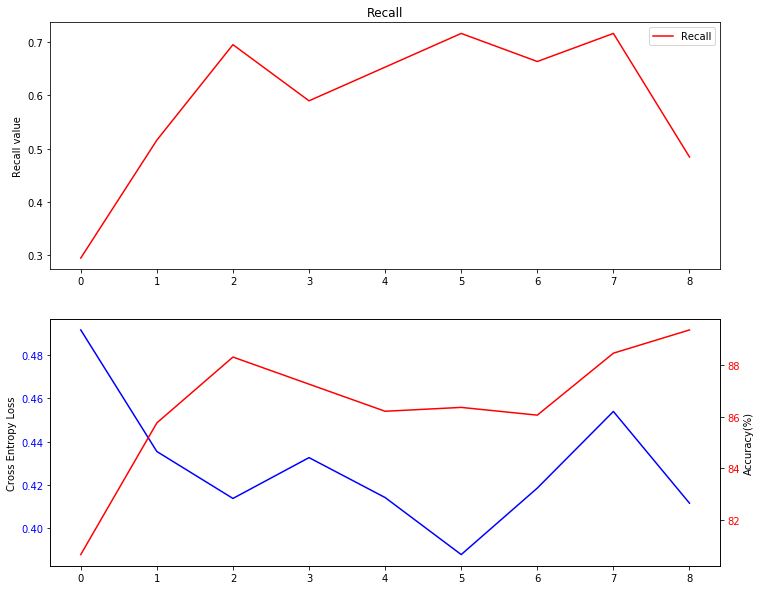

Step: 20   Cross Entropy Loss: 0.4321416914463043   Accuracy: 89.80509745127436 % 
F1 score is 0.5277777777777778 Recall score is 0.4


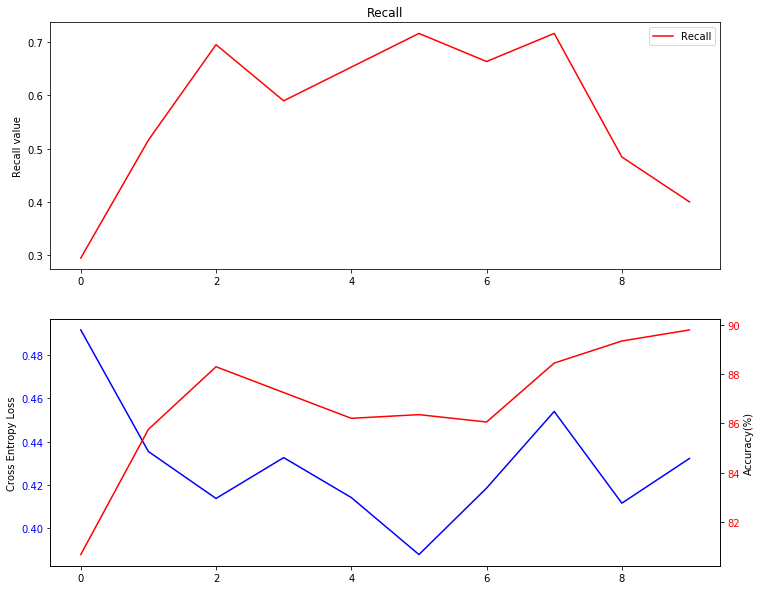

Step: 22   Cross Entropy Loss: 0.38745686411857605   Accuracy: 90.85457271364318 % 
F1 score is 0.6473988439306358 Recall score is 0.5894736842105263


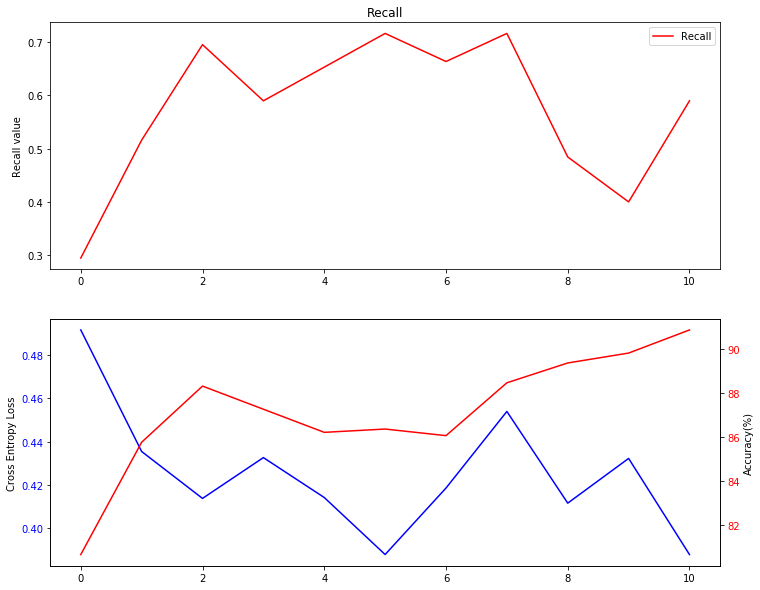

Step: 24   Cross Entropy Loss: 0.39534884691238403   Accuracy: 88.9055472263868 % 
F1 score is 0.513157894736842 Recall score is 0.4105263157894737


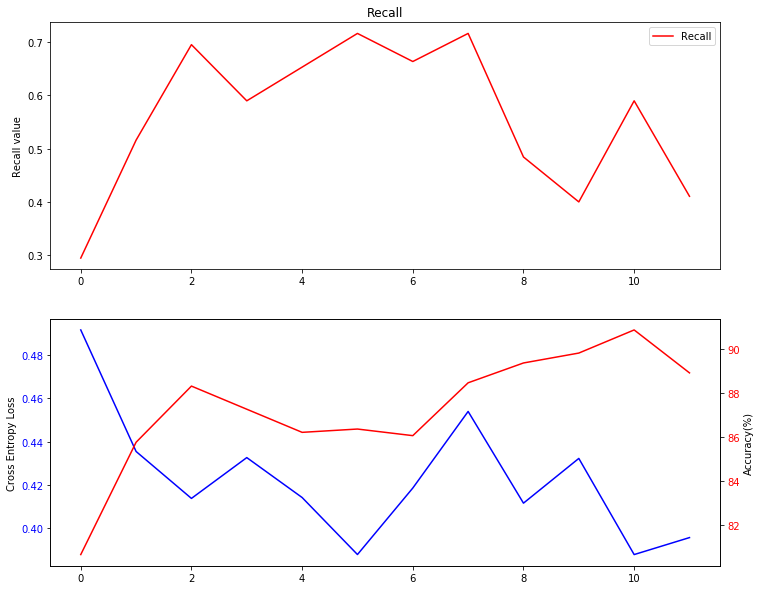

Step: 26   Cross Entropy Loss: 0.3630281984806061   Accuracy: 88.1559220389805 % 
F1 score is 0.5093167701863355 Recall score is 0.43157894736842106


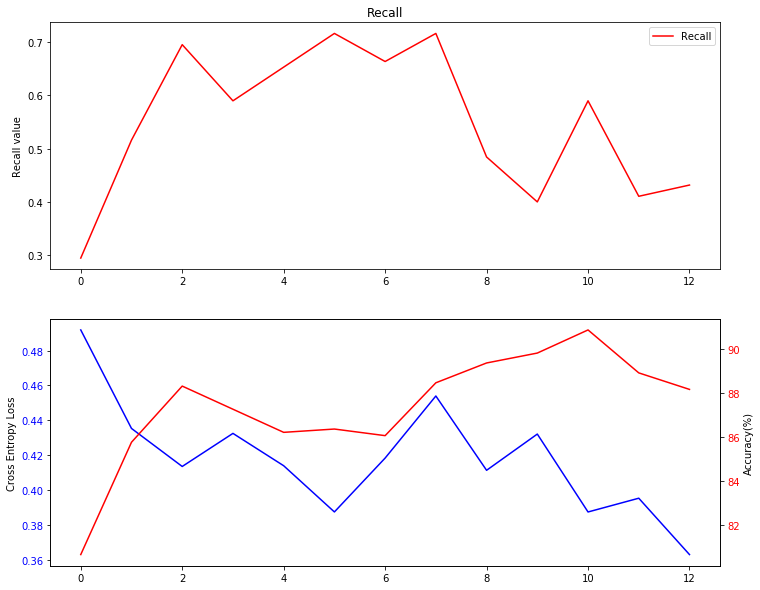

Step: 28   Cross Entropy Loss: 0.39427536725997925   Accuracy: 90.4047976011994 % 
F1 score is 0.5844155844155844 Recall score is 0.47368421052631576


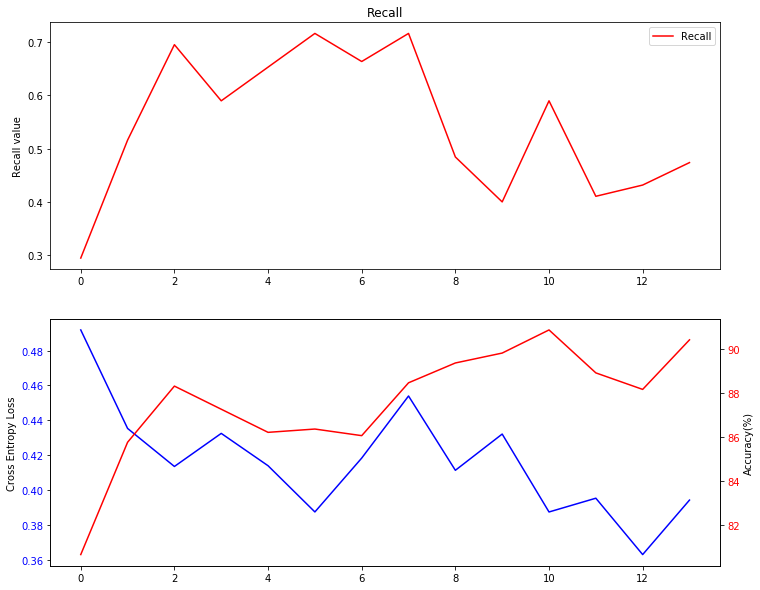

Step: 30   Cross Entropy Loss: 0.3984830677509308   Accuracy: 90.70464767616193 % 
F1 score is 0.6125 Recall score is 0.5157894736842106


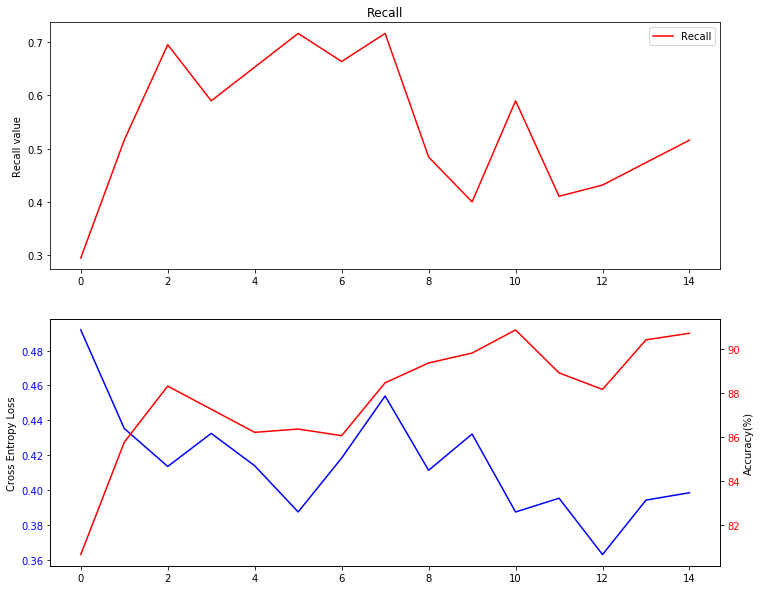

Step: 32   Cross Entropy Loss: 0.39747700095176697   Accuracy: 92.05397301349325 % 
F1 score is 0.6826347305389222 Recall score is 0.6


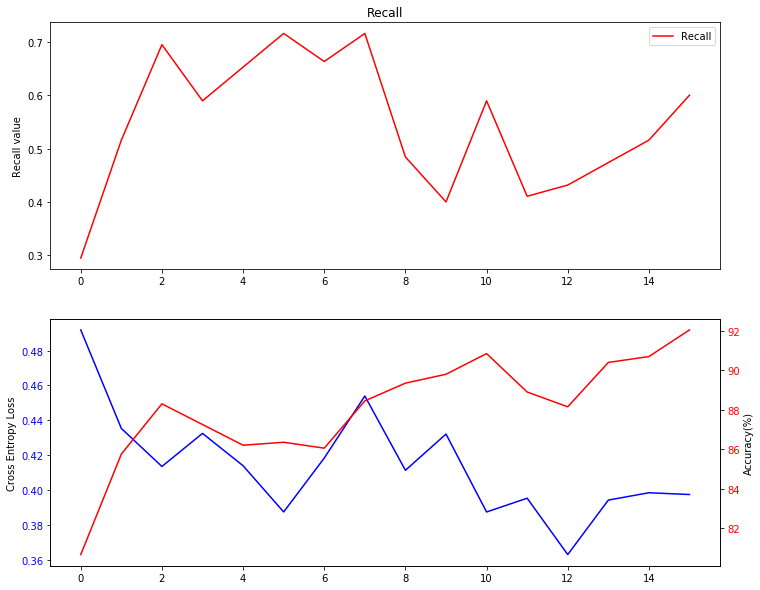

Step: 34   Cross Entropy Loss: 0.37944015860557556   Accuracy: 88.9055472263868 % 
F1 score is 0.5647058823529412 Recall score is 0.5052631578947369


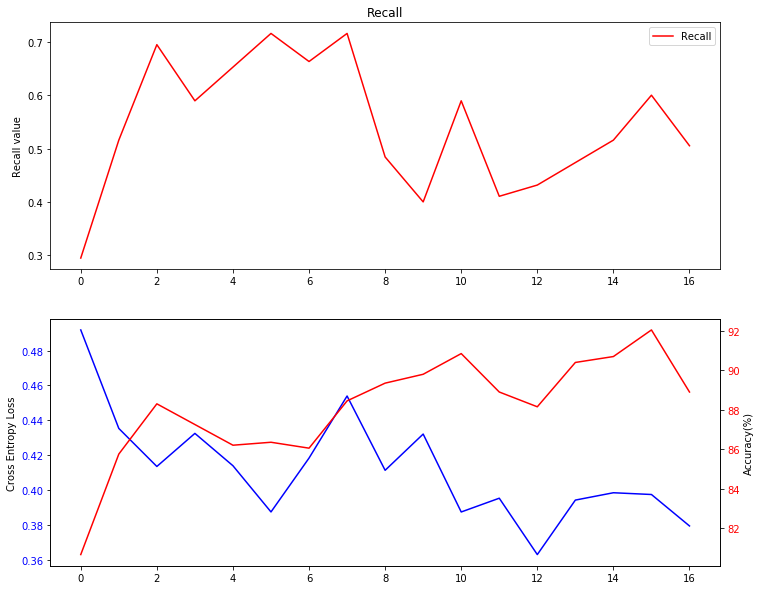

Step: 36   Cross Entropy Loss: 0.38535070419311523   Accuracy: 89.65517241379311 % 
F1 score is 0.5490196078431373 Recall score is 0.4421052631578947


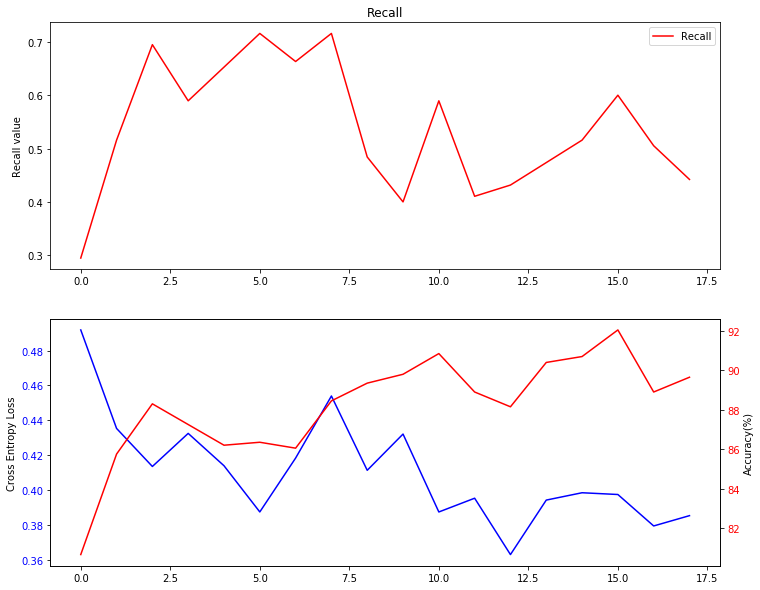

Step: 38   Cross Entropy Loss: 0.3736796975135803   Accuracy: 90.25487256371814 % 
F1 score is 0.6198830409356725 Recall score is 0.5578947368421052


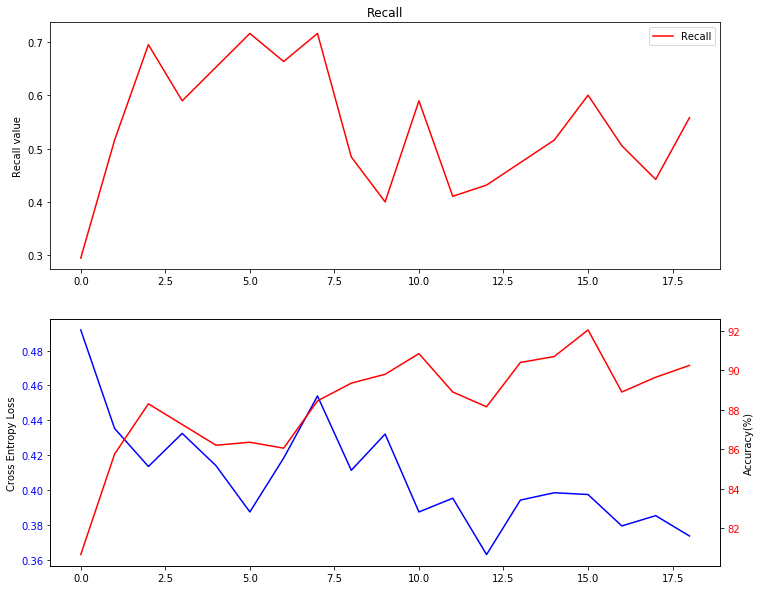

Step: 40   Cross Entropy Loss: 0.4243885278701782   Accuracy: 90.4047976011994 % 
F1 score is 0.627906976744186 Recall score is 0.5684210526315789


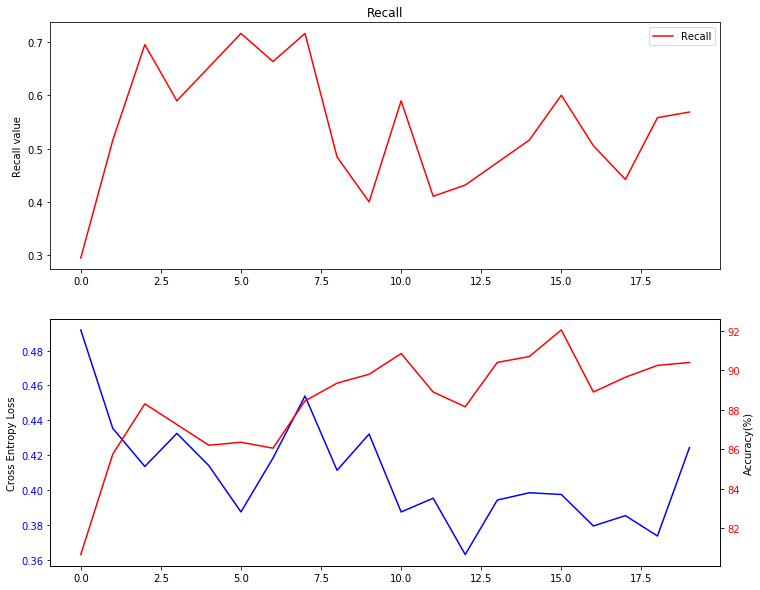

Step: 42   Cross Entropy Loss: 0.34162241220474243   Accuracy: 90.55472263868066 % 
F1 score is 0.6358381502890172 Recall score is 0.5789473684210527


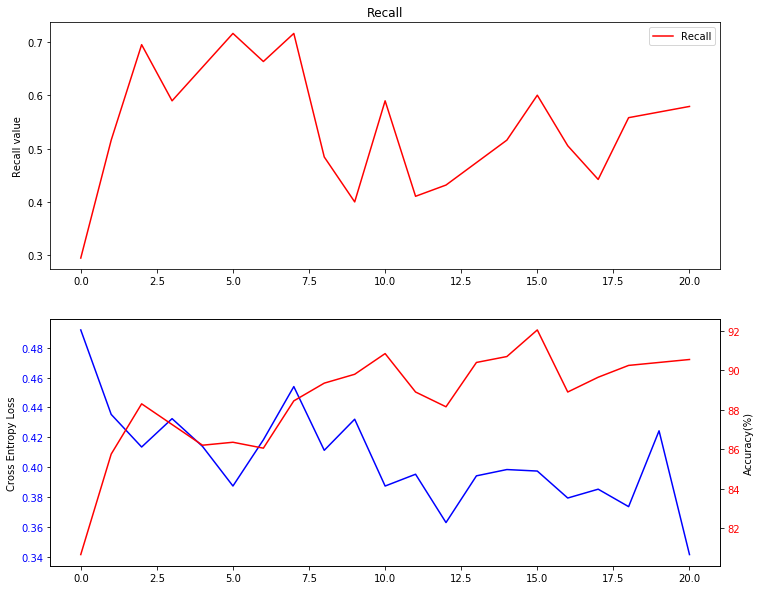

Step: 44   Cross Entropy Loss: 0.36926066875457764   Accuracy: 89.35532233883059 % 
F1 score is 0.5895953757225434 Recall score is 0.5368421052631579


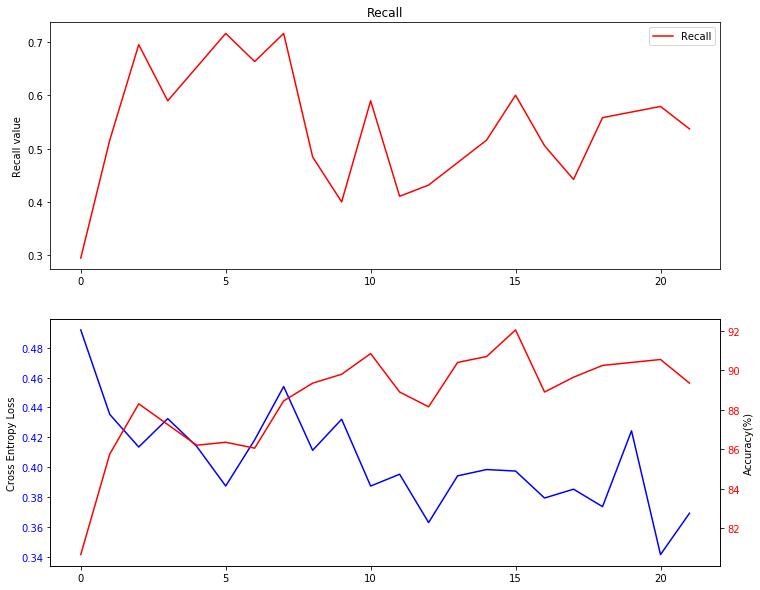

Step: 46   Cross Entropy Loss: 0.3835582733154297   Accuracy: 90.55472263868066 % 
F1 score is 0.6181818181818182 Recall score is 0.5368421052631579


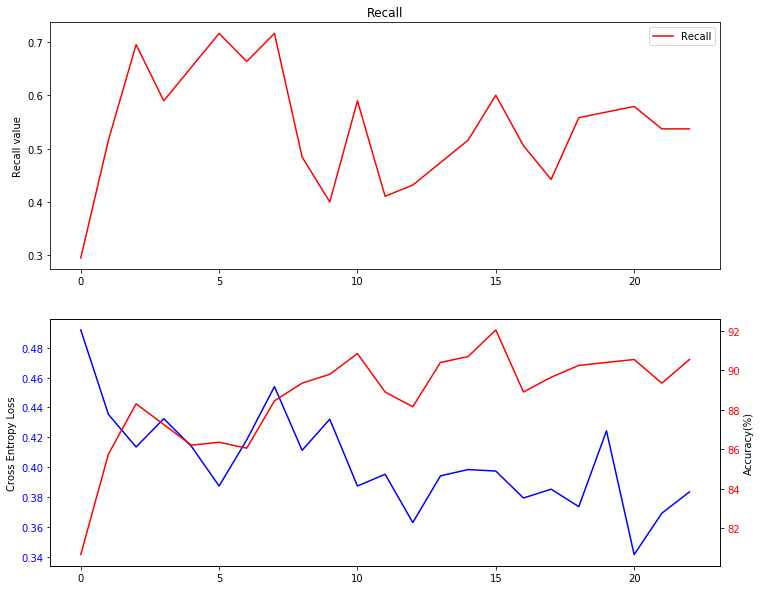

Step: 48   Cross Entropy Loss: 0.3678666353225708   Accuracy: 90.70464767616193 % 
F1 score is 0.651685393258427 Recall score is 0.6105263157894737


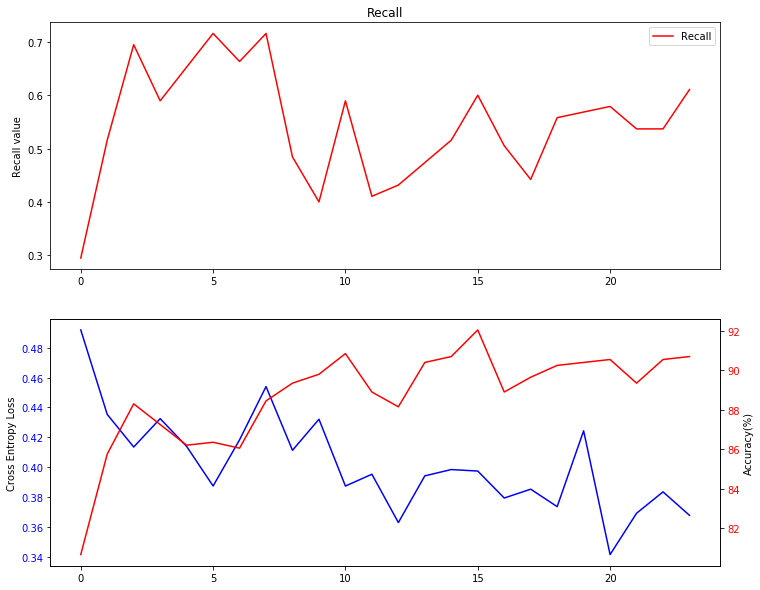

Step: 50   Cross Entropy Loss: 0.3674562871456146   Accuracy: 91.75412293853074 % 
F1 score is 0.6820809248554913 Recall score is 0.6210526315789474


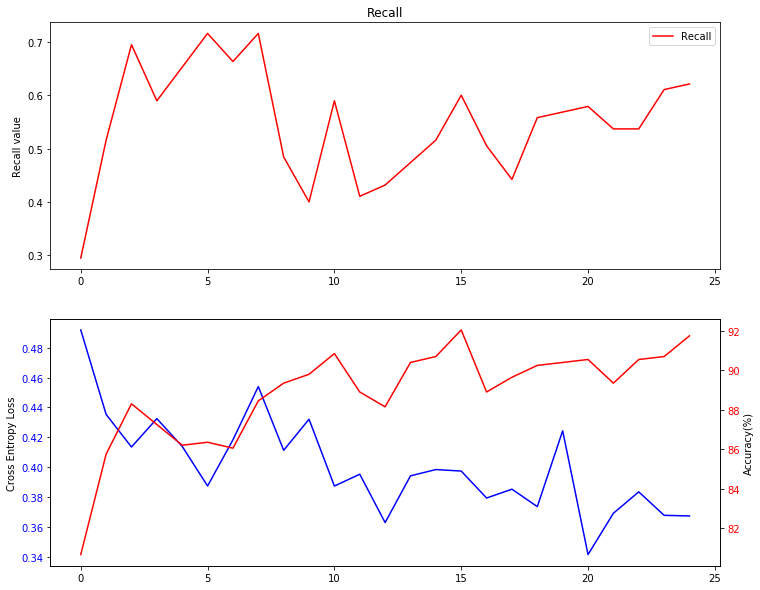

Step: 52   Cross Entropy Loss: 0.4025198817253113   Accuracy: 90.85457271364318 % 
F1 score is 0.6702702702702703 Recall score is 0.6526315789473685


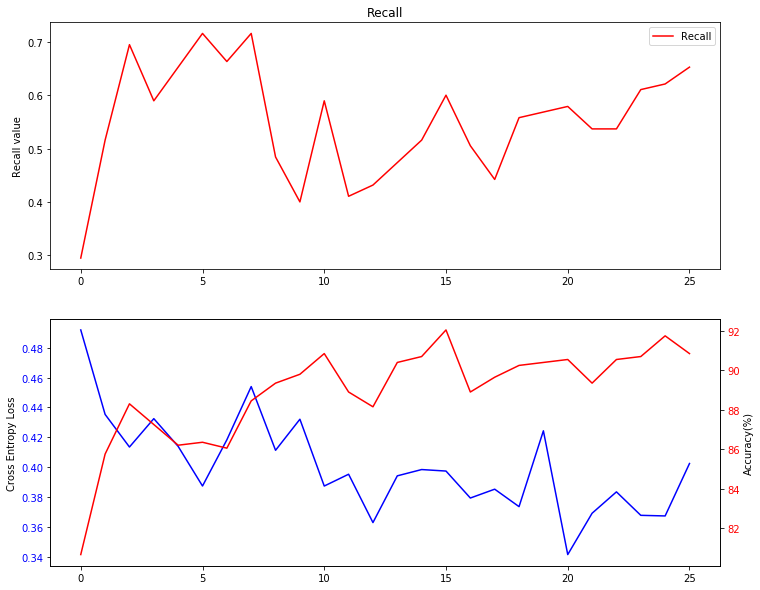

Step: 54   Cross Entropy Loss: 0.44165632128715515   Accuracy: 90.25487256371814 % 
F1 score is 0.6285714285714286 Recall score is 0.5789473684210527


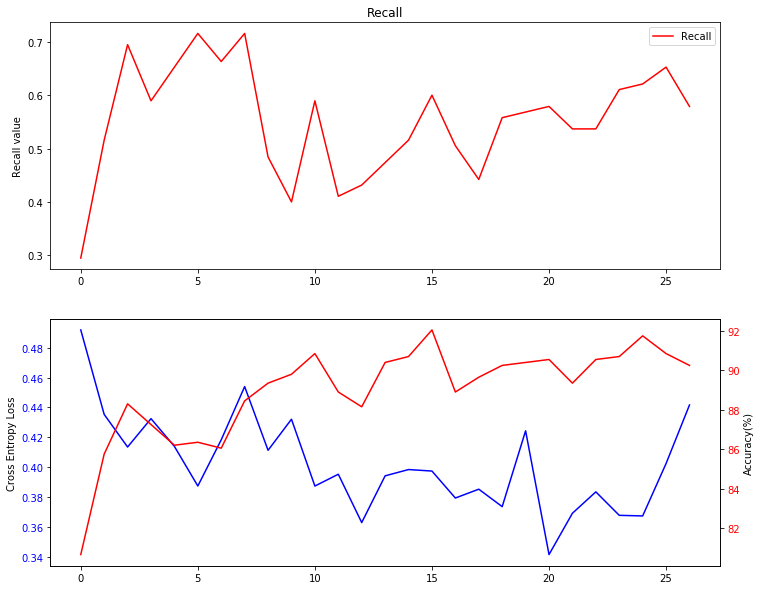

Step: 56   Cross Entropy Loss: 0.3869951665401459   Accuracy: 91.1544227886057 % 
F1 score is 0.6775956284153006 Recall score is 0.6526315789473685


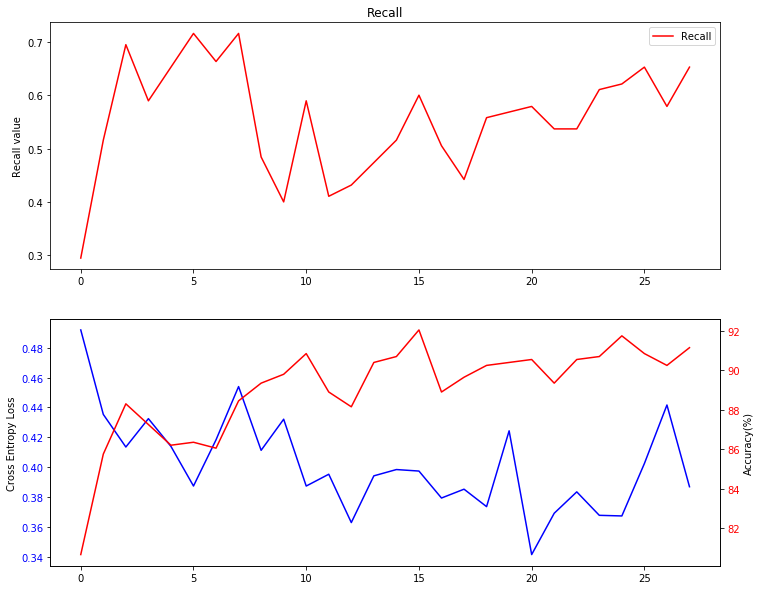

Step: 58   Cross Entropy Loss: 0.3988231420516968   Accuracy: 91.904047976012 % 
F1 score is 0.689655172413793 Recall score is 0.631578947368421


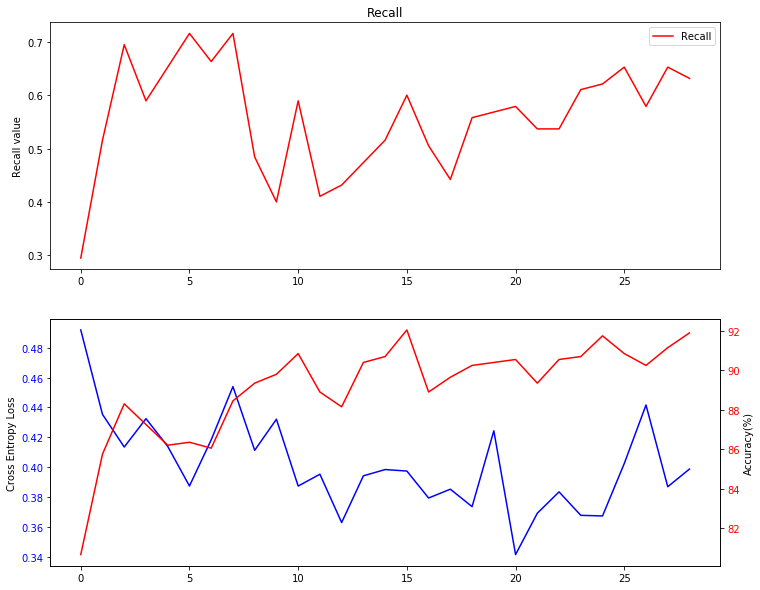

Step: 60   Cross Entropy Loss: 0.38291025161743164   Accuracy: 91.00449775112443 % 
F1 score is 0.6296296296296295 Recall score is 0.5368421052631579


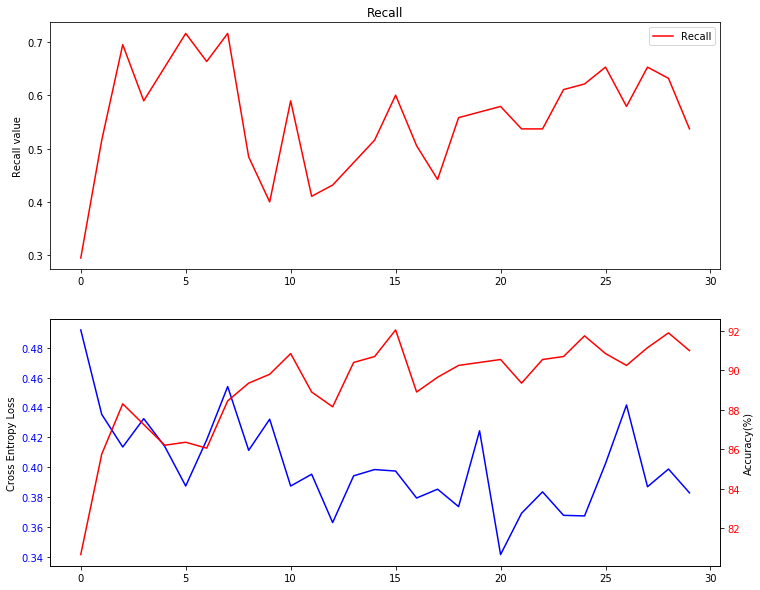

Step: 62   Cross Entropy Loss: 0.4076095521450043   Accuracy: 90.10494752623688 % 
F1 score is 0.611764705882353 Recall score is 0.5473684210526316


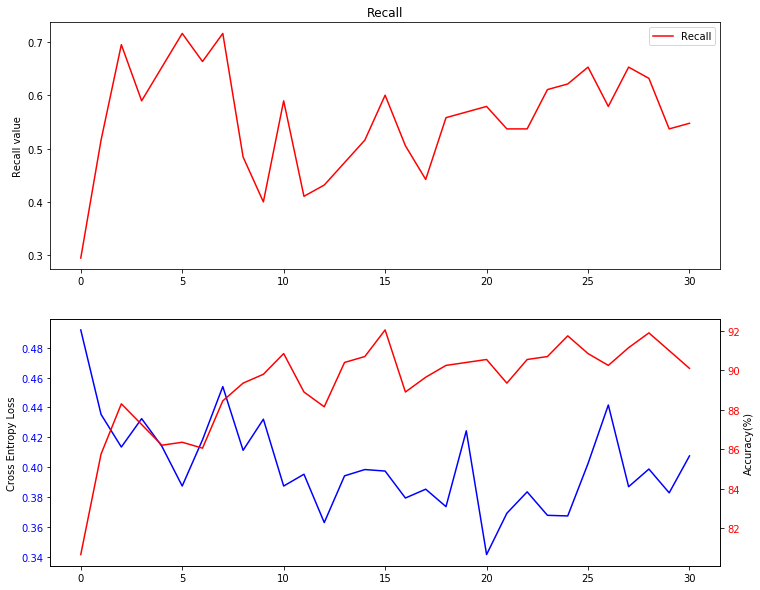

Step: 64   Cross Entropy Loss: 0.37568920850753784   Accuracy: 89.80509745127436 % 
F1 score is 0.6136363636363636 Recall score is 0.5684210526315789


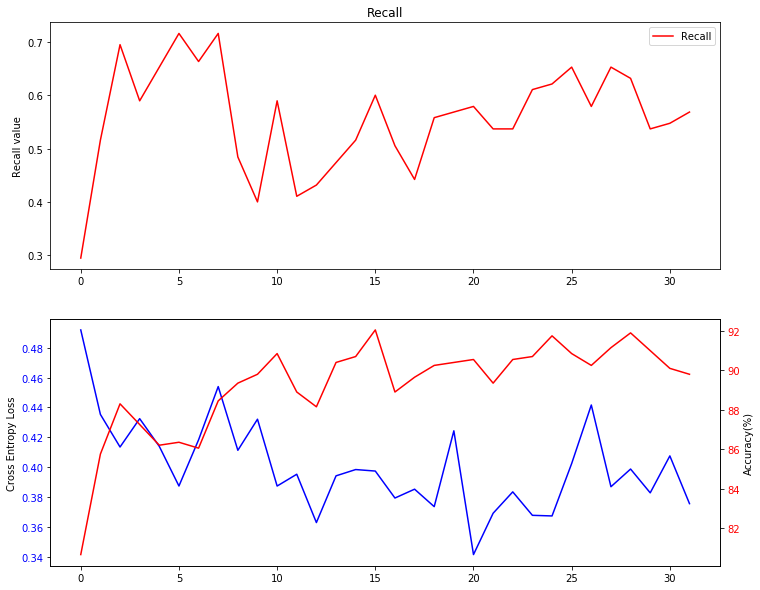

Step: 66   Cross Entropy Loss: 0.3546609580516815   Accuracy: 90.85457271364318 % 
F1 score is 0.6666666666666667 Recall score is 0.6421052631578947


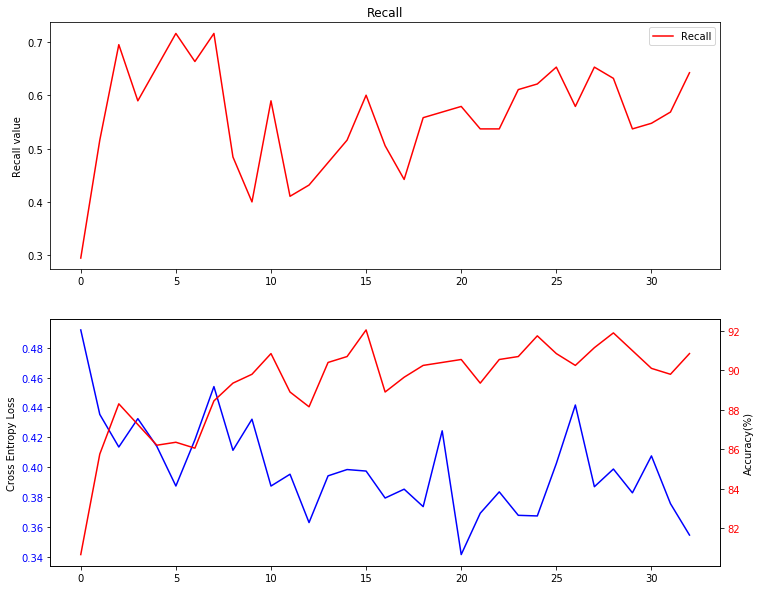

Step: 68   Cross Entropy Loss: 0.3459140360355377   Accuracy: 91.30434782608695 % 
F1 score is 0.6627906976744186 Recall score is 0.6


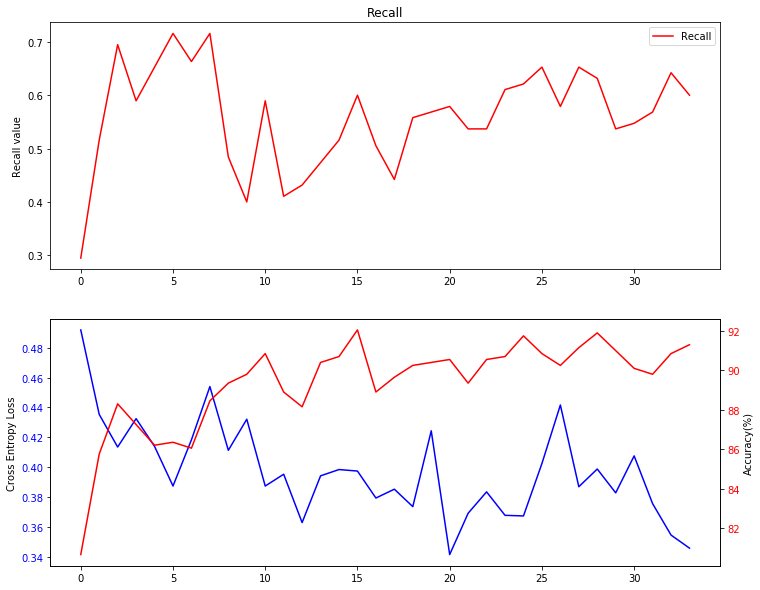

Step: 70   Cross Entropy Loss: 0.33242419362068176   Accuracy: 91.45427286356822 % 
F1 score is 0.6705202312138728 Recall score is 0.6105263157894737


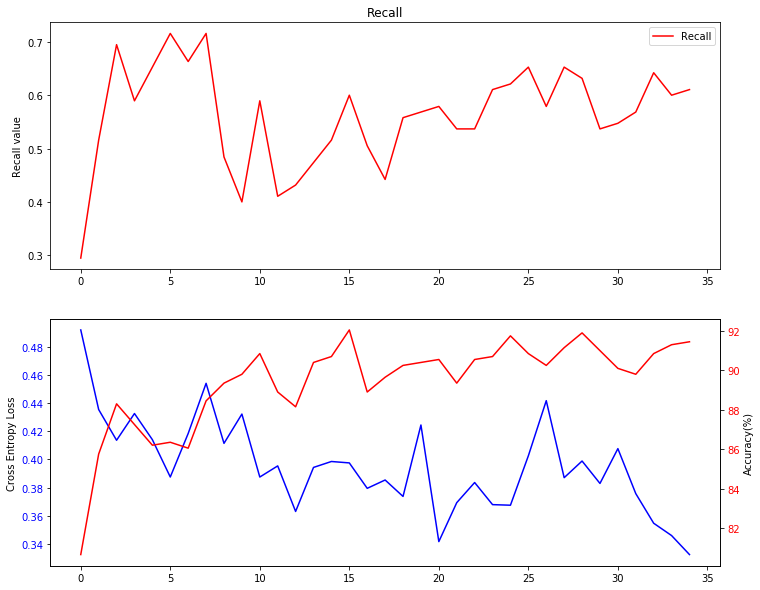

Step: 72   Cross Entropy Loss: 0.37008875608444214   Accuracy: 91.45427286356822 % 
F1 score is 0.6815642458100559 Recall score is 0.6421052631578947


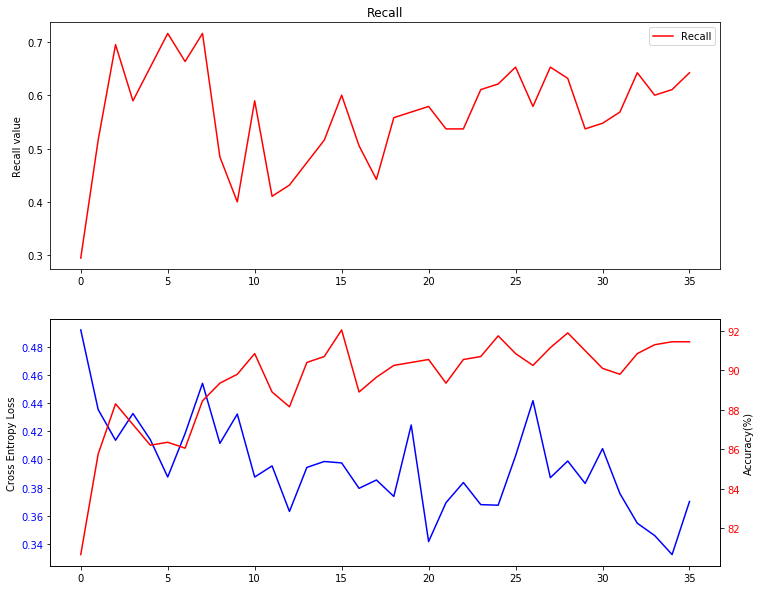

Step: 74   Cross Entropy Loss: 0.35108932852745056   Accuracy: 91.00449775112443 % 
F1 score is 0.6739130434782609 Recall score is 0.6526315789473685


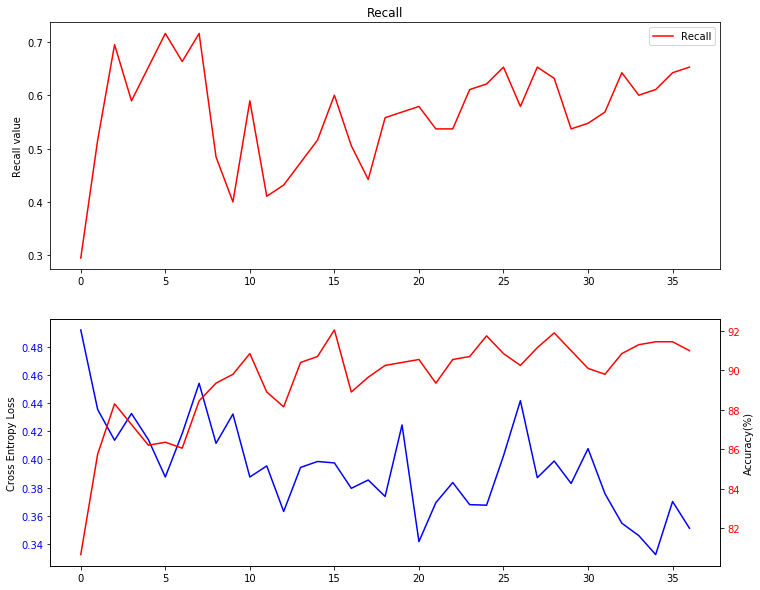

Step: 76   Cross Entropy Loss: 0.400347501039505   Accuracy: 90.4047976011994 % 
F1 score is 0.6049382716049384 Recall score is 0.5157894736842106


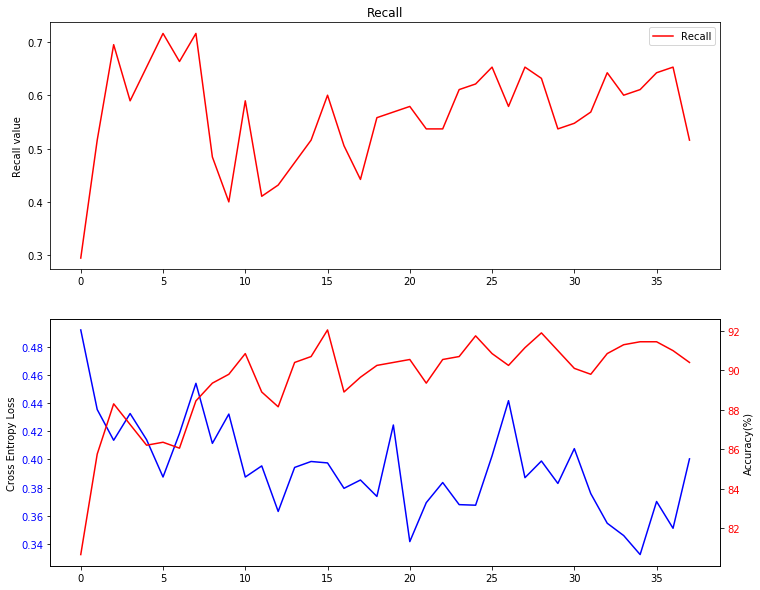

Step: 78   Cross Entropy Loss: 0.3734089136123657   Accuracy: 91.1544227886057 % 
F1 score is 0.7177033492822966 Recall score is 0.7894736842105263


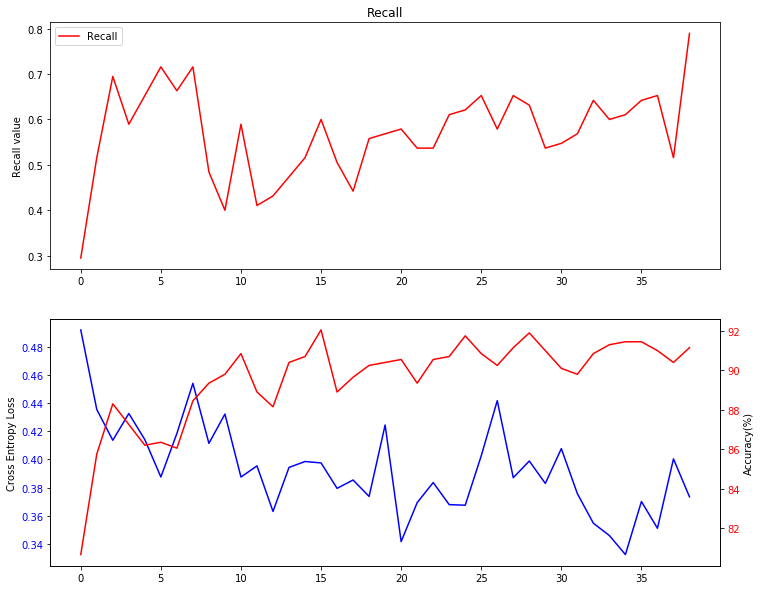

Step: 80   Cross Entropy Loss: 0.40398338437080383   Accuracy: 91.30434782608695 % 
F1 score is 0.6847826086956521 Recall score is 0.6631578947368421


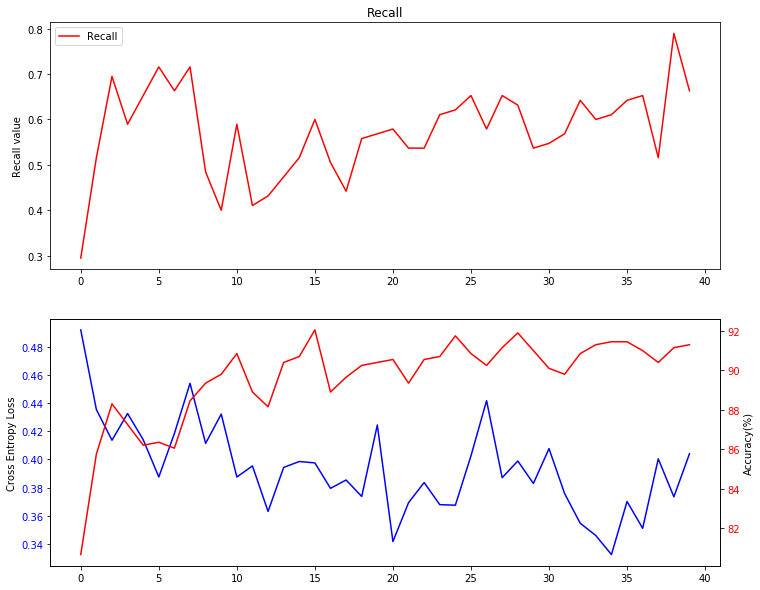

Step: 82   Cross Entropy Loss: 0.3601268231868744   Accuracy: 90.10494752623688 % 
F1 score is 0.6250000000000001 Recall score is 0.5789473684210527


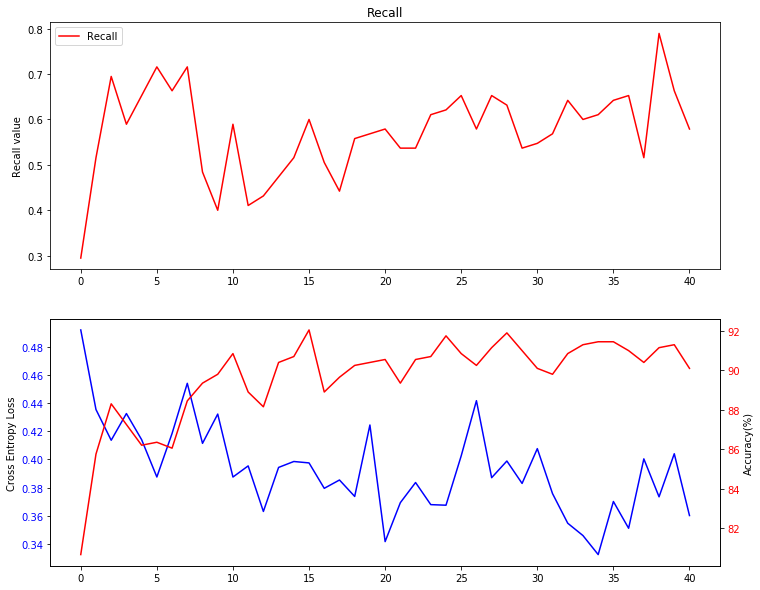

Step: 84   Cross Entropy Loss: 0.37303248047828674   Accuracy: 90.4047976011994 % 
F1 score is 0.6235294117647059 Recall score is 0.5578947368421052


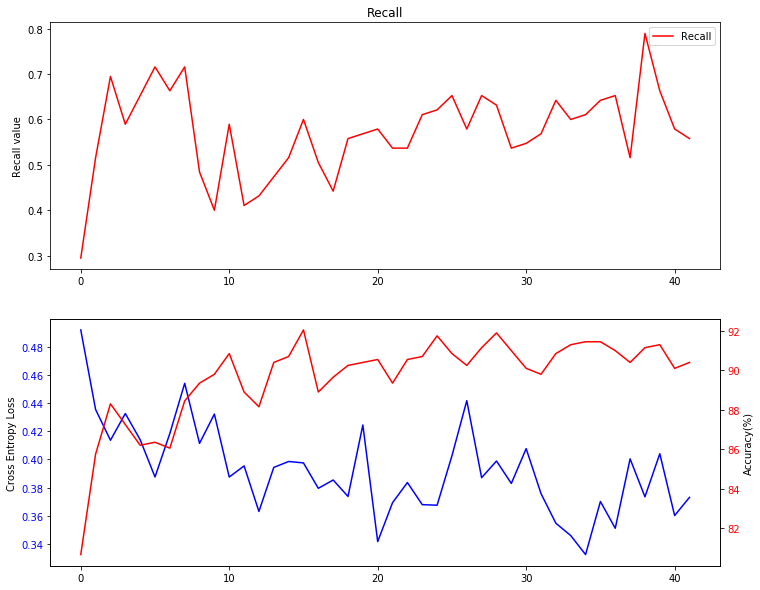

Step: 86   Cross Entropy Loss: 0.37750741839408875   Accuracy: 91.45427286356822 % 
F1 score is 0.6705202312138728 Recall score is 0.6105263157894737


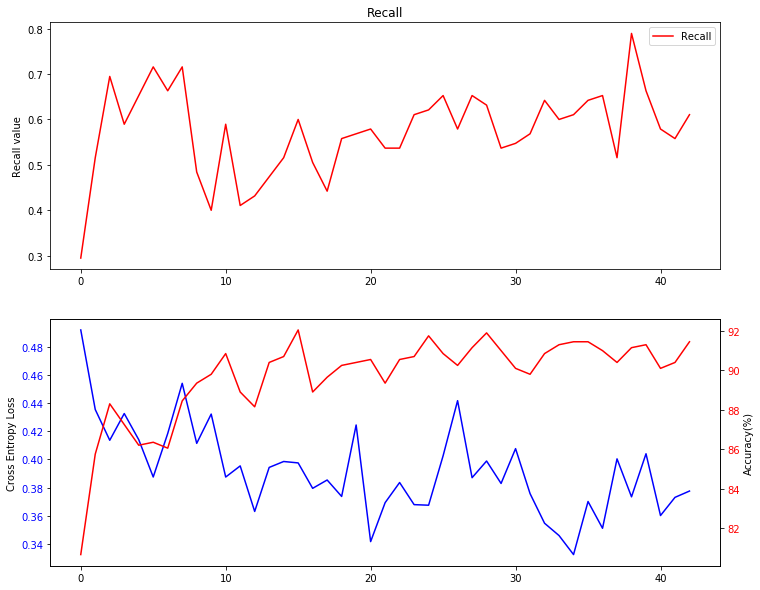

Step: 88   Cross Entropy Loss: 0.3484485149383545   Accuracy: 91.00449775112443 % 
F1 score is 0.6666666666666667 Recall score is 0.631578947368421


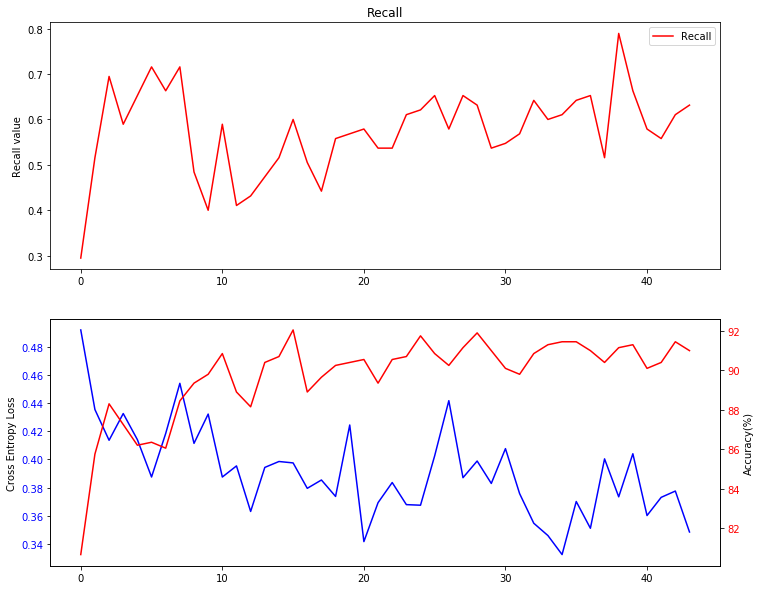

Step: 90   Cross Entropy Loss: 0.3469105064868927   Accuracy: 91.1544227886057 % 
F1 score is 0.6666666666666667 Recall score is 0.6210526315789474


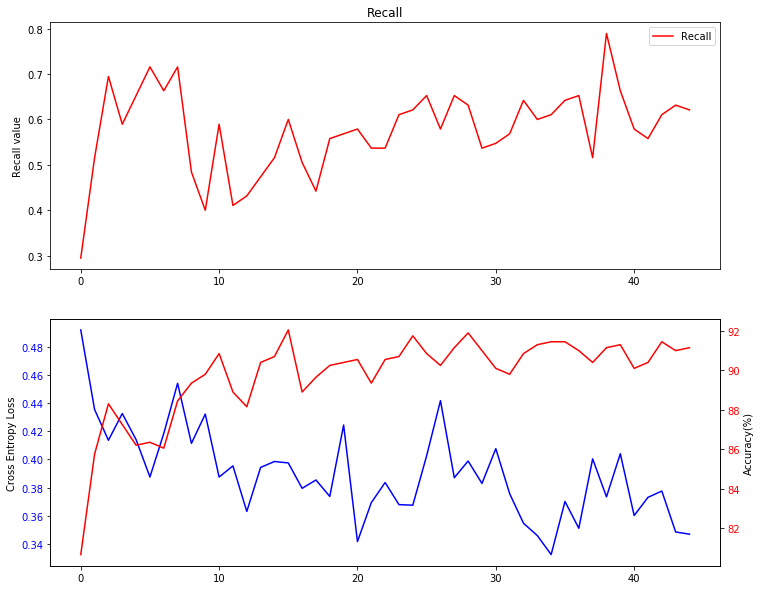

Step: 92   Cross Entropy Loss: 0.35097333788871765   Accuracy: 89.50524737631184 % 
F1 score is 0.5882352941176471 Recall score is 0.5263157894736842


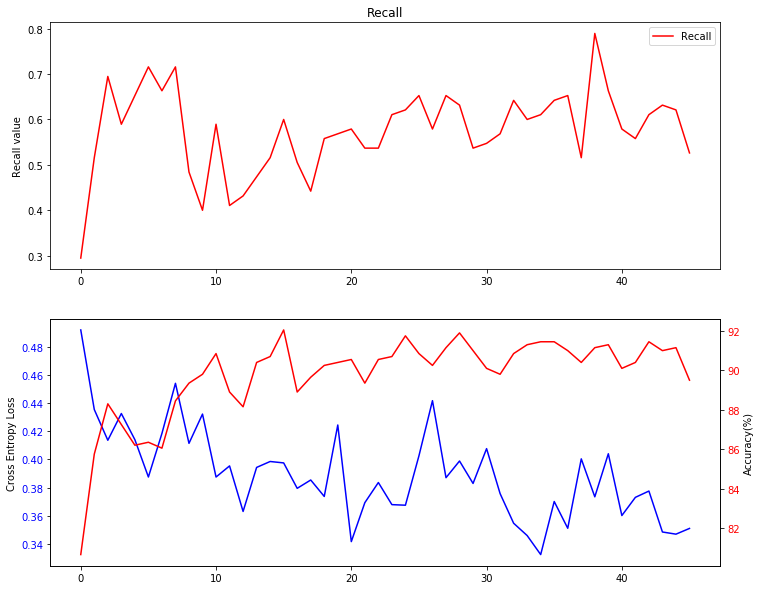

Step: 94   Cross Entropy Loss: 0.35063430666923523   Accuracy: 89.95502248875562 % 
F1 score is 0.593939393939394 Recall score is 0.5157894736842106


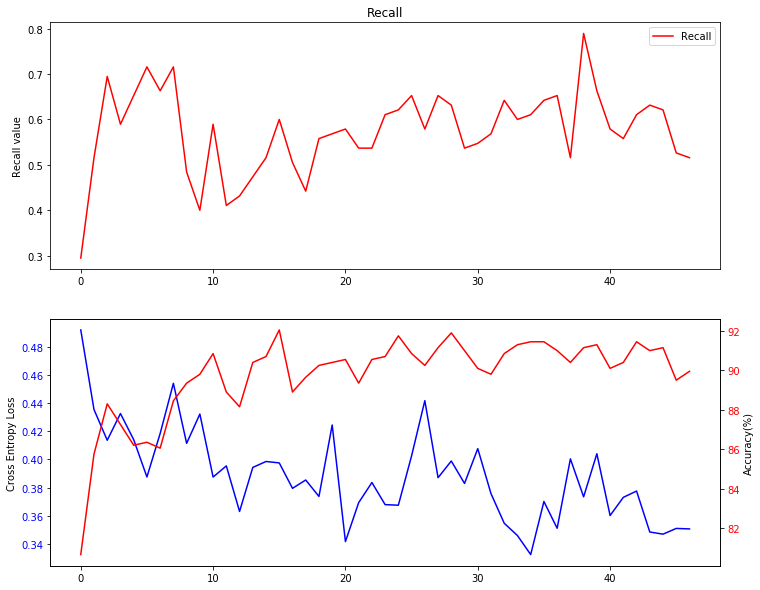

Step: 96   Cross Entropy Loss: 0.3442773222923279   Accuracy: 90.85457271364318 % 
F1 score is 0.6737967914438502 Recall score is 0.6631578947368421


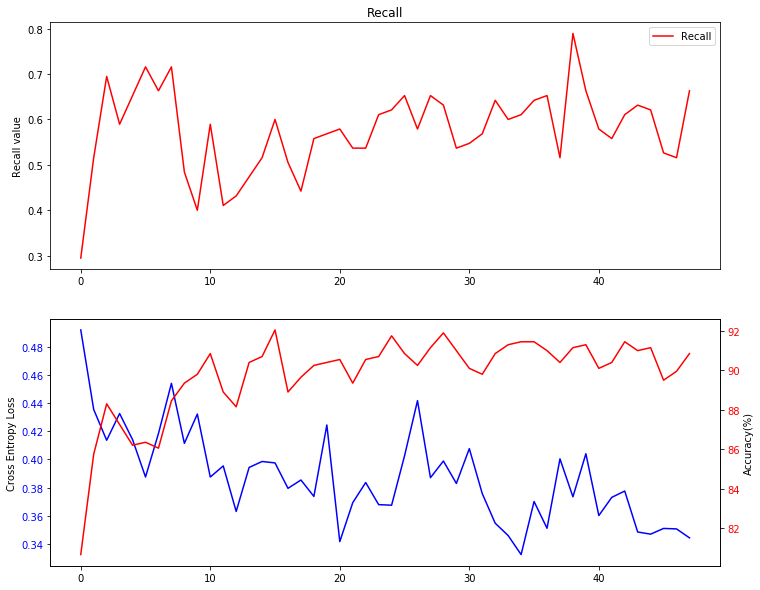

Step: 98   Cross Entropy Loss: 0.3648170828819275   Accuracy: 91.30434782608695 % 
F1 score is 0.6627906976744186 Recall score is 0.6


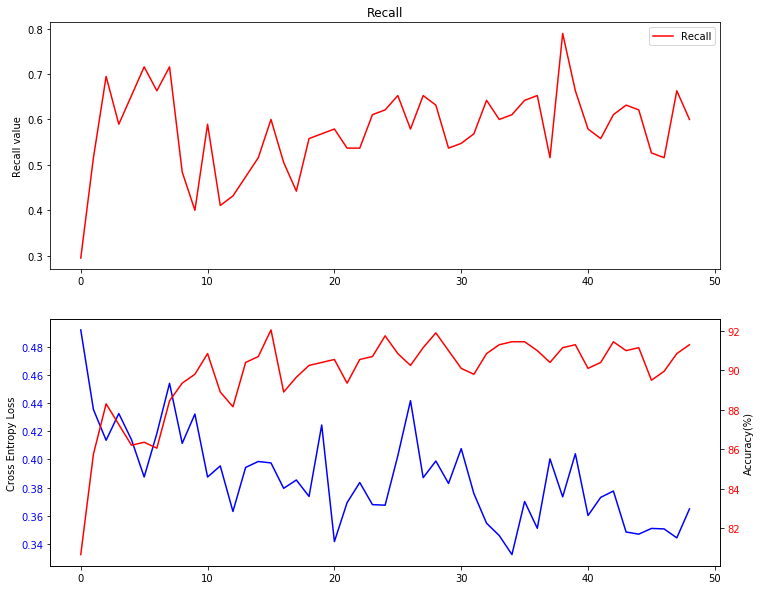

Step: 100   Cross Entropy Loss: 0.3887825310230255   Accuracy: 89.95502248875562 % 
F1 score is 0.6127167630057804 Recall score is 0.5578947368421052


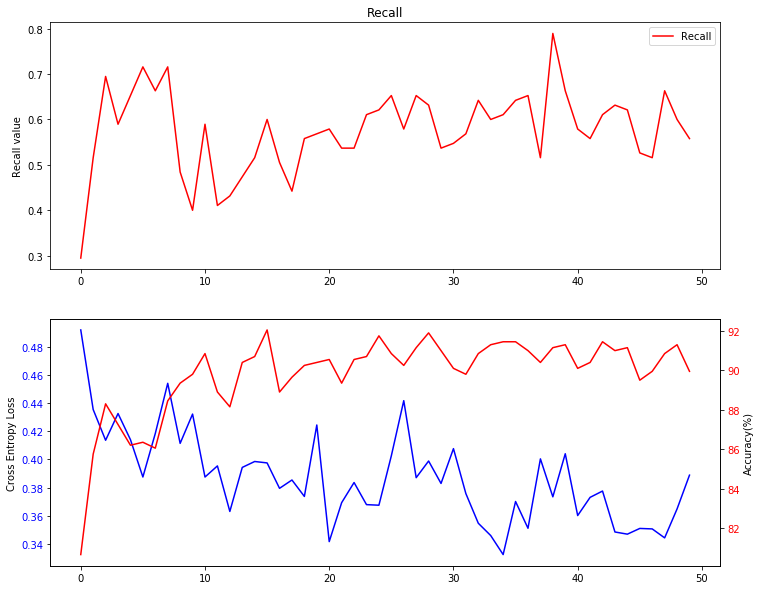

Step: 102   Cross Entropy Loss: 0.4226149320602417   Accuracy: 90.10494752623688 % 
F1 score is 0.6250000000000001 Recall score is 0.5789473684210527


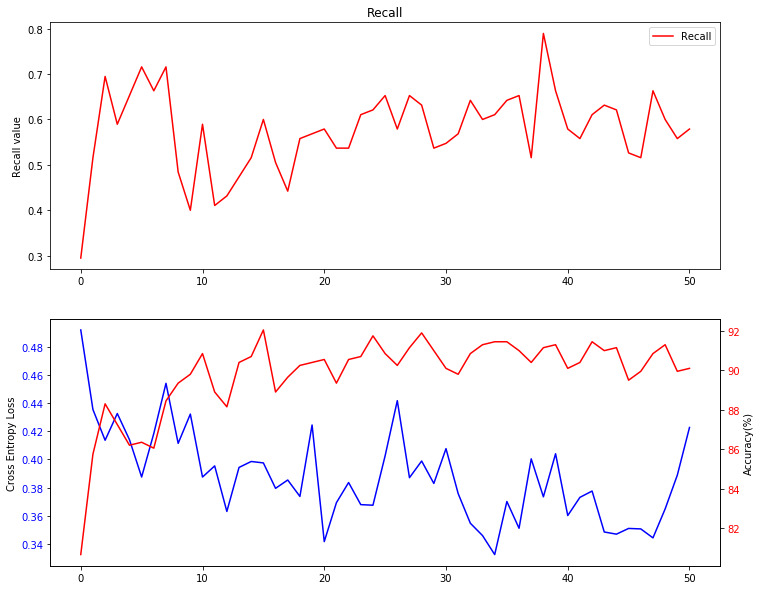

Step: 104   Cross Entropy Loss: 0.37461909651756287   Accuracy: 90.70464767616193 % 
F1 score is 0.6477272727272727 Recall score is 0.6


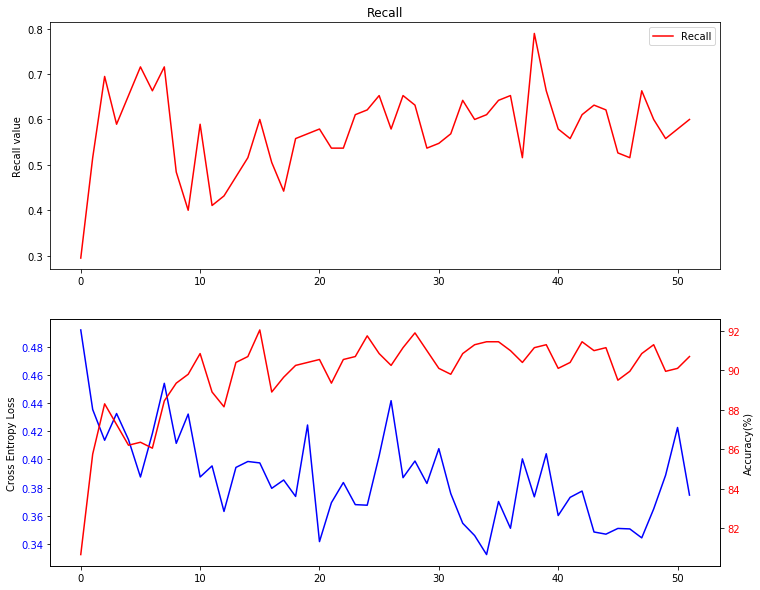

Step: 106   Cross Entropy Loss: 0.35339871048927307   Accuracy: 90.25487256371814 % 
F1 score is 0.6285714285714286 Recall score is 0.5789473684210527


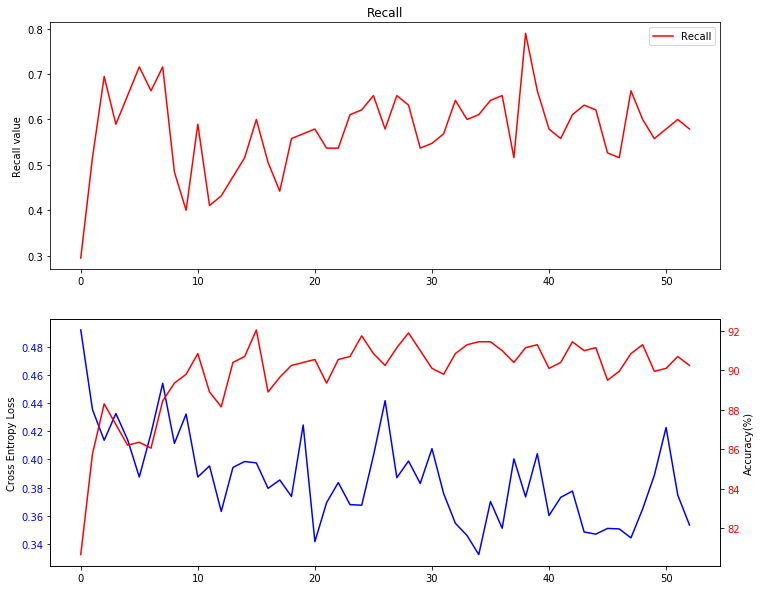

Step: 108   Cross Entropy Loss: 0.34210312366485596   Accuracy: 89.95502248875562 % 
F1 score is 0.6214689265536724 Recall score is 0.5789473684210527


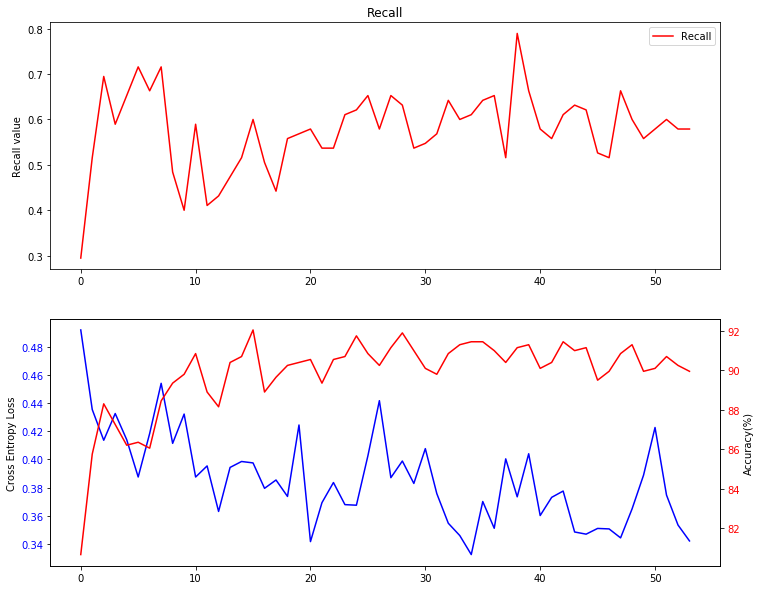

Step: 110   Cross Entropy Loss: 0.3887871205806732   Accuracy: 91.30434782608695 % 
F1 score is 0.6813186813186813 Recall score is 0.6526315789473685


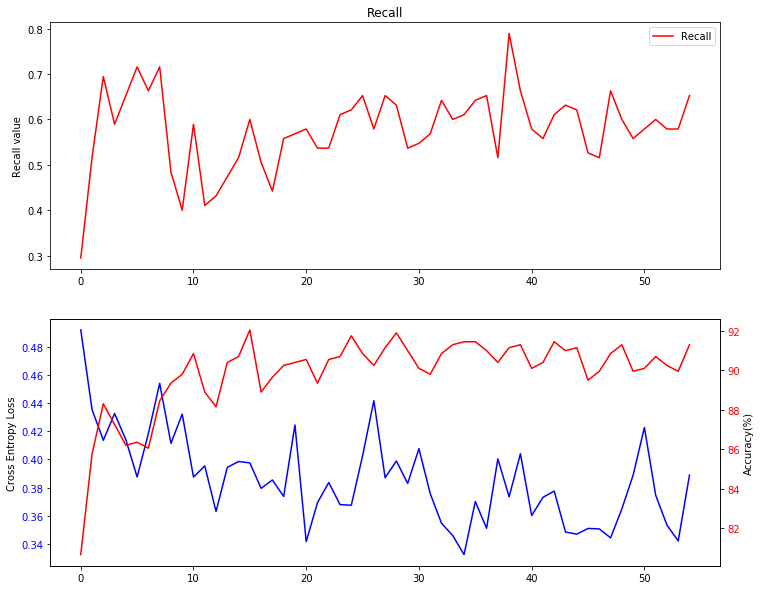

Step: 112   Cross Entropy Loss: 0.36044710874557495   Accuracy: 91.30434782608695 % 
F1 score is 0.6914893617021276 Recall score is 0.6842105263157895


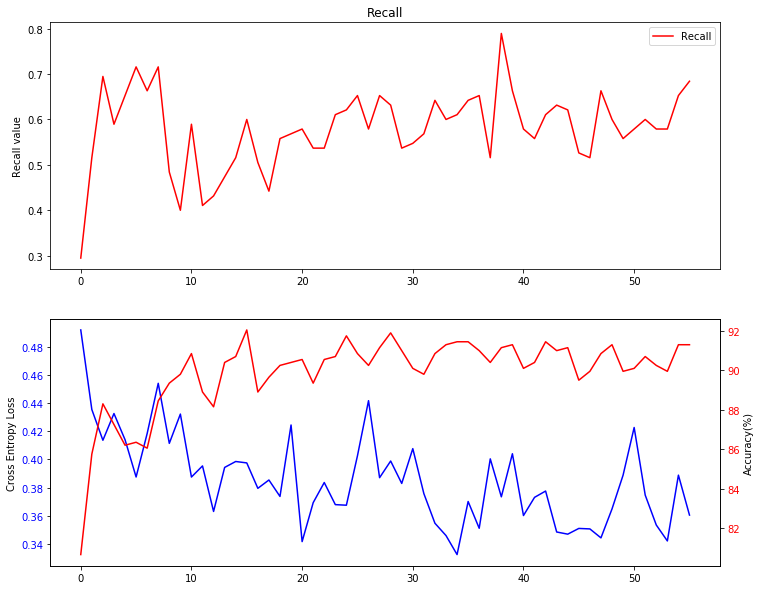

Step: 114   Cross Entropy Loss: 0.39280086755752563   Accuracy: 90.10494752623688 % 
F1 score is 0.6333333333333333 Recall score is 0.6


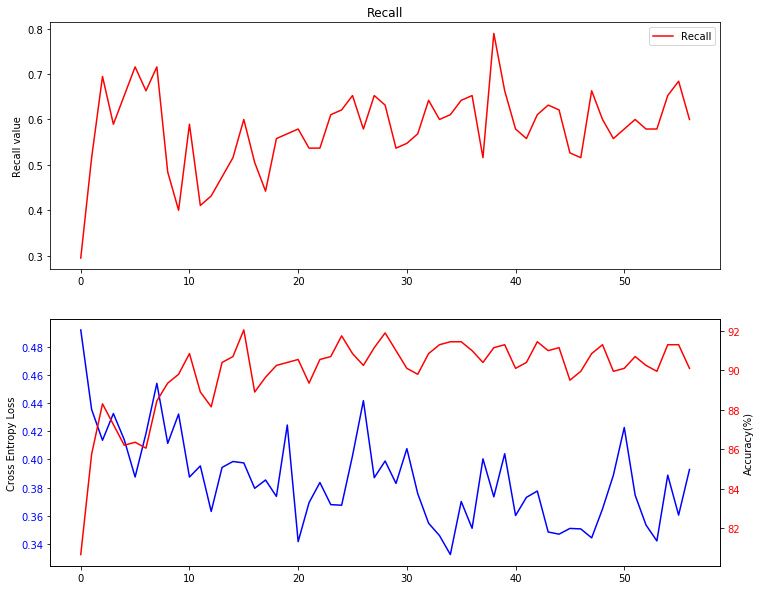

Step: 116   Cross Entropy Loss: 0.3904384672641754   Accuracy: 89.50524737631184 % 
F1 score is 0.5977011494252874 Recall score is 0.5473684210526316


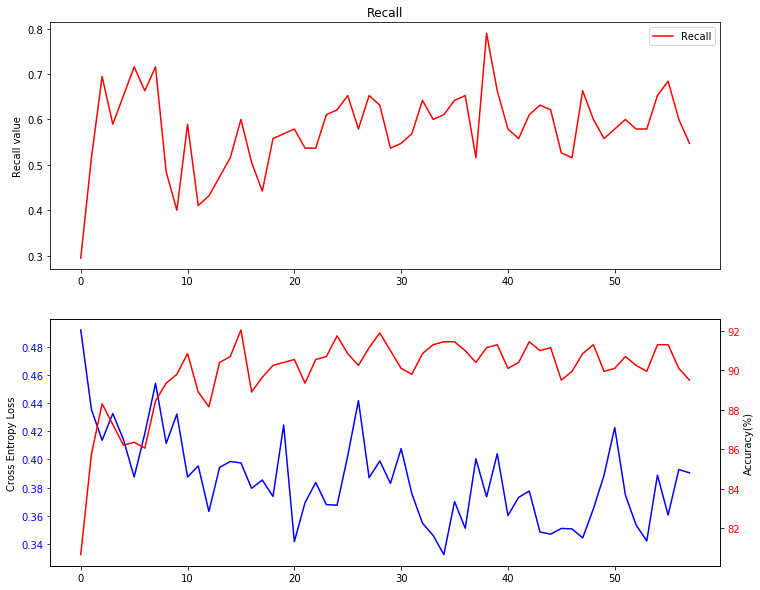

Step: 118   Cross Entropy Loss: 0.37902599573135376   Accuracy: 89.80509745127436 % 
F1 score is 0.6046511627906976 Recall score is 0.5473684210526316


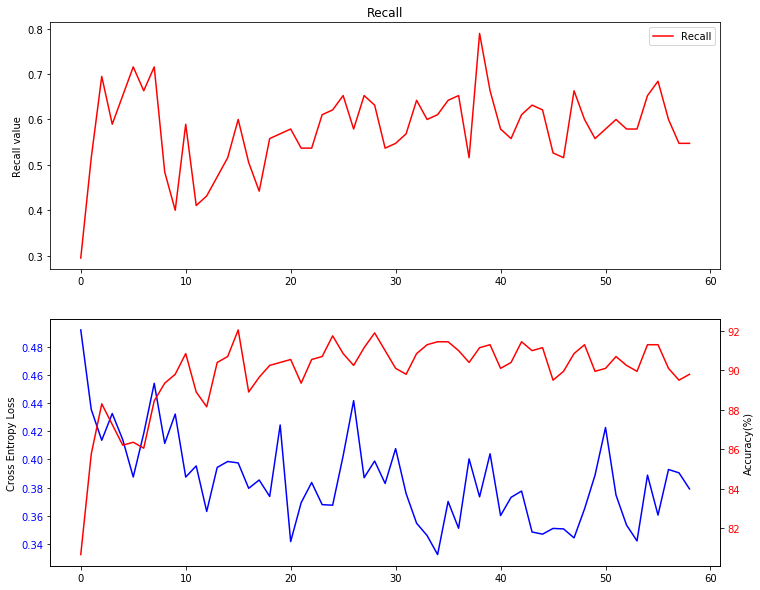

Step: 120   Cross Entropy Loss: 0.3981643617153168   Accuracy: 89.65517241379311 % 
F1 score is 0.5964912280701754 Recall score is 0.5368421052631579


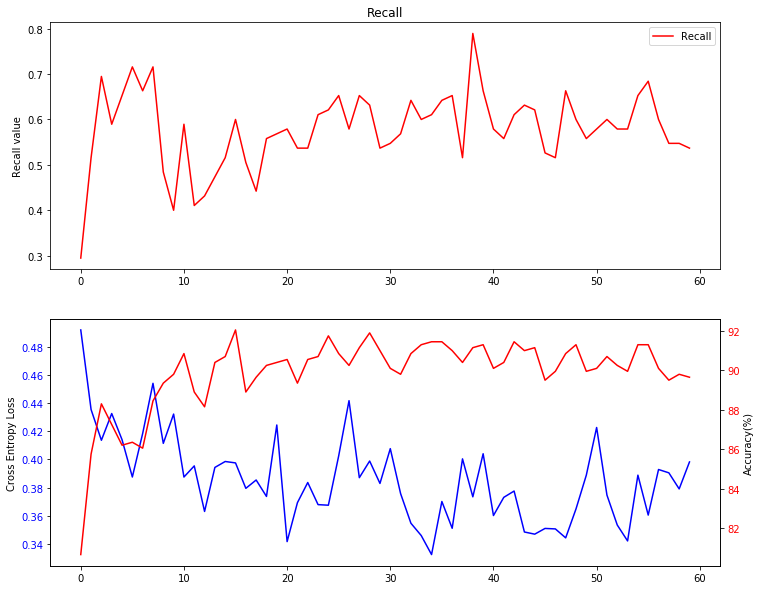

Step: 122   Cross Entropy Loss: 0.3420279622077942   Accuracy: 90.55472263868066 % 
F1 score is 0.631578947368421 Recall score is 0.5684210526315789


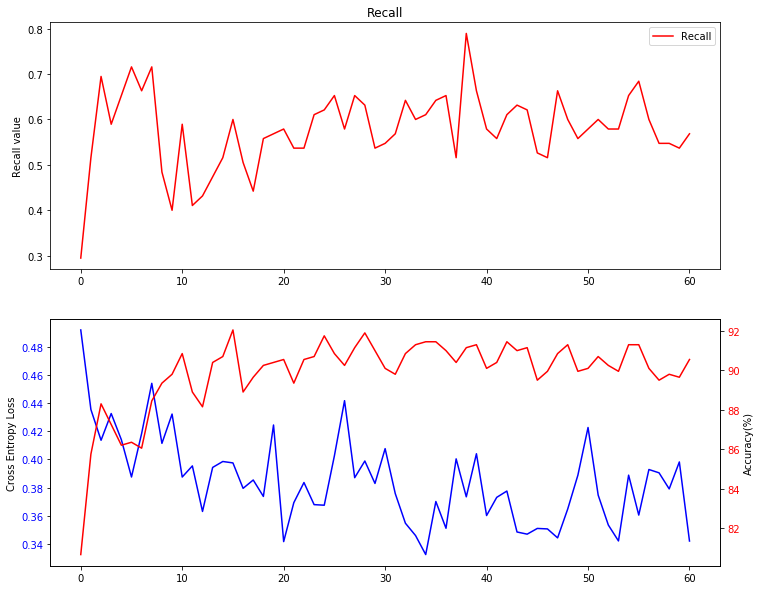

Step: 124   Cross Entropy Loss: 0.3571990430355072   Accuracy: 89.95502248875562 % 
F1 score is 0.6127167630057804 Recall score is 0.5578947368421052


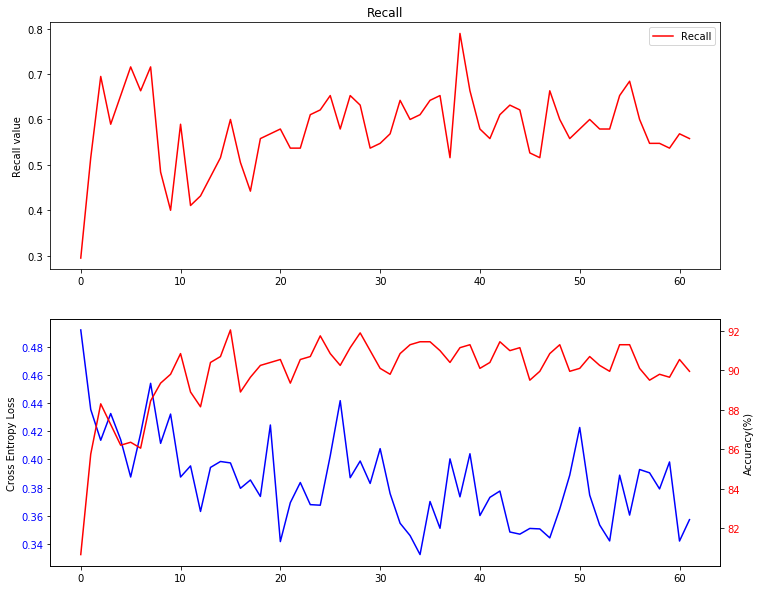

Step: 126   Cross Entropy Loss: 0.3583422303199768   Accuracy: 90.55472263868066 % 
F1 score is 0.6227544910179641 Recall score is 0.5473684210526316


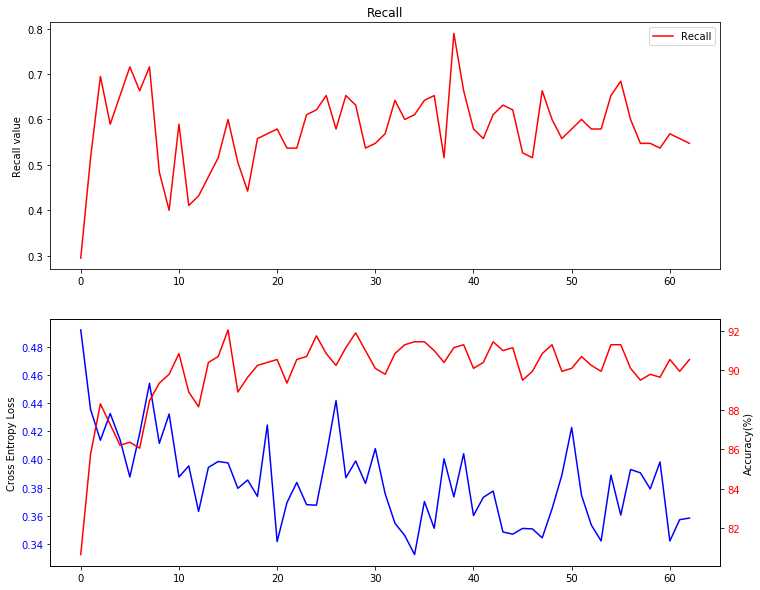

Step: 128   Cross Entropy Loss: 0.3321797251701355   Accuracy: 89.65517241379311 % 
F1 score is 0.6101694915254238 Recall score is 0.5684210526315789


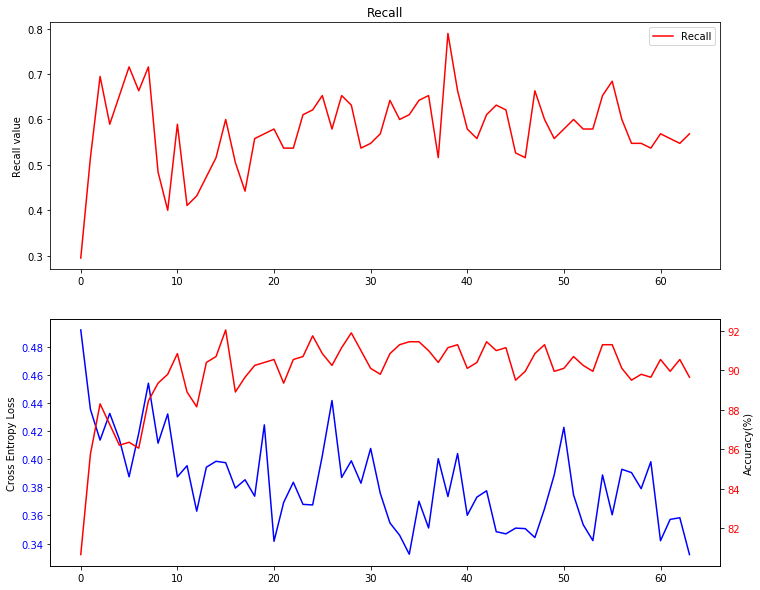

Step: 130   Cross Entropy Loss: 0.37000203132629395   Accuracy: 91.75412293853074 % 
F1 score is 0.6927374301675978 Recall score is 0.6526315789473685


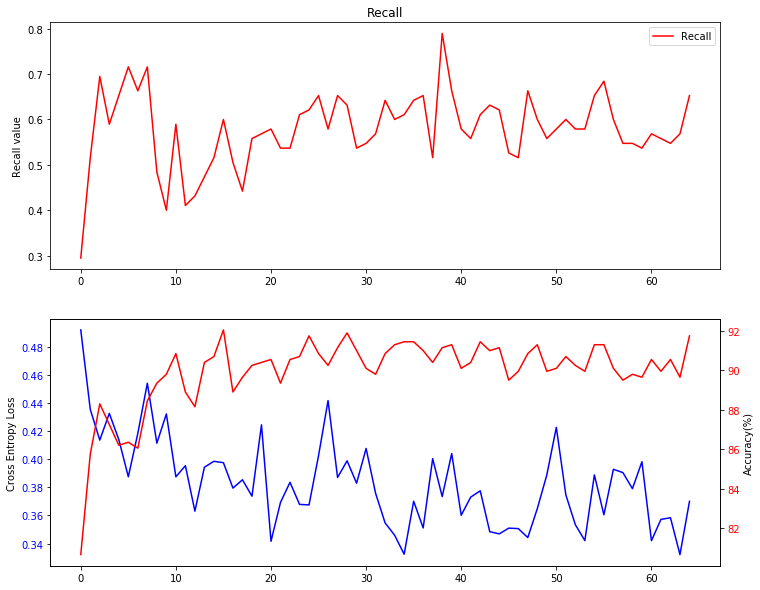

Step: 132   Cross Entropy Loss: 0.35582584142684937   Accuracy: 91.60419790104947 % 
F1 score is 0.6956521739130435 Recall score is 0.6736842105263158


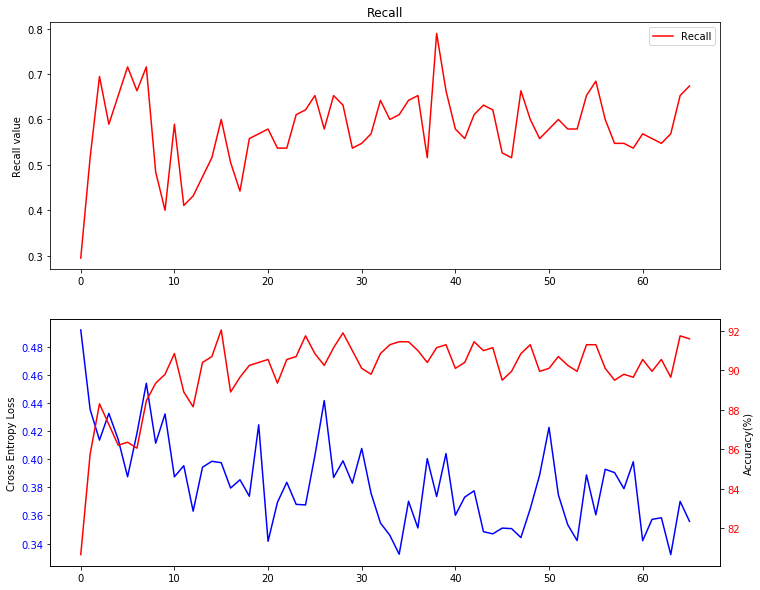

Step: 134   Cross Entropy Loss: 0.37034836411476135   Accuracy: 90.85457271364318 % 
F1 score is 0.6473988439306358 Recall score is 0.5894736842105263


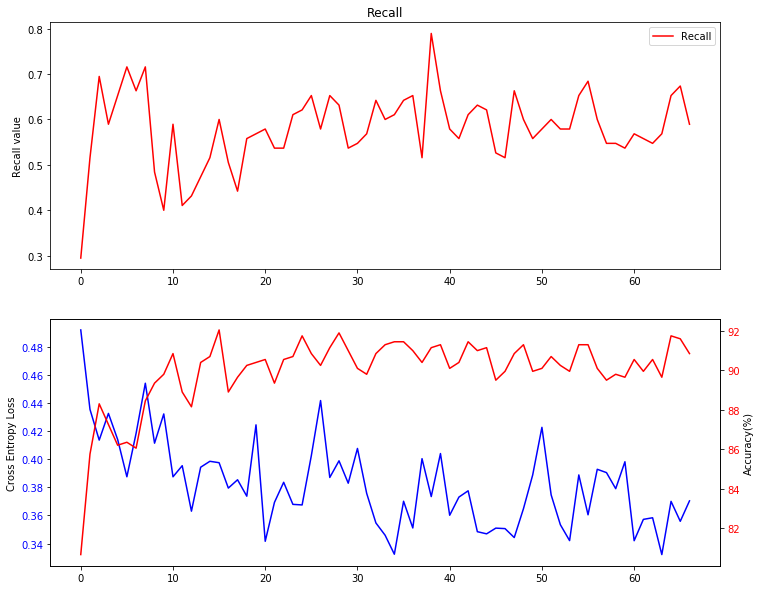

Step: 136   Cross Entropy Loss: 0.410711407661438   Accuracy: 88.6056971514243 % 
F1 score is 0.5476190476190476 Recall score is 0.4842105263157895


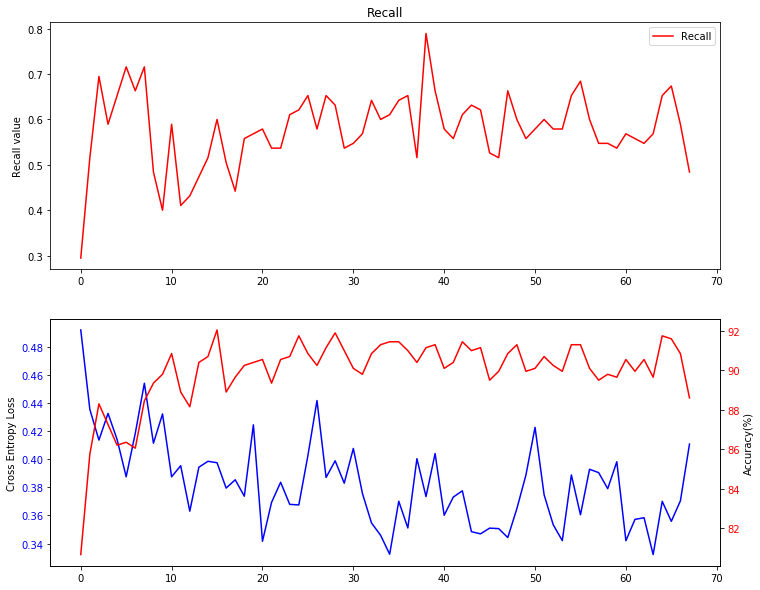

Step: 138   Cross Entropy Loss: 0.34537437558174133   Accuracy: 89.65517241379311 % 
F1 score is 0.6057142857142856 Recall score is 0.5578947368421052


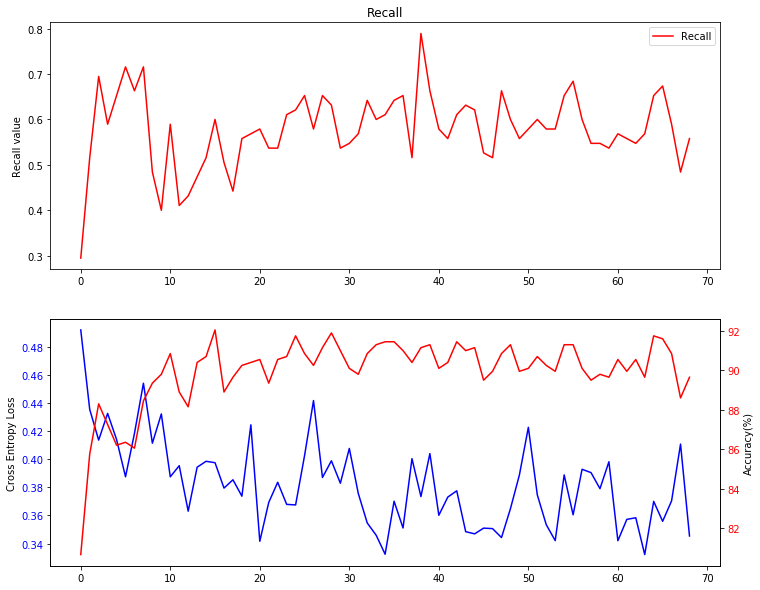

Step: 140   Cross Entropy Loss: 0.38685017824172974   Accuracy: 89.95502248875562 % 
F1 score is 0.6666666666666666 Recall score is 0.7052631578947368


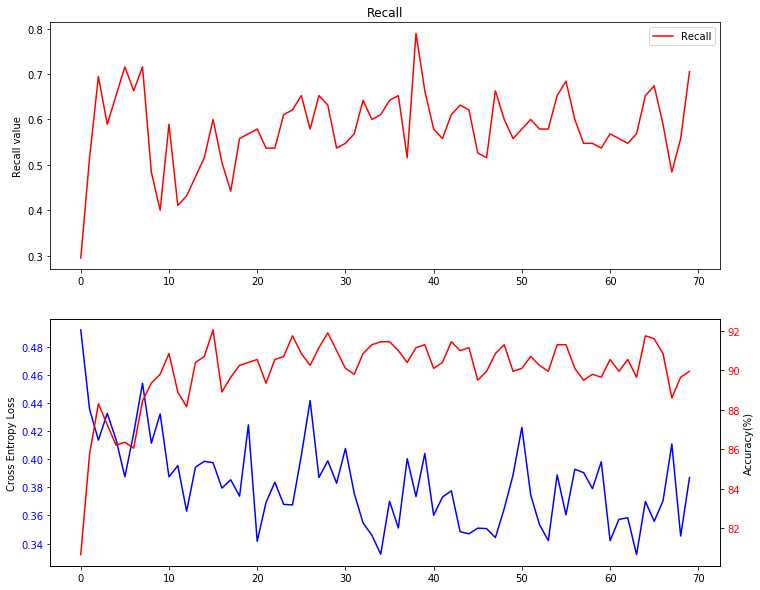

Step: 142   Cross Entropy Loss: 0.3895537853240967   Accuracy: 89.05547226386807 % 
F1 score is 0.5780346820809249 Recall score is 0.5263157894736842


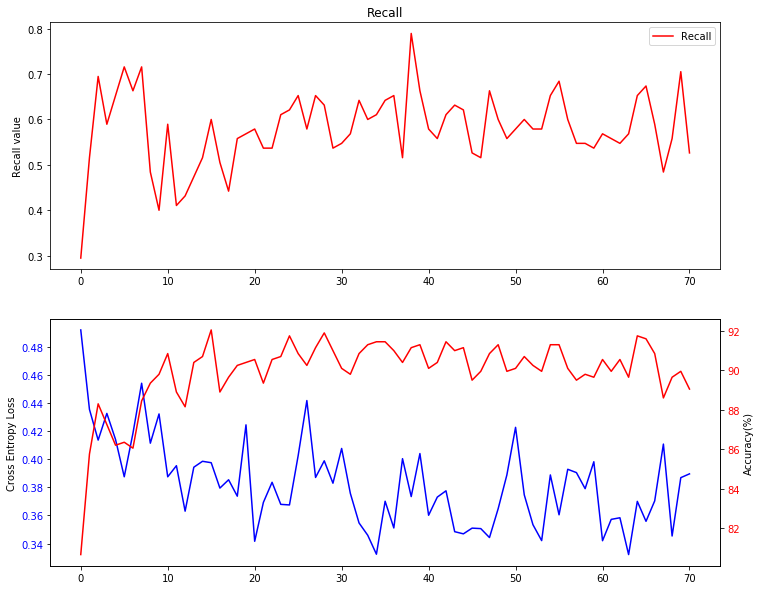

Step: 144   Cross Entropy Loss: 0.3676166832447052   Accuracy: 89.80509745127436 % 
F1 score is 0.6304347826086958 Recall score is 0.6105263157894737


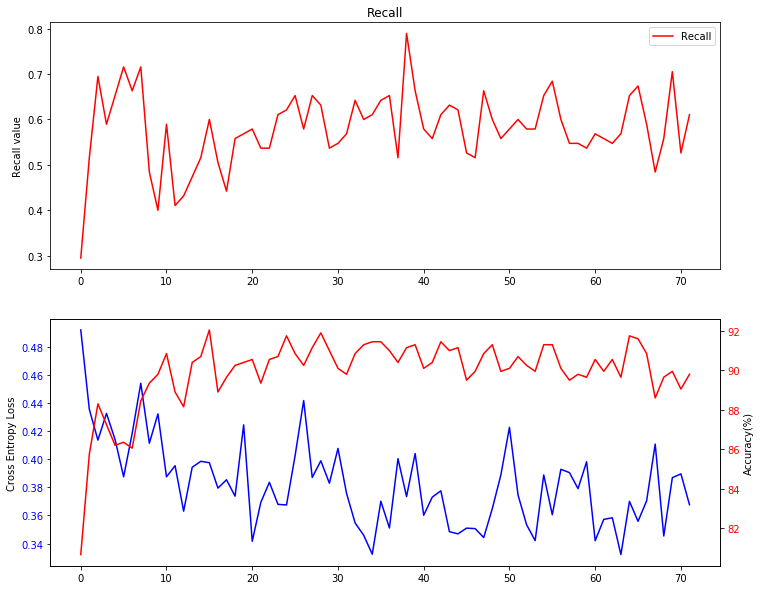

Step: 146   Cross Entropy Loss: 0.3422081470489502   Accuracy: 89.80509745127436 % 
F1 score is 0.6046511627906976 Recall score is 0.5473684210526316


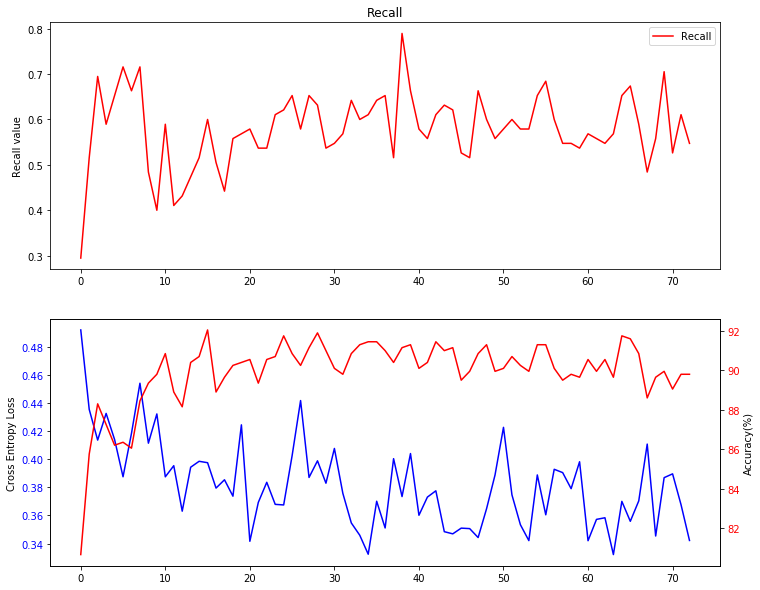

Step: 148   Cross Entropy Loss: 0.3793083727359772   Accuracy: 90.25487256371814 % 
F1 score is 0.6198830409356725 Recall score is 0.5578947368421052


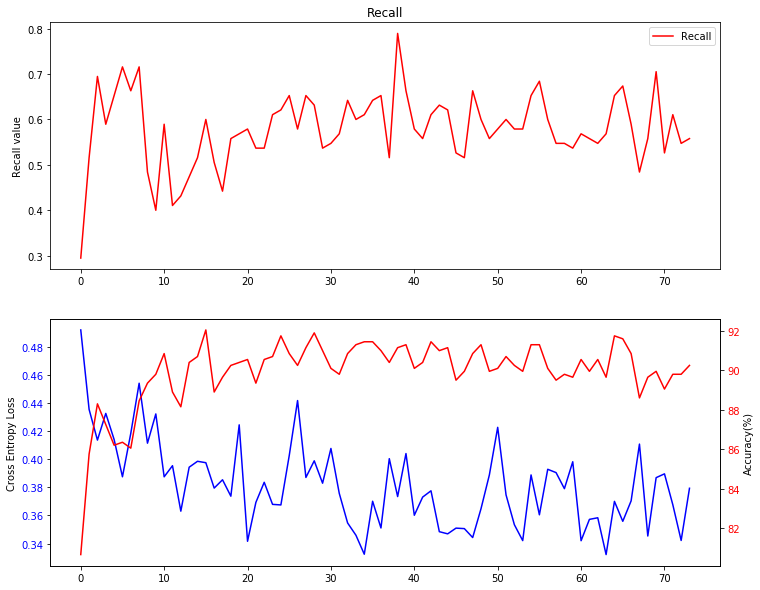

Step: 150   Cross Entropy Loss: 0.38860830664634705   Accuracy: 89.50524737631184 % 
F1 score is 0.5833333333333334 Recall score is 0.5157894736842106


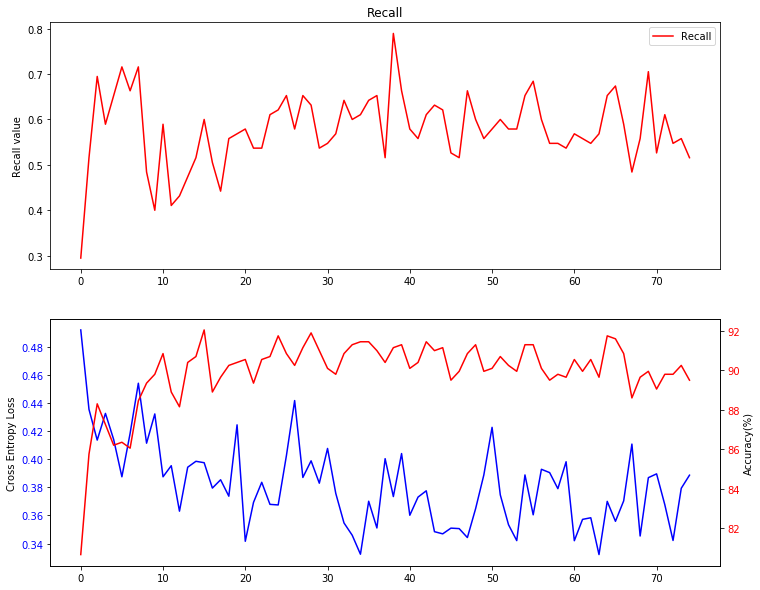

Step: 152   Cross Entropy Loss: 0.4038955271244049   Accuracy: 89.20539730134932 % 
F1 score is 0.5813953488372093 Recall score is 0.5263157894736842


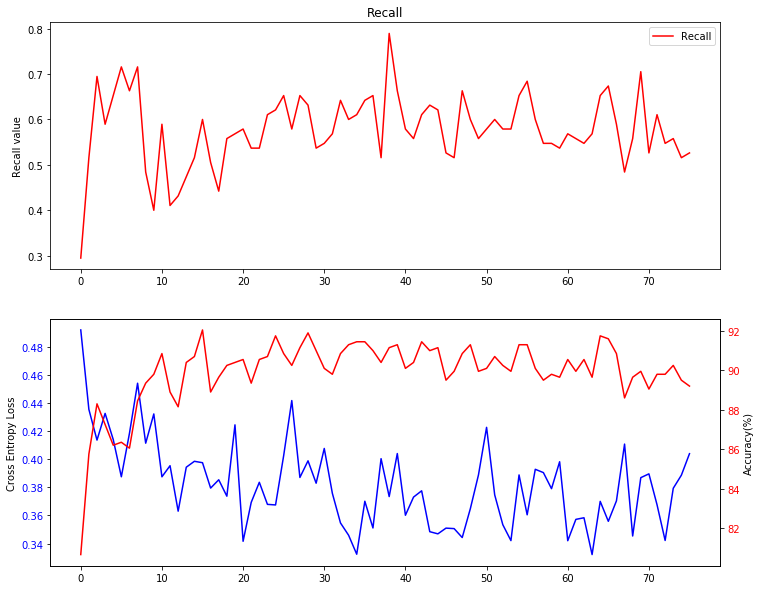

Step: 154   Cross Entropy Loss: 0.3698578476905823   Accuracy: 89.80509745127436 % 
F1 score is 0.6000000000000001 Recall score is 0.5368421052631579


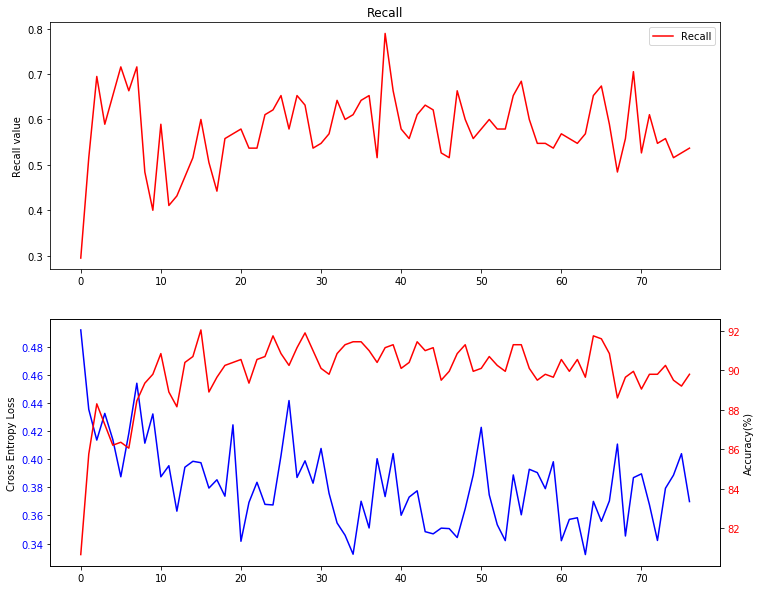

Step: 156   Cross Entropy Loss: 0.37984374165534973   Accuracy: 91.1544227886057 % 
F1 score is 0.638036809815951 Recall score is 0.5473684210526316


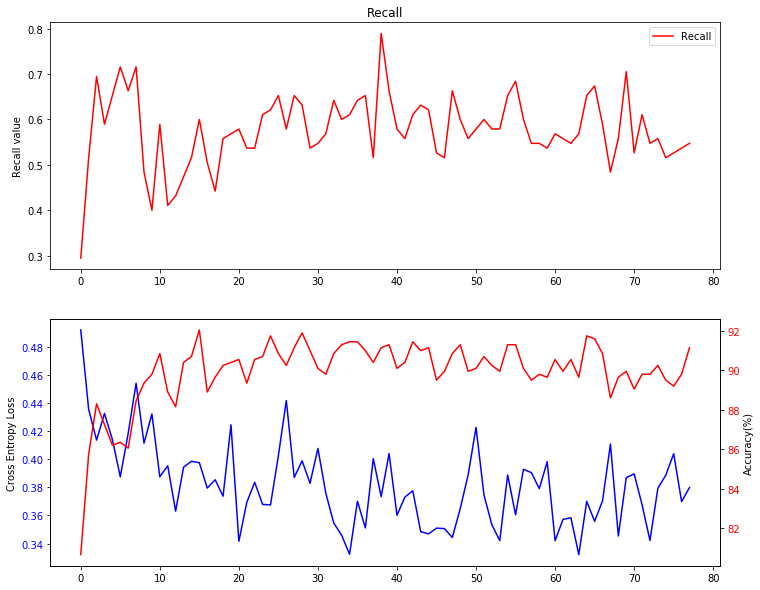

Step: 158   Cross Entropy Loss: 0.3698871433734894   Accuracy: 90.70464767616193 % 
F1 score is 0.6477272727272727 Recall score is 0.6


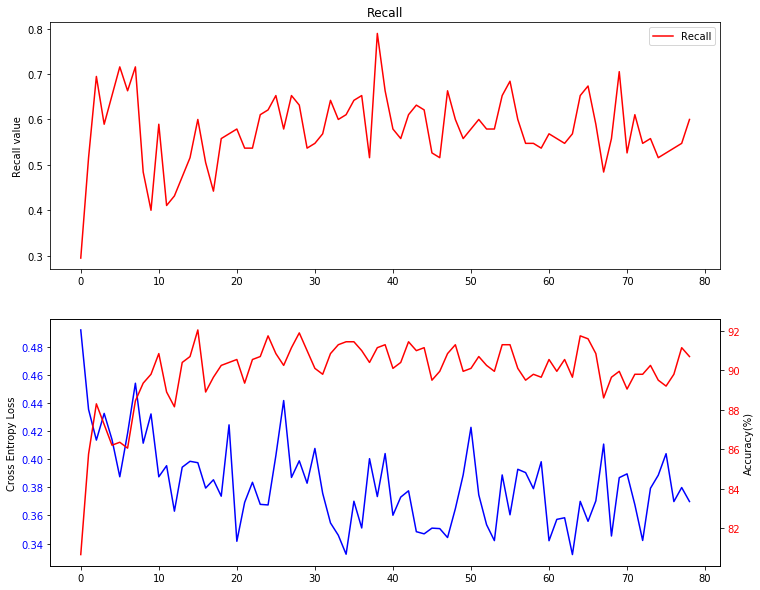

Step: 160   Cross Entropy Loss: 0.35102251172065735   Accuracy: 90.4047976011994 % 
F1 score is 0.6235294117647059 Recall score is 0.5578947368421052


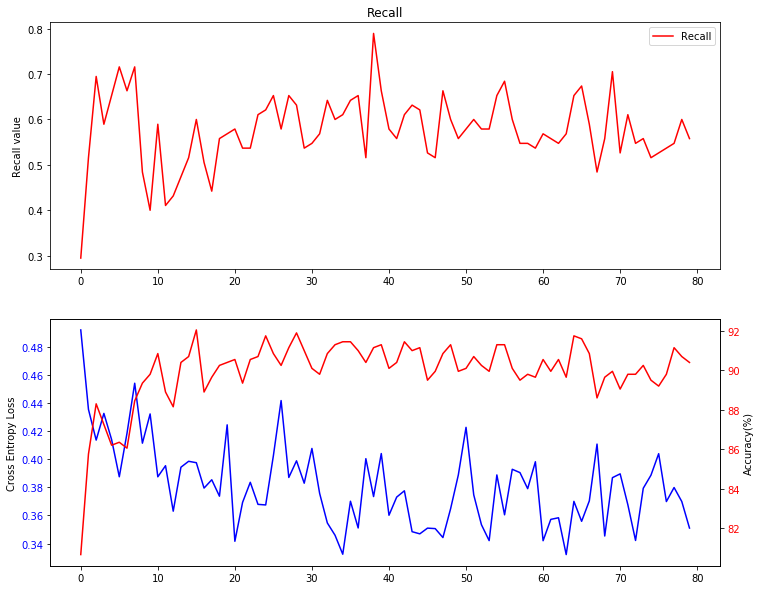

Step: 162   Cross Entropy Loss: 0.37008896470069885   Accuracy: 91.30434782608695 % 
F1 score is 0.6847826086956521 Recall score is 0.6631578947368421


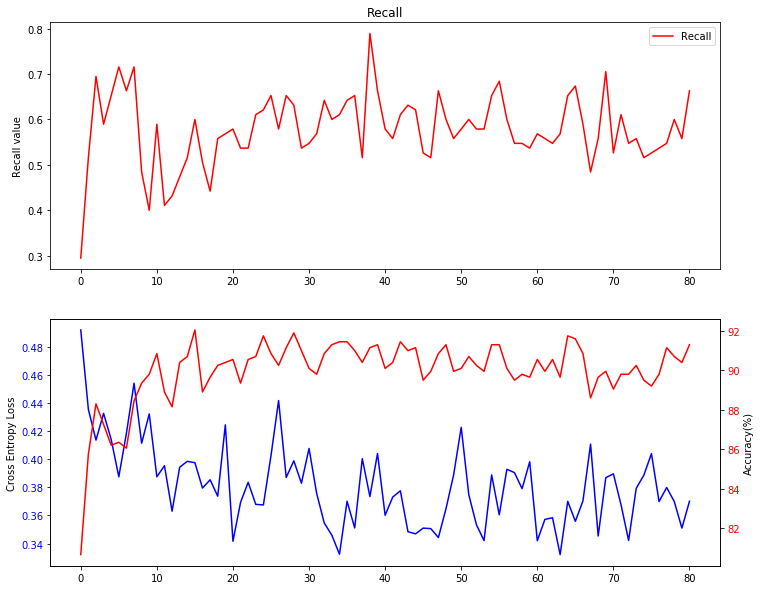

Step: 164   Cross Entropy Loss: 0.32986515760421753   Accuracy: 89.35532233883059 % 
F1 score is 0.5748502994011976 Recall score is 0.5052631578947369


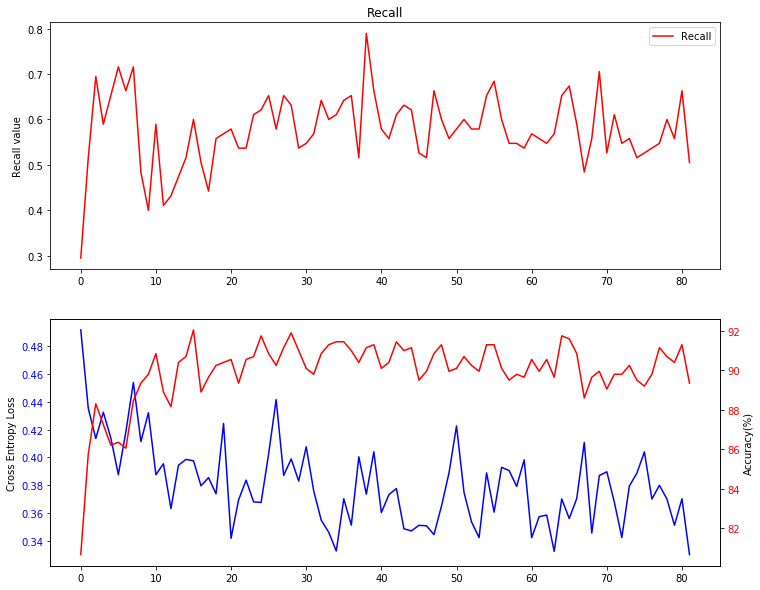

Step: 166   Cross Entropy Loss: 0.38664230704307556   Accuracy: 89.20539730134932 % 
F1 score is 0.6 Recall score is 0.5684210526315789


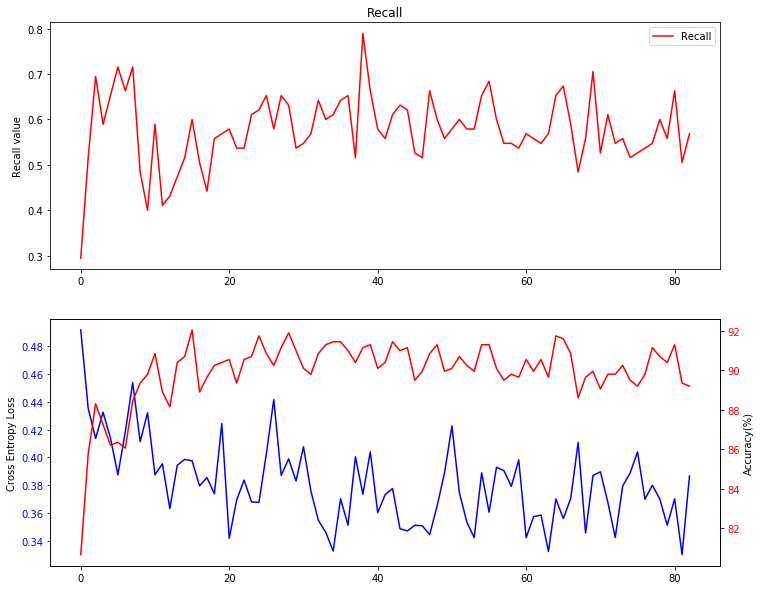

Step: 168   Cross Entropy Loss: 0.3984685242176056   Accuracy: 88.9055472263868 % 
F1 score is 0.5375000000000001 Recall score is 0.45263157894736844


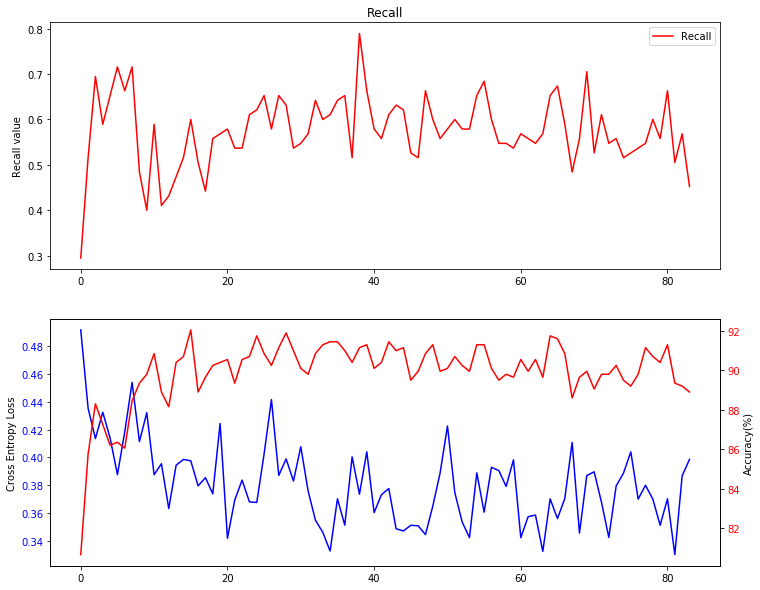

Step: 170   Cross Entropy Loss: 0.39833998680114746   Accuracy: 89.35532233883059 % 
F1 score is 0.5988700564971751 Recall score is 0.5578947368421052


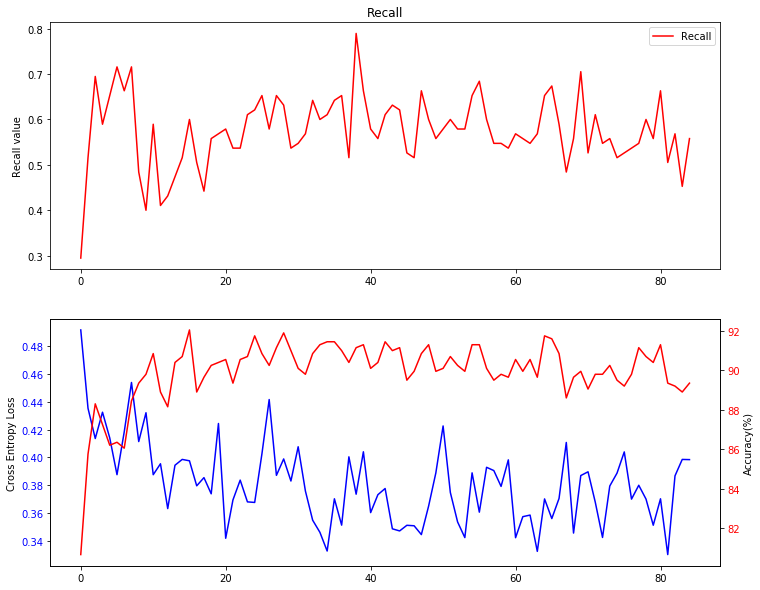

Step: 172   Cross Entropy Loss: 0.369263231754303   Accuracy: 89.95502248875562 % 
F1 score is 0.6035502958579881 Recall score is 0.5368421052631579


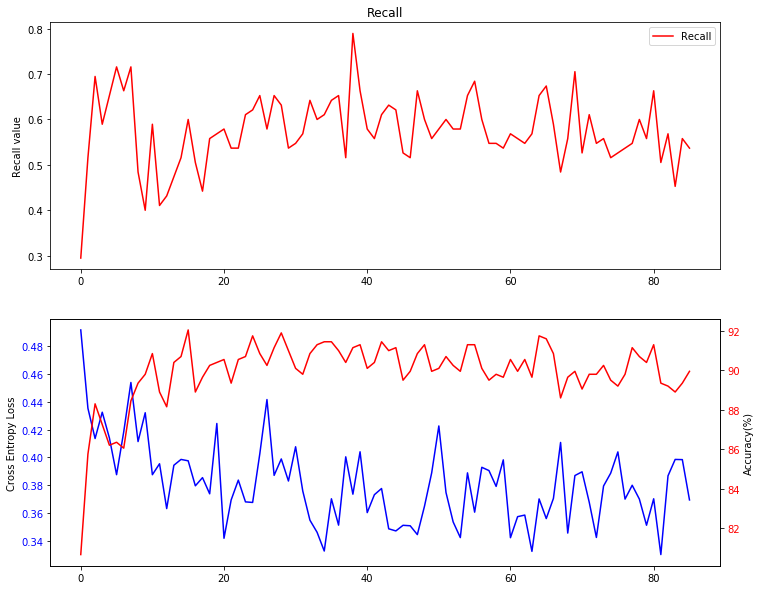

Step: 174   Cross Entropy Loss: 0.3896675407886505   Accuracy: 89.35532233883059 % 
F1 score is 0.5696969696969696 Recall score is 0.49473684210526314


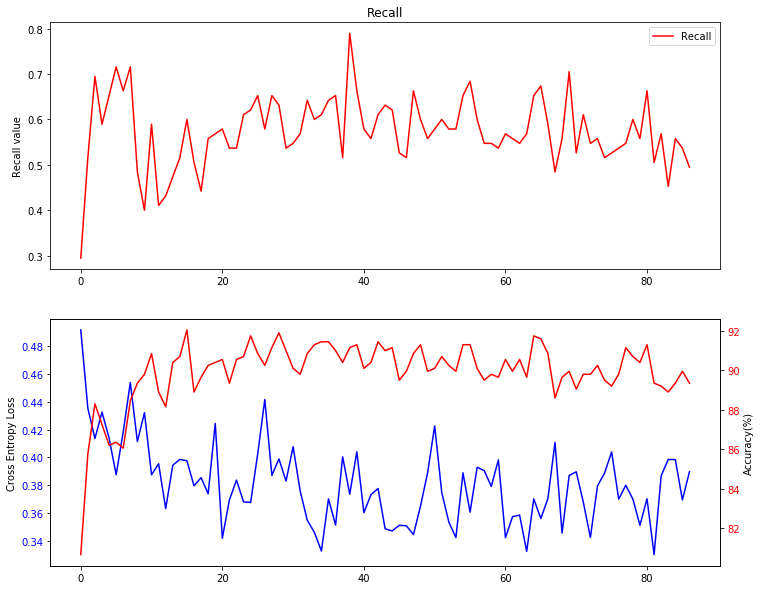

Step: 176   Cross Entropy Loss: 0.40760213136672974   Accuracy: 90.55472263868066 % 
F1 score is 0.64 Recall score is 0.5894736842105263


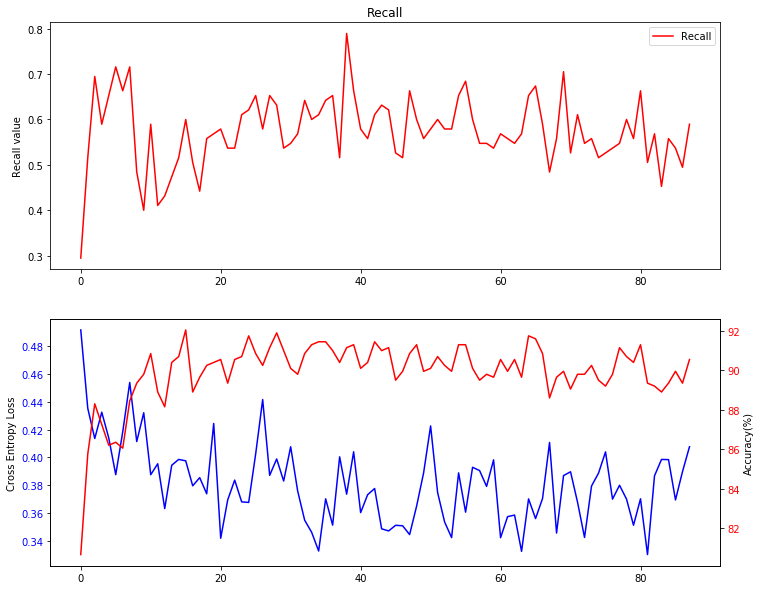

Step: 178   Cross Entropy Loss: 0.34958457946777344   Accuracy: 89.80509745127436 % 
F1 score is 0.6179775280898877 Recall score is 0.5789473684210527


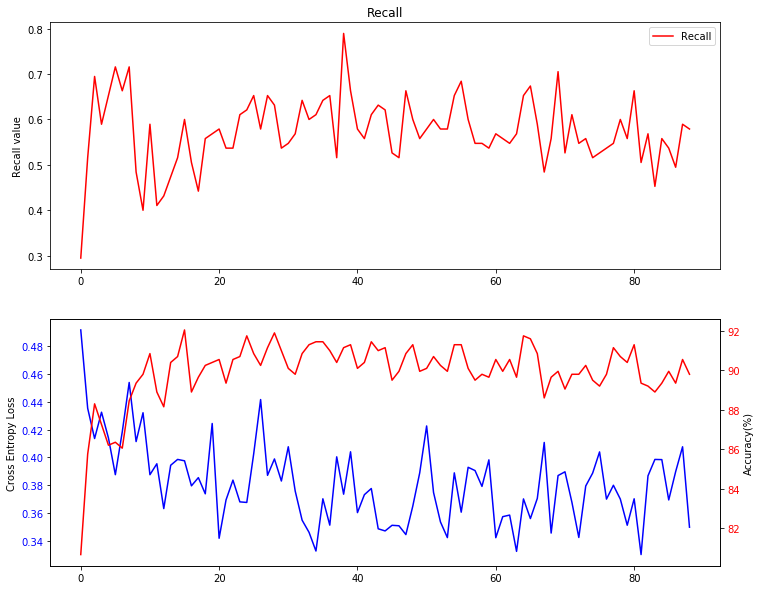

Step: 180   Cross Entropy Loss: 0.3748805522918701   Accuracy: 90.10494752623688 % 
F1 score is 0.5822784810126582 Recall score is 0.4842105263157895


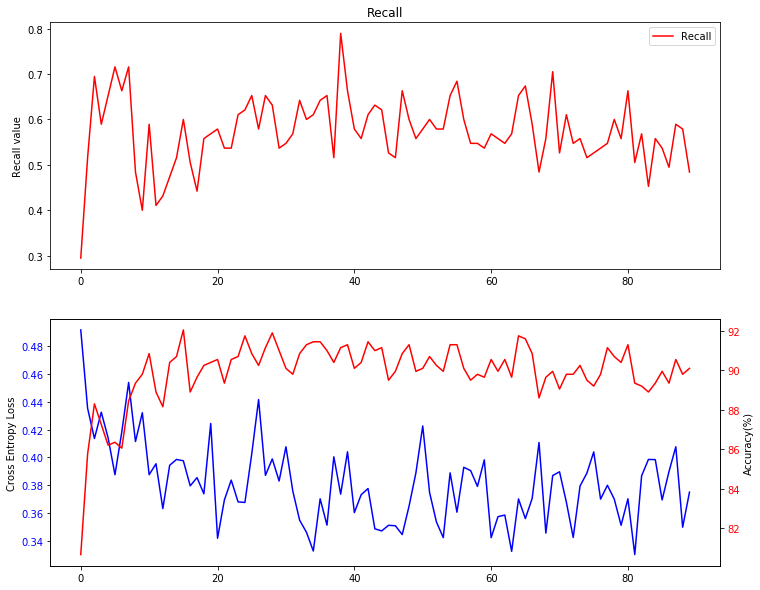

Step: 182   Cross Entropy Loss: 0.389055073261261   Accuracy: 91.00449775112443 % 
F1 score is 0.6511627906976745 Recall score is 0.5894736842105263


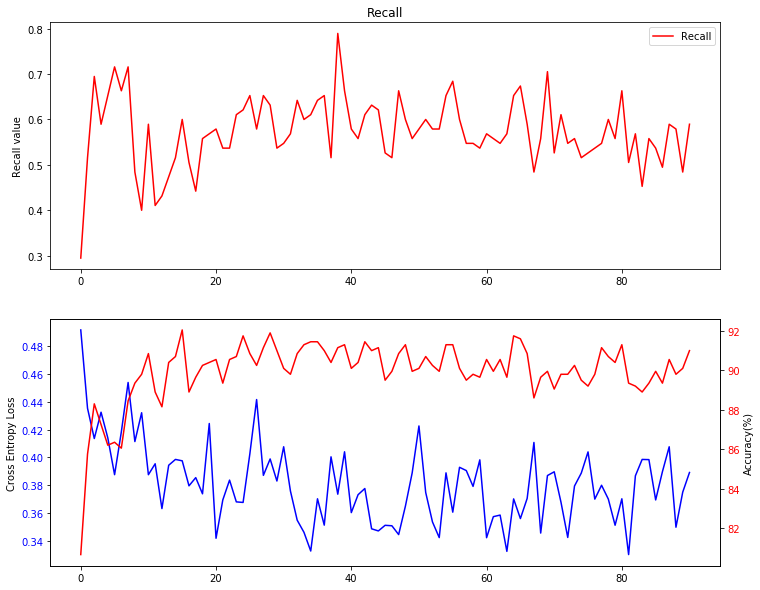

Step: 184   Cross Entropy Loss: 0.34171727299690247   Accuracy: 90.4047976011994 % 
F1 score is 0.6144578313253012 Recall score is 0.5368421052631579


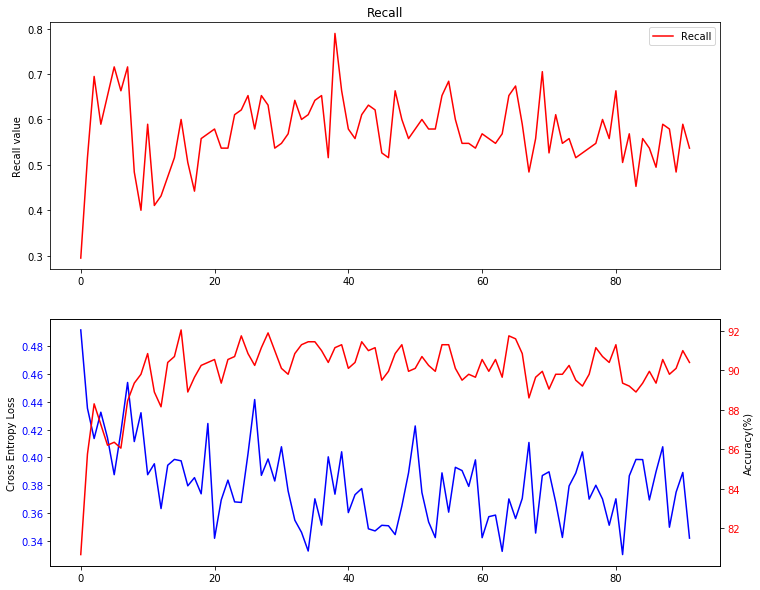

Step: 186   Cross Entropy Loss: 0.32271483540534973   Accuracy: 90.70464767616193 % 
F1 score is 0.6352941176470588 Recall score is 0.5684210526315789


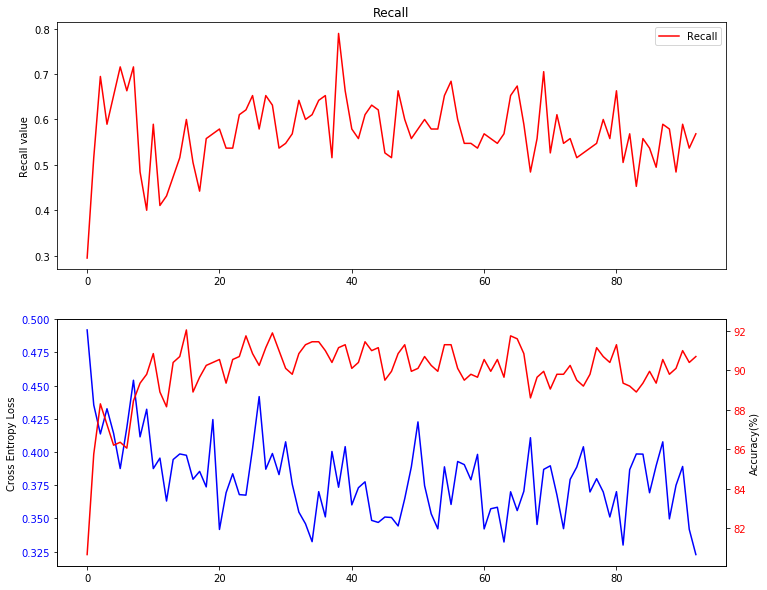

Step: 188   Cross Entropy Loss: 0.34101203083992004   Accuracy: 90.70464767616193 % 
F1 score is 0.6436781609195403 Recall score is 0.5894736842105263


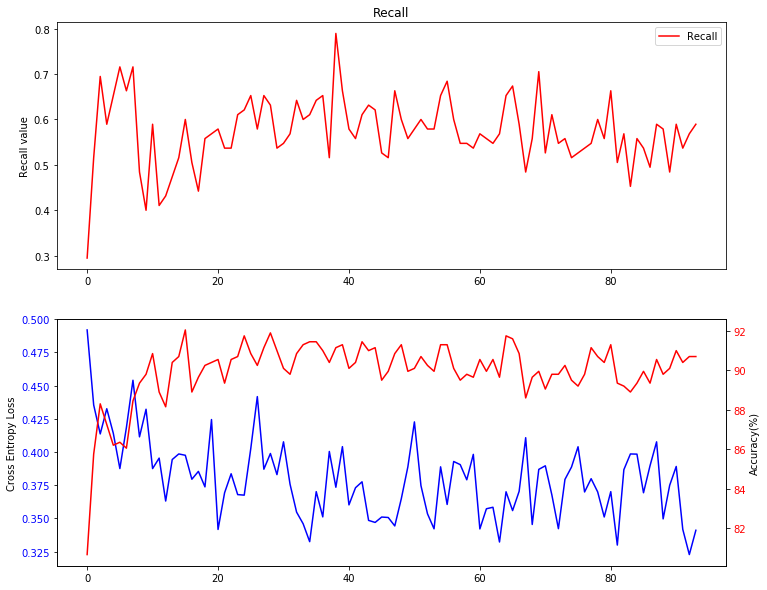

Step: 190   Cross Entropy Loss: 0.35092100501060486   Accuracy: 89.80509745127436 % 
F1 score is 0.6000000000000001 Recall score is 0.5368421052631579


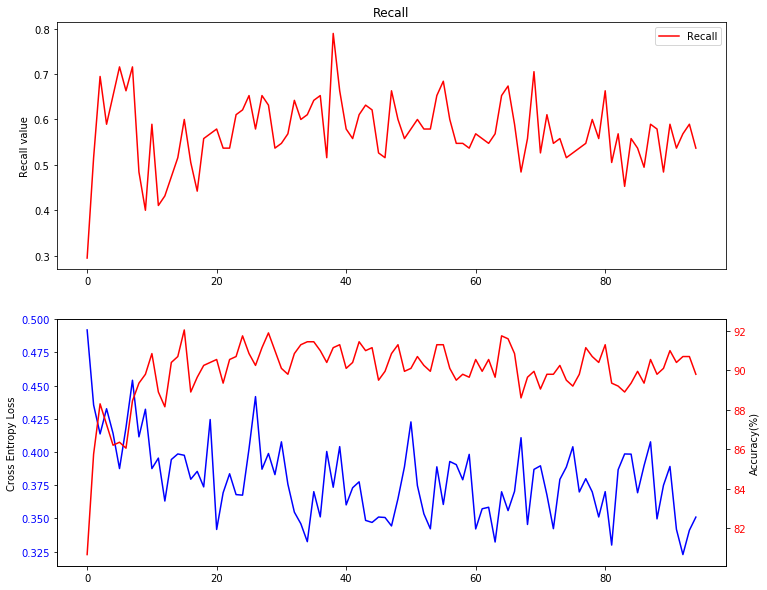

Step: 192   Cross Entropy Loss: 0.34179118275642395   Accuracy: 90.25487256371814 % 
F1 score is 0.6285714285714286 Recall score is 0.5789473684210527


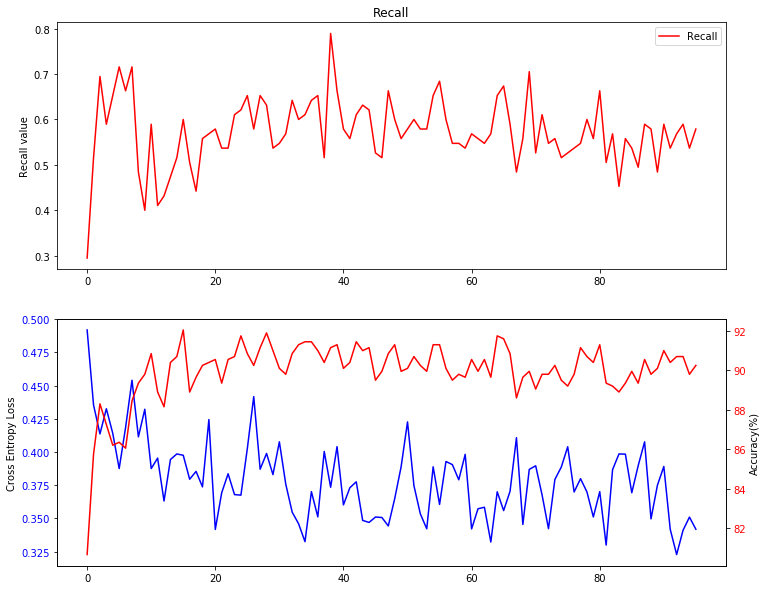

Step: 194   Cross Entropy Loss: 0.34669649600982666   Accuracy: 88.75562218890555 % 
F1 score is 0.5664739884393064 Recall score is 0.5157894736842106


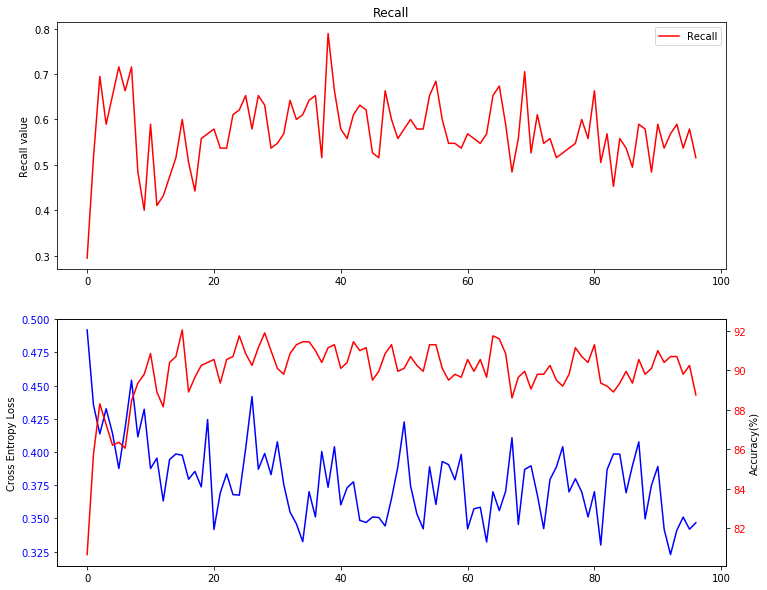

Step: 196   Cross Entropy Loss: 0.34306198358535767   Accuracy: 91.1544227886057 % 
F1 score is 0.6628571428571429 Recall score is 0.6105263157894737


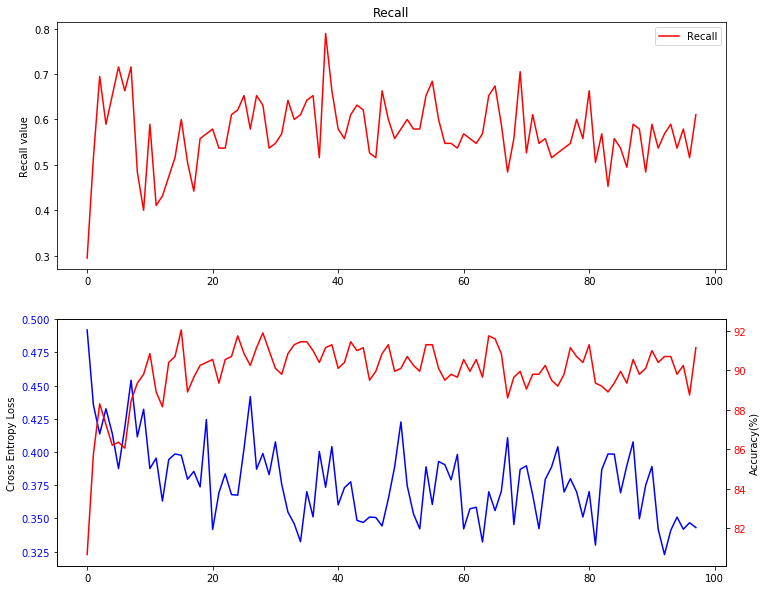

Step: 198   Cross Entropy Loss: 0.35124096274375916   Accuracy: 89.80509745127436 % 
F1 score is 0.6136363636363636 Recall score is 0.5684210526315789


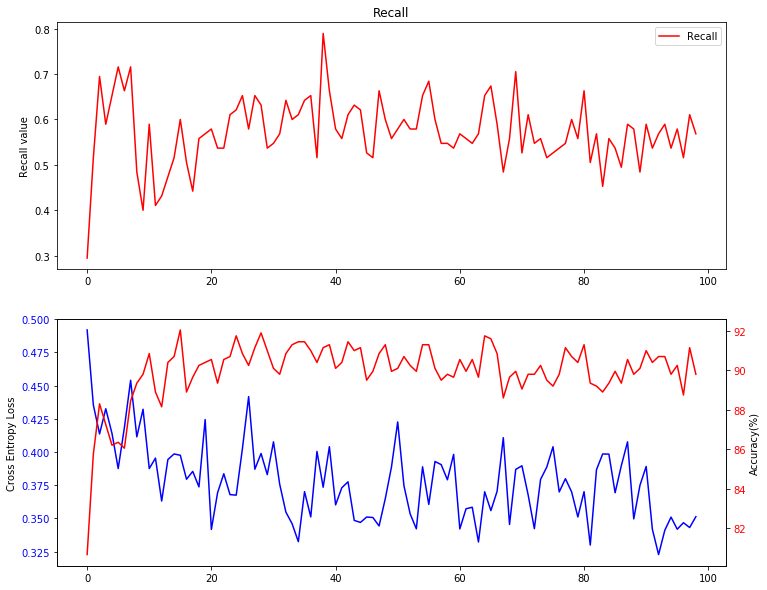

Step: 200   Cross Entropy Loss: 0.3596663475036621   Accuracy: 89.65517241379311 % 
F1 score is 0.5964912280701754 Recall score is 0.5368421052631579


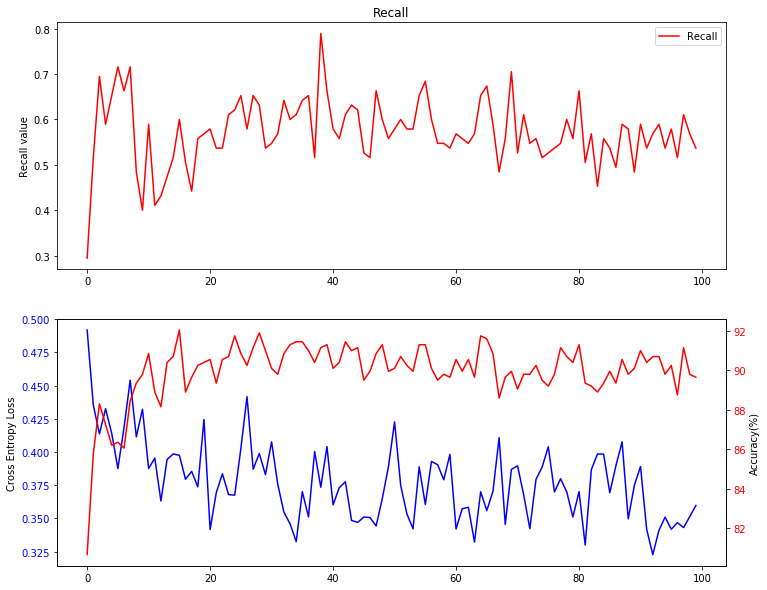

Step: 202   Cross Entropy Loss: 0.3161686658859253   Accuracy: 90.85457271364318 % 
F1 score is 0.6473988439306358 Recall score is 0.5894736842105263


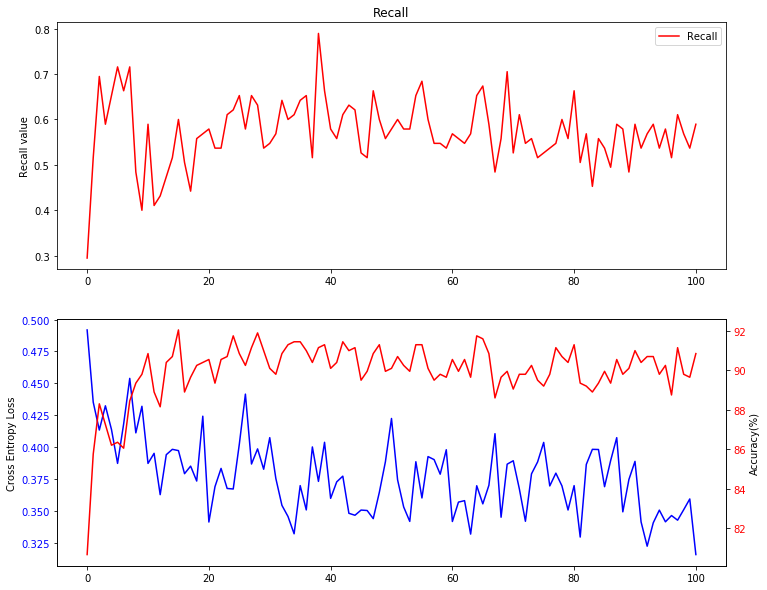

Step: 204   Cross Entropy Loss: 0.33250778913497925   Accuracy: 89.65517241379311 % 
F1 score is 0.5917159763313609 Recall score is 0.5263157894736842


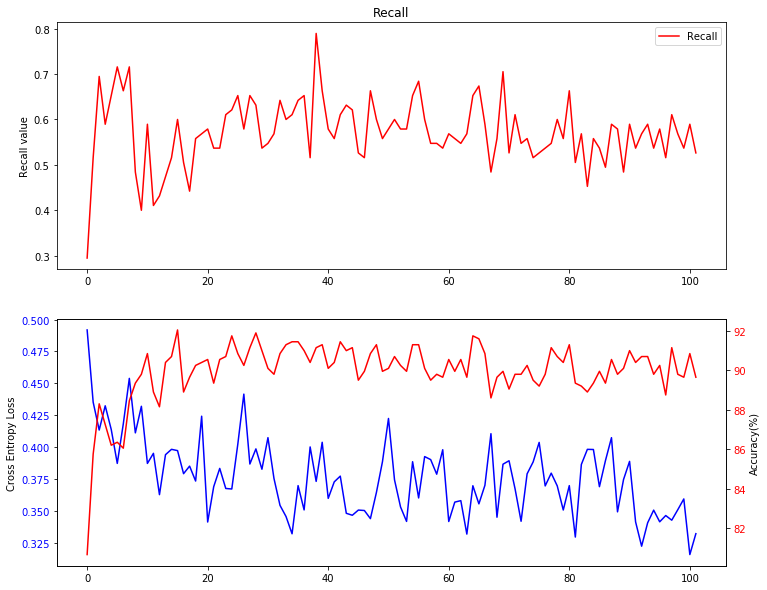

Step: 206   Cross Entropy Loss: 0.38298362493515015   Accuracy: 89.95502248875562 % 
F1 score is 0.6214689265536724 Recall score is 0.5789473684210527


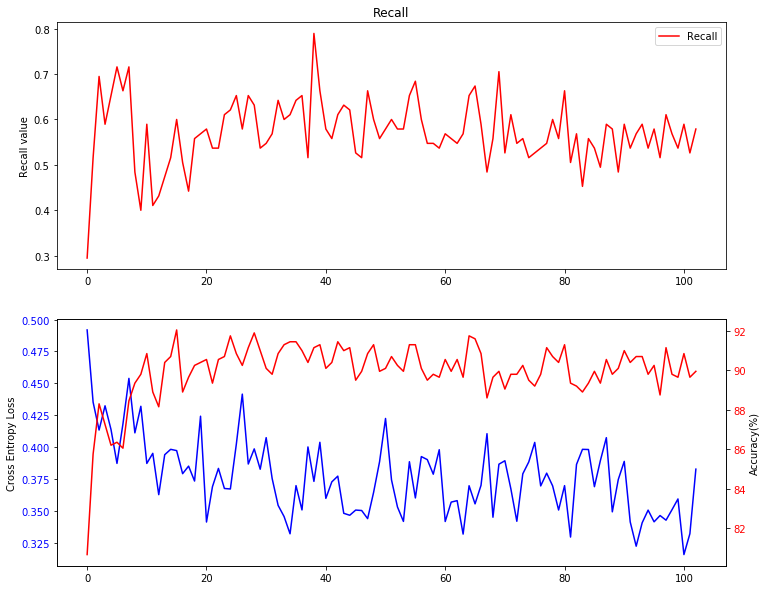

Step: 208   Cross Entropy Loss: 0.351505309343338   Accuracy: 90.55472263868066 % 
F1 score is 0.6557377049180327 Recall score is 0.631578947368421


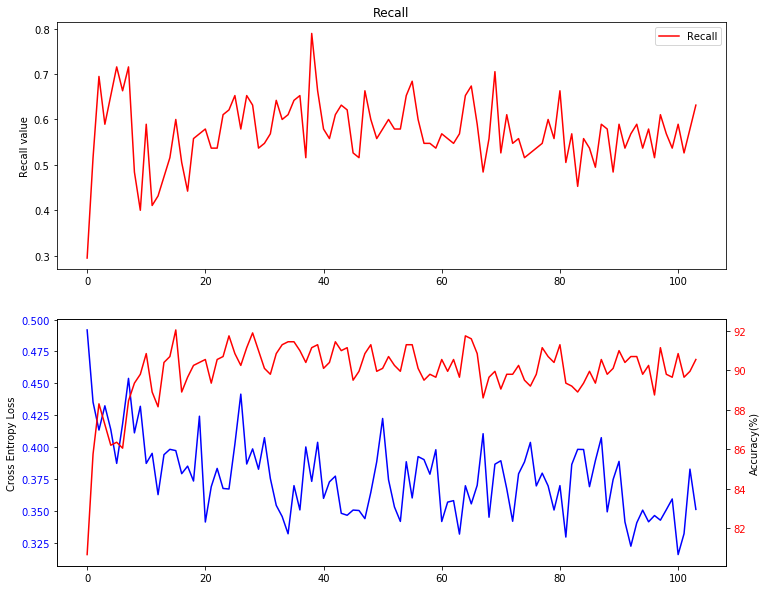

Step: 210   Cross Entropy Loss: 0.3604416847229004   Accuracy: 89.65517241379311 % 
F1 score is 0.5766871165644172 Recall score is 0.49473684210526314


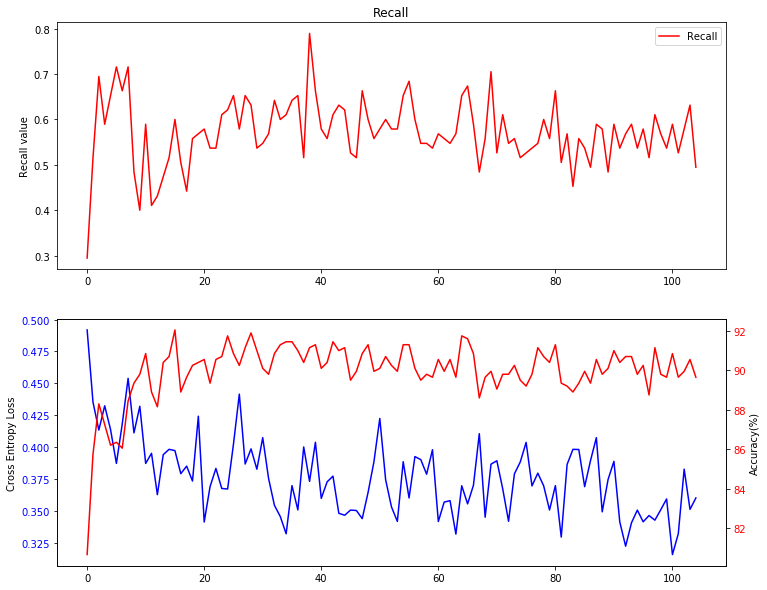

Step: 212   Cross Entropy Loss: 0.33197441697120667   Accuracy: 89.80509745127436 % 
F1 score is 0.6421052631578947 Recall score is 0.6421052631578947


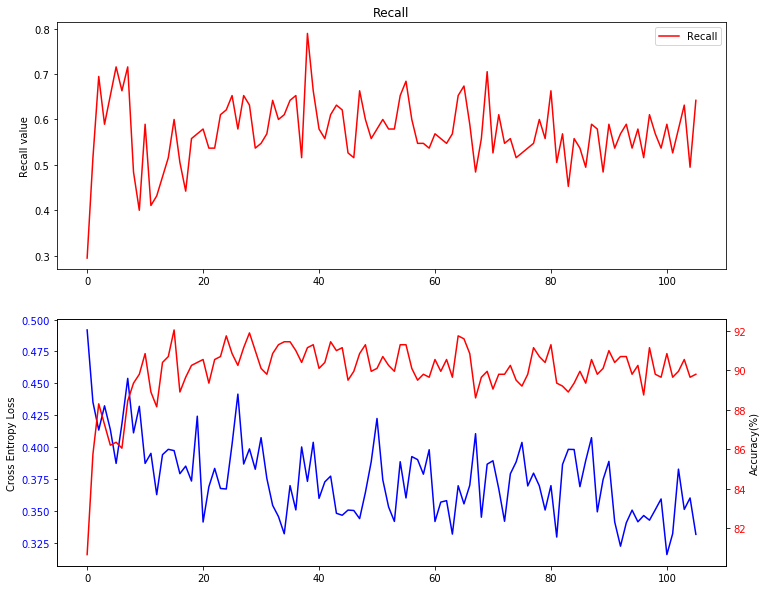

Step: 214   Cross Entropy Loss: 0.33226895332336426   Accuracy: 89.80509745127436 % 
F1 score is 0.5952380952380952 Recall score is 0.5263157894736842


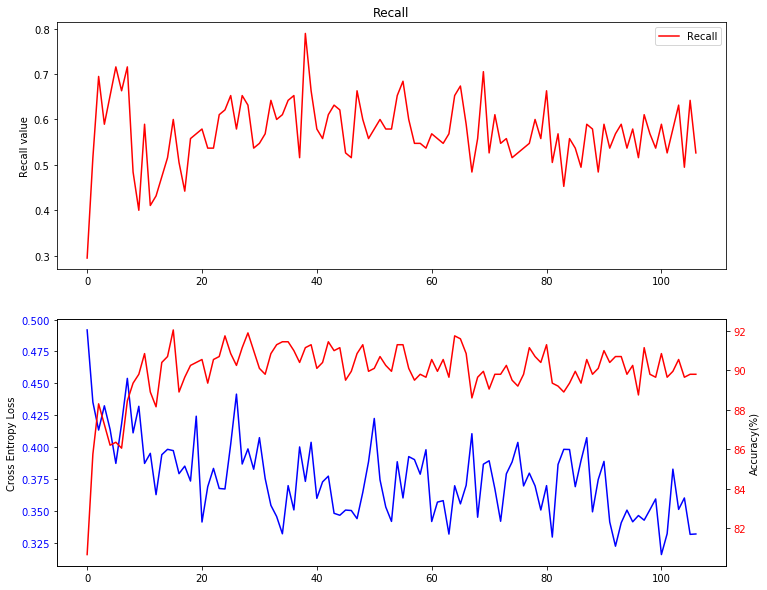

Step: 216   Cross Entropy Loss: 0.342350035905838   Accuracy: 89.95502248875562 % 
F1 score is 0.6378378378378379 Recall score is 0.6210526315789474


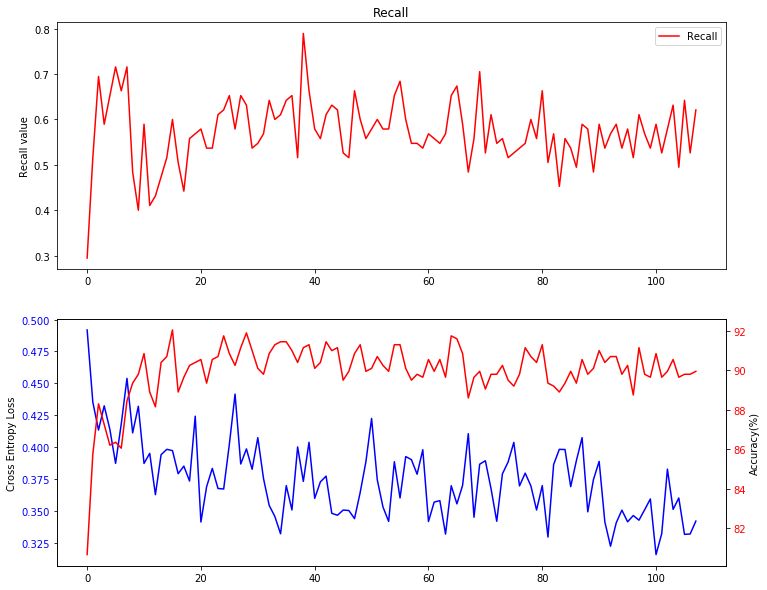

Step: 218   Cross Entropy Loss: 0.36542731523513794   Accuracy: 90.70464767616193 % 
F1 score is 0.6395348837209303 Recall score is 0.5789473684210527


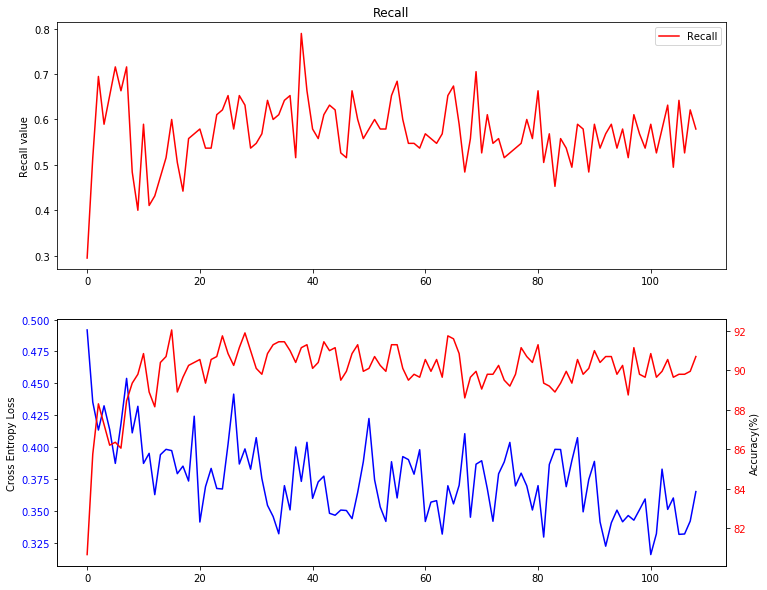

Step: 220   Cross Entropy Loss: 0.35120779275894165   Accuracy: 90.10494752623688 % 
F1 score is 0.6373626373626373 Recall score is 0.6105263157894737


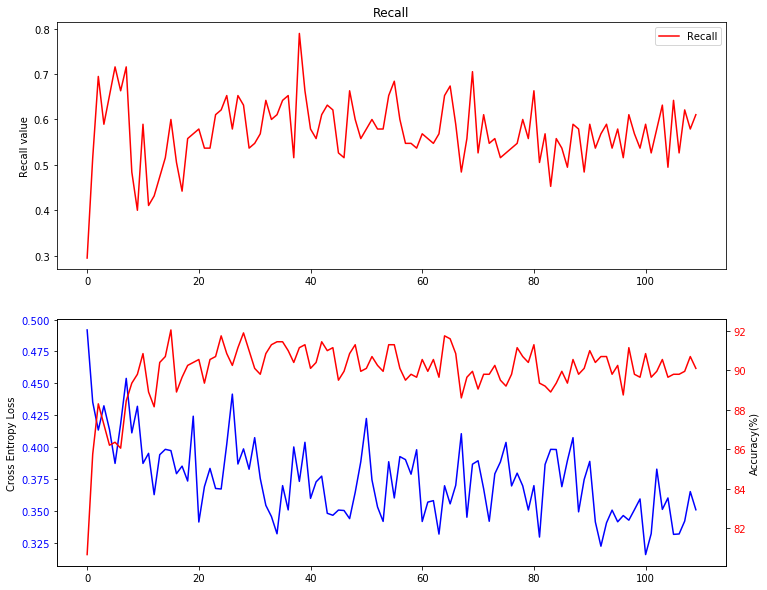

Step: 222   Cross Entropy Loss: 0.34157371520996094   Accuracy: 90.85457271364318 % 
F1 score is 0.6514285714285715 Recall score is 0.6


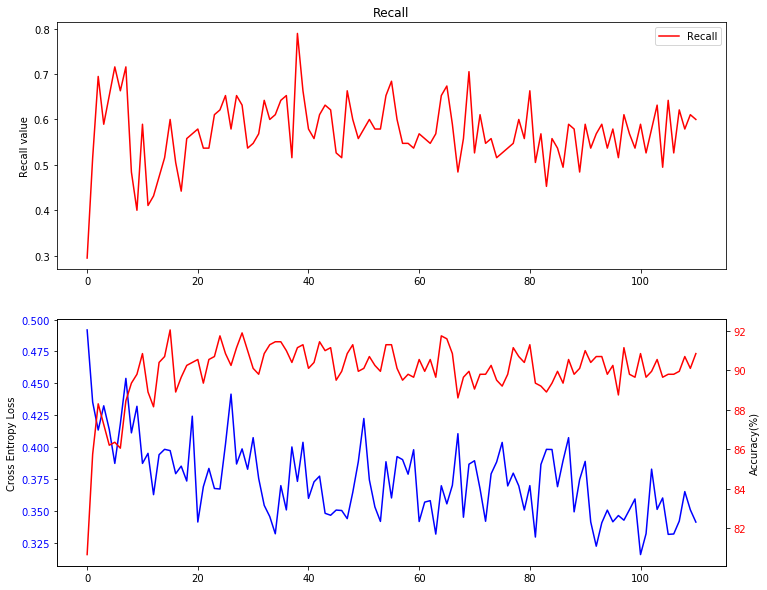

Step: 224   Cross Entropy Loss: 0.36547866463661194   Accuracy: 89.20539730134932 % 
F1 score is 0.6 Recall score is 0.5684210526315789


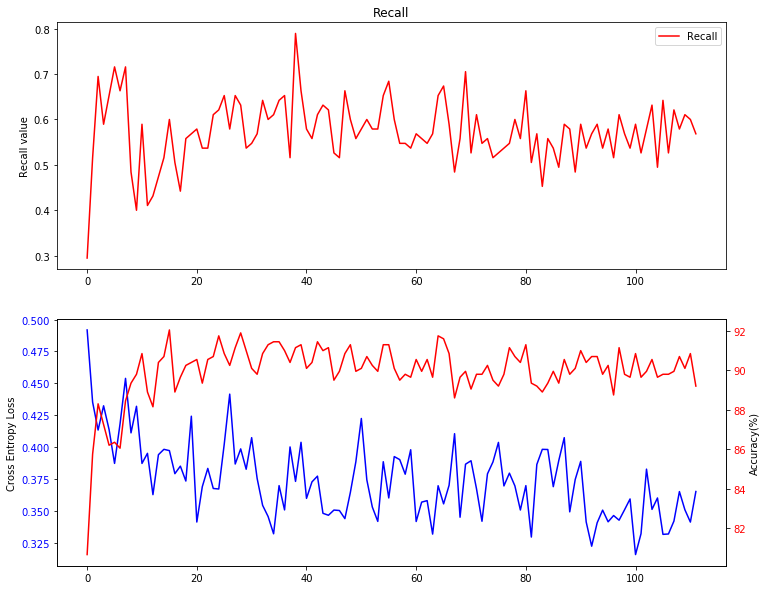

Step: 226   Cross Entropy Loss: 0.351123571395874   Accuracy: 91.45427286356822 % 
F1 score is 0.6885245901639344 Recall score is 0.6631578947368421


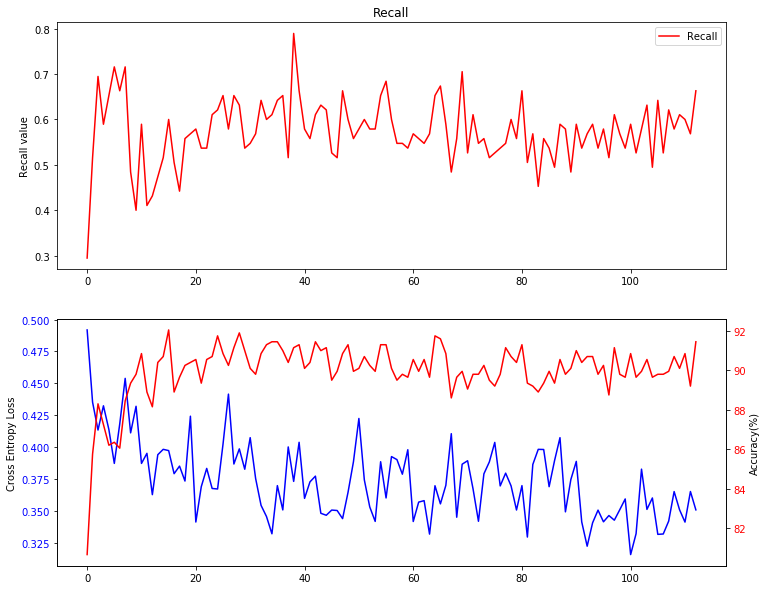

Step: 228   Cross Entropy Loss: 0.35111498832702637   Accuracy: 91.904047976012 % 
F1 score is 0.7032967032967034 Recall score is 0.6736842105263158


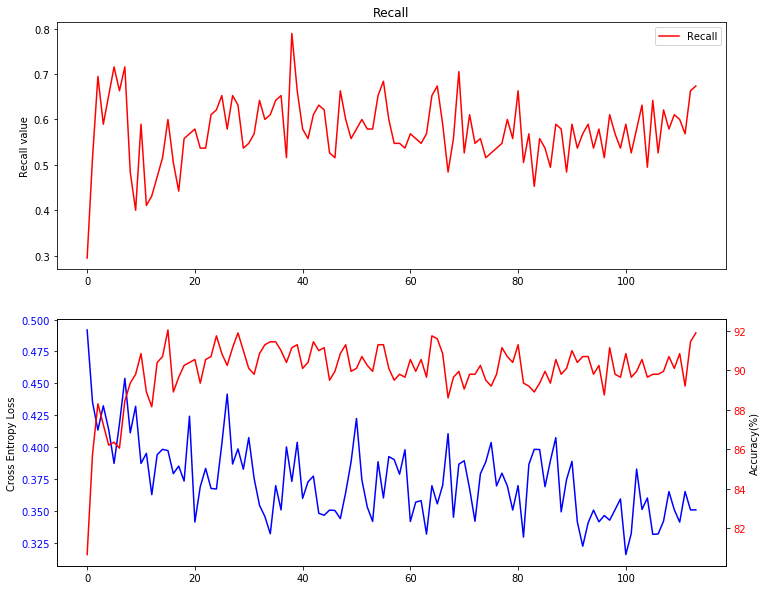

Step: 230   Cross Entropy Loss: 0.3794427514076233   Accuracy: 90.70464767616193 % 
F1 score is 0.6555555555555557 Recall score is 0.6210526315789474


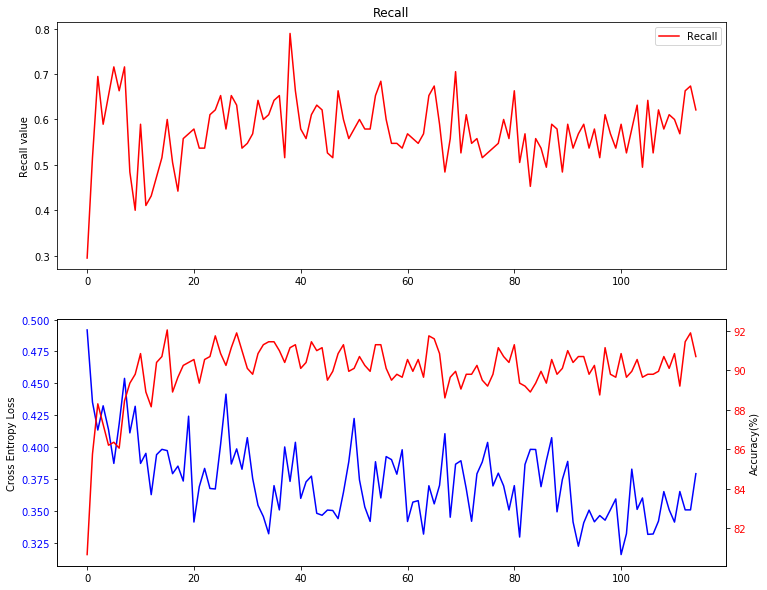

Step: 232   Cross Entropy Loss: 0.40763434767723083   Accuracy: 90.25487256371814 % 
F1 score is 0.6198830409356725 Recall score is 0.5578947368421052


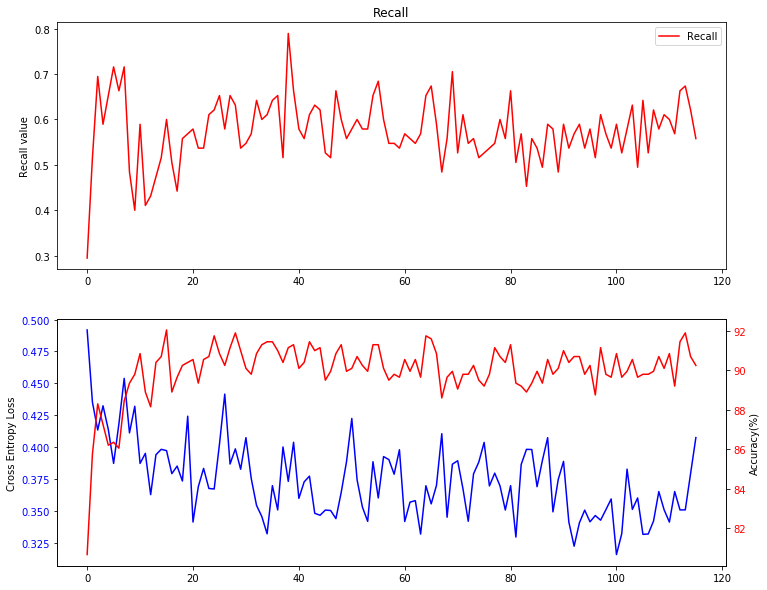

Step: 234   Cross Entropy Loss: 0.3889175057411194   Accuracy: 90.25487256371814 % 
F1 score is 0.6107784431137725 Recall score is 0.5368421052631579


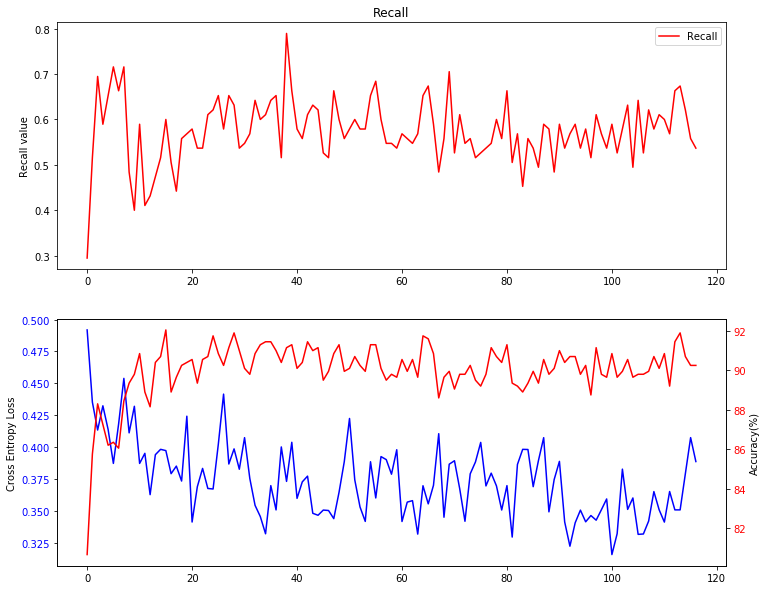

Step: 236   Cross Entropy Loss: 0.36588144302368164   Accuracy: 90.10494752623688 % 
F1 score is 0.6333333333333333 Recall score is 0.6


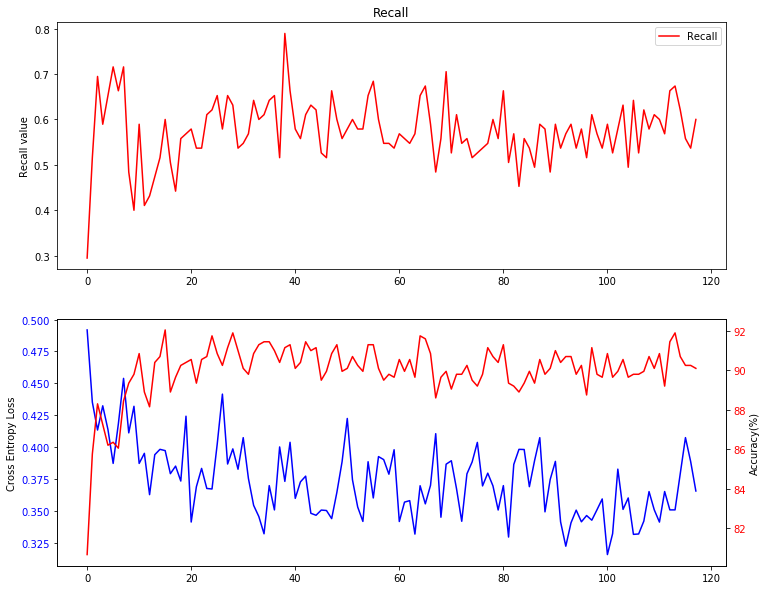

Step: 238   Cross Entropy Loss: 0.3415864109992981   Accuracy: 90.85457271364318 % 
F1 score is 0.6163522012578617 Recall score is 0.5157894736842106


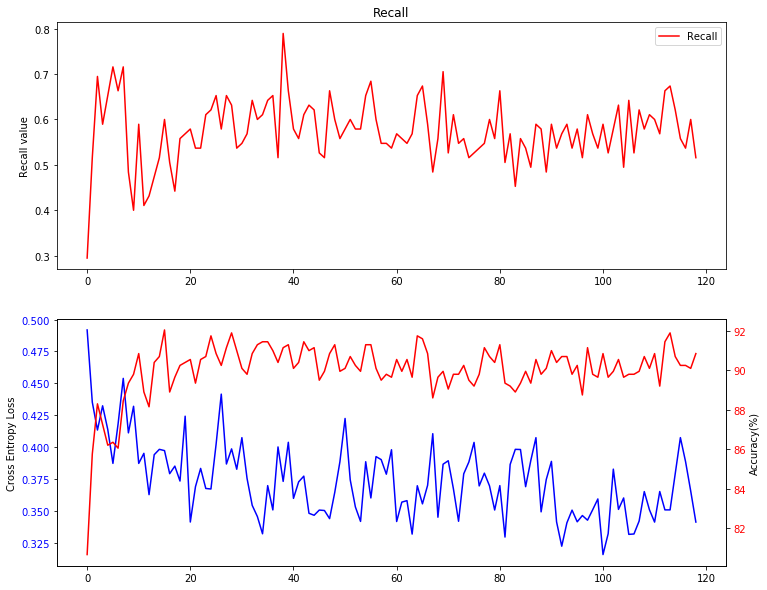

Step: 240   Cross Entropy Loss: 0.3788928687572479   Accuracy: 91.60419790104947 % 
F1 score is 0.6666666666666665 Recall score is 0.5894736842105263


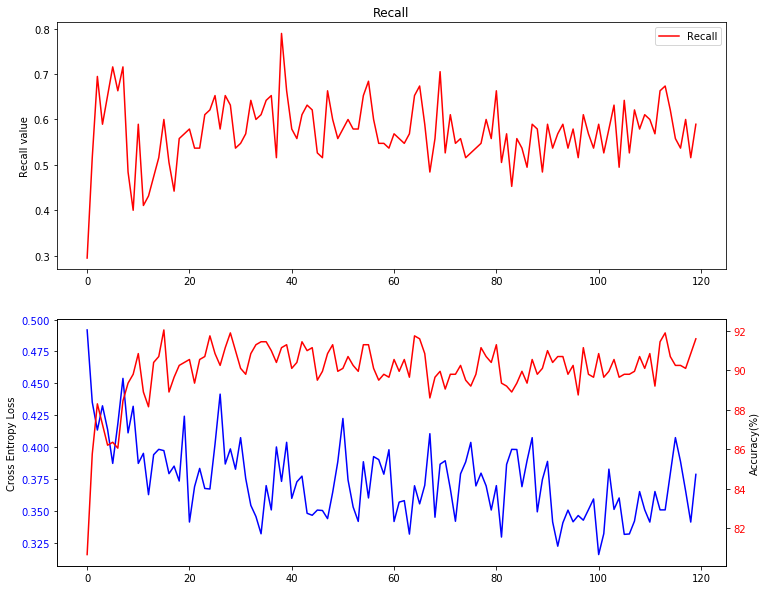

Step: 242   Cross Entropy Loss: 0.3616752624511719   Accuracy: 91.60419790104947 % 
F1 score is 0.6818181818181818 Recall score is 0.631578947368421


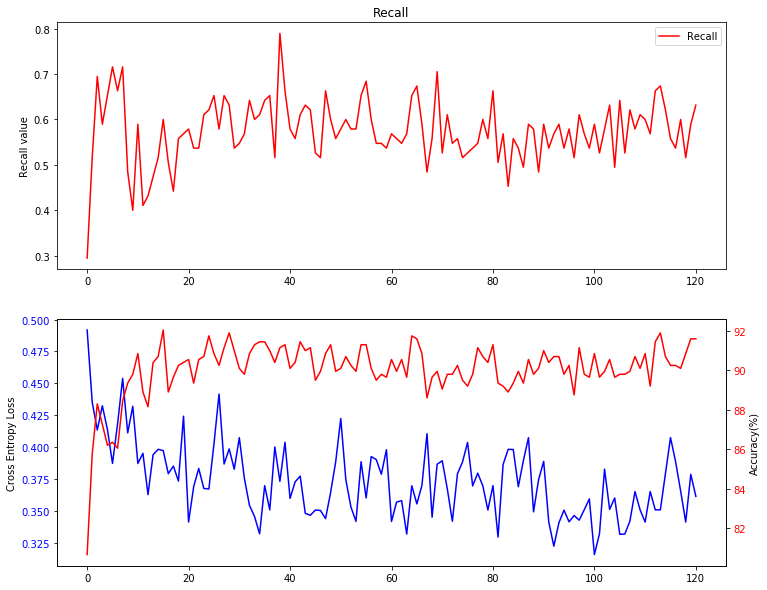

Step: 244   Cross Entropy Loss: 0.37920939922332764   Accuracy: 89.80509745127436 % 
F1 score is 0.5903614457831325 Recall score is 0.5157894736842106


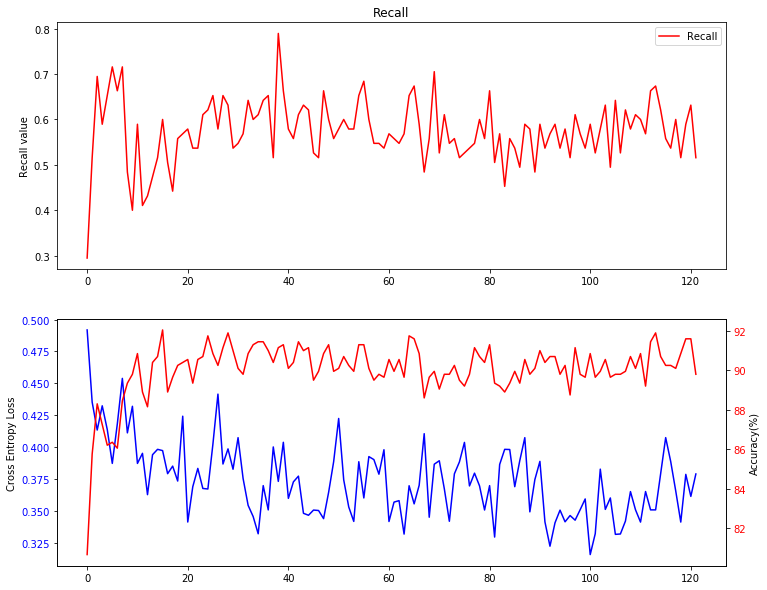

Step: 246   Cross Entropy Loss: 0.37976011633872986   Accuracy: 89.80509745127436 % 
F1 score is 0.5696202531645569 Recall score is 0.47368421052631576


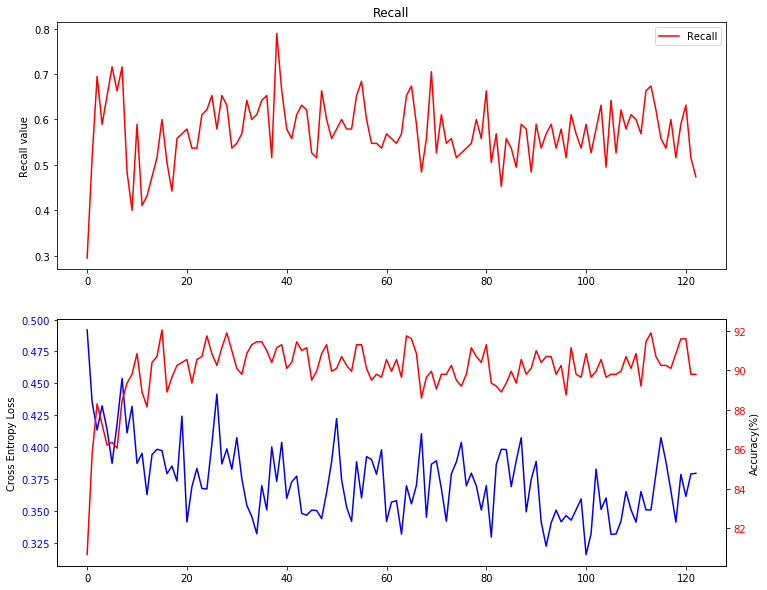

Step: 248   Cross Entropy Loss: 0.41656333208084106   Accuracy: 89.95502248875562 % 
F1 score is 0.6214689265536724 Recall score is 0.5789473684210527


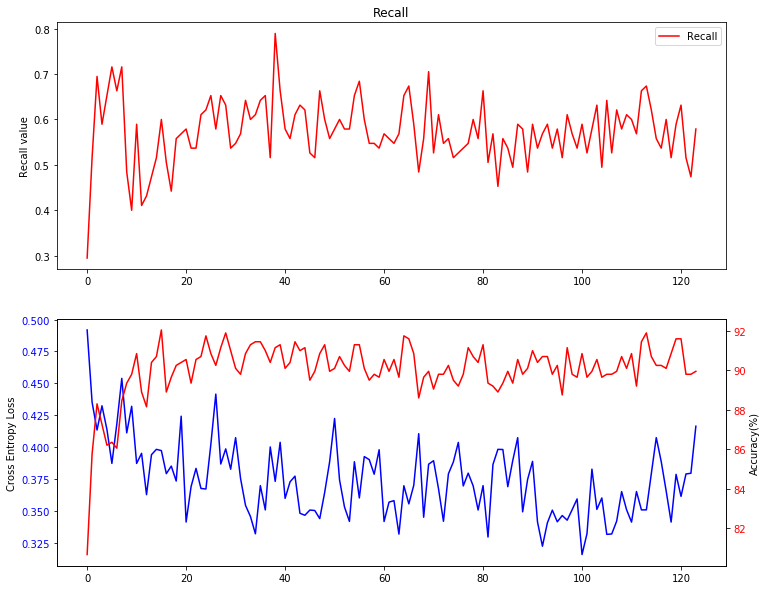

Step: 250   Cross Entropy Loss: 0.3513614237308502   Accuracy: 92.35382308845578 % 
F1 score is 0.7017543859649122 Recall score is 0.631578947368421


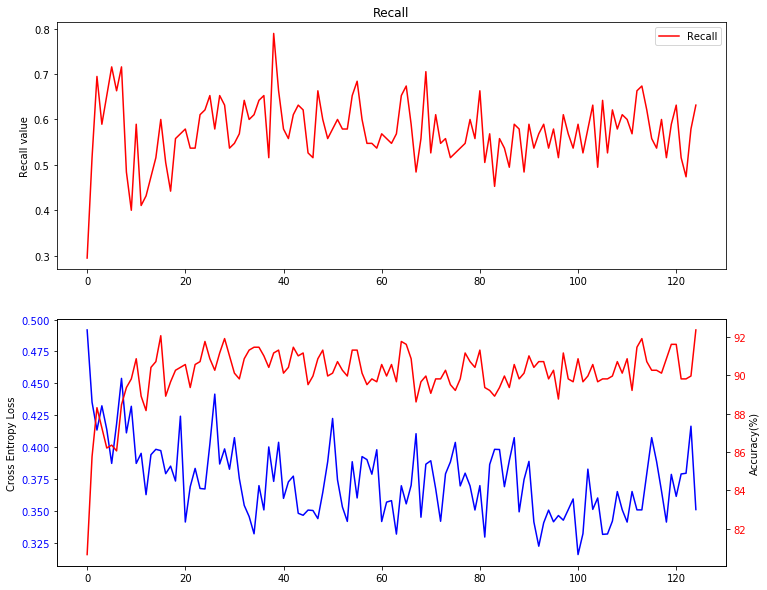

Step: 252   Cross Entropy Loss: 0.36995744705200195   Accuracy: 89.05547226386807 % 
F1 score is 0.5680473372781065 Recall score is 0.5052631578947369


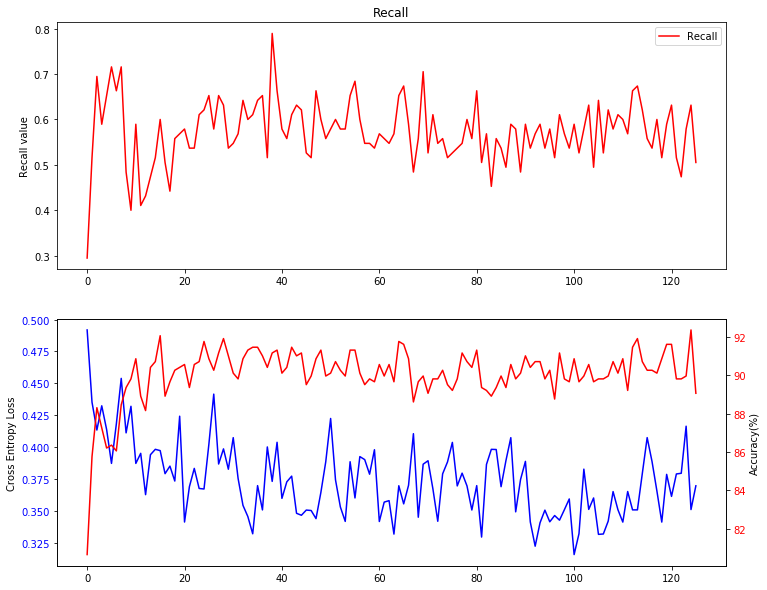

Step: 254   Cross Entropy Loss: 0.34190526604652405   Accuracy: 90.10494752623688 % 
F1 score is 0.6413043478260869 Recall score is 0.6210526315789474


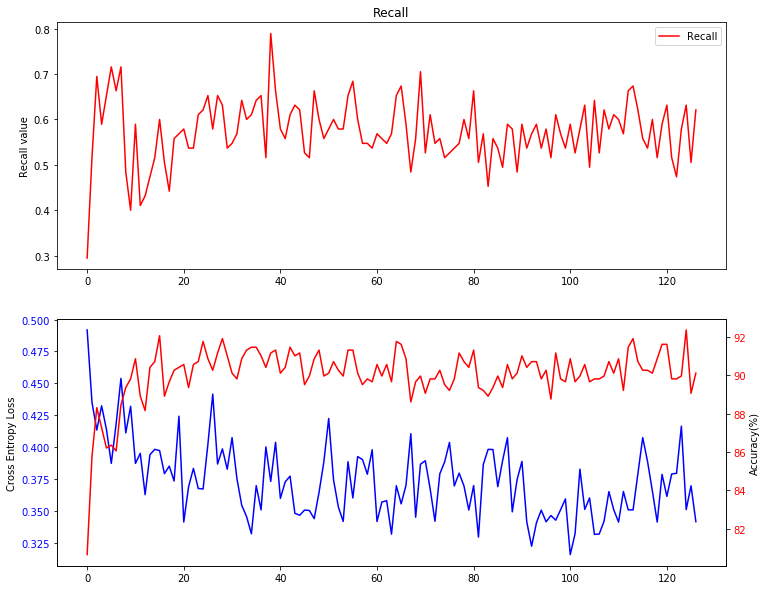

Step: 256   Cross Entropy Loss: 0.35181766748428345   Accuracy: 89.65517241379311 % 
F1 score is 0.5964912280701754 Recall score is 0.5368421052631579


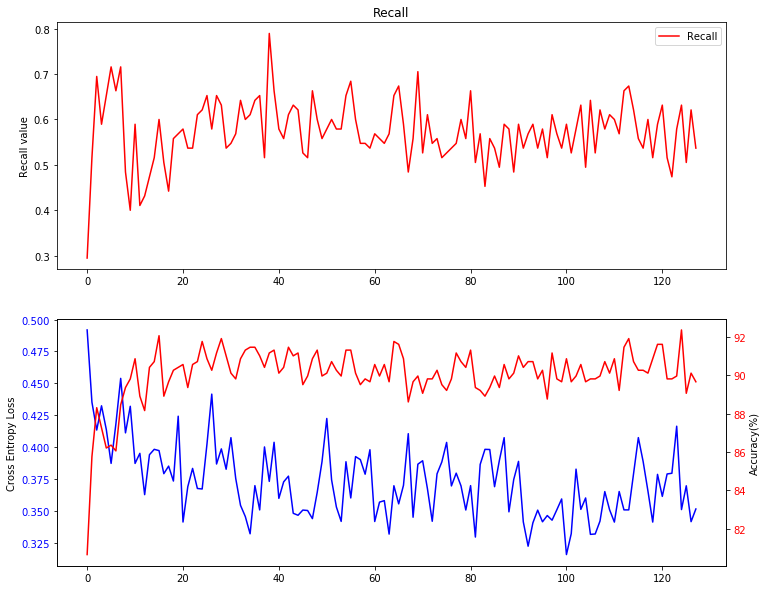

Step: 258   Cross Entropy Loss: 0.3324087858200073   Accuracy: 90.55472263868066 % 
F1 score is 0.64 Recall score is 0.5894736842105263


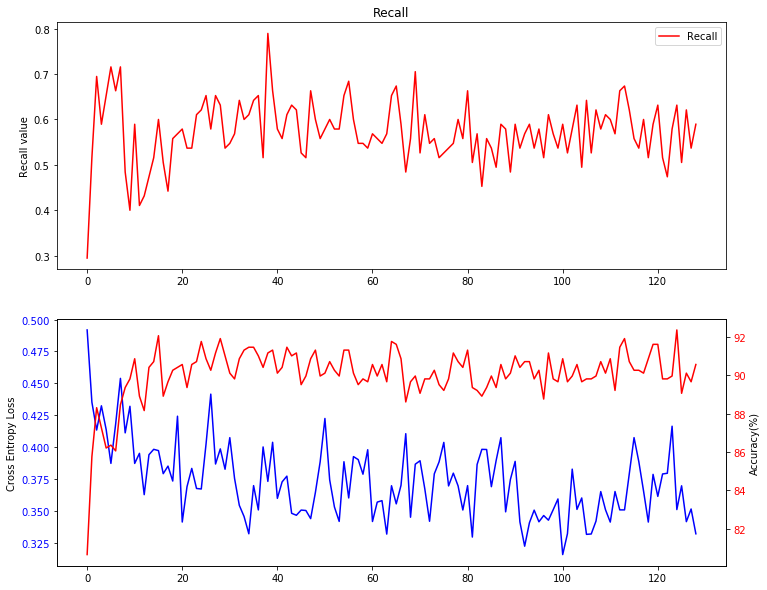

Step: 260   Cross Entropy Loss: 0.3794552683830261   Accuracy: 89.05547226386807 % 
F1 score is 0.5966850828729281 Recall score is 0.5684210526315789


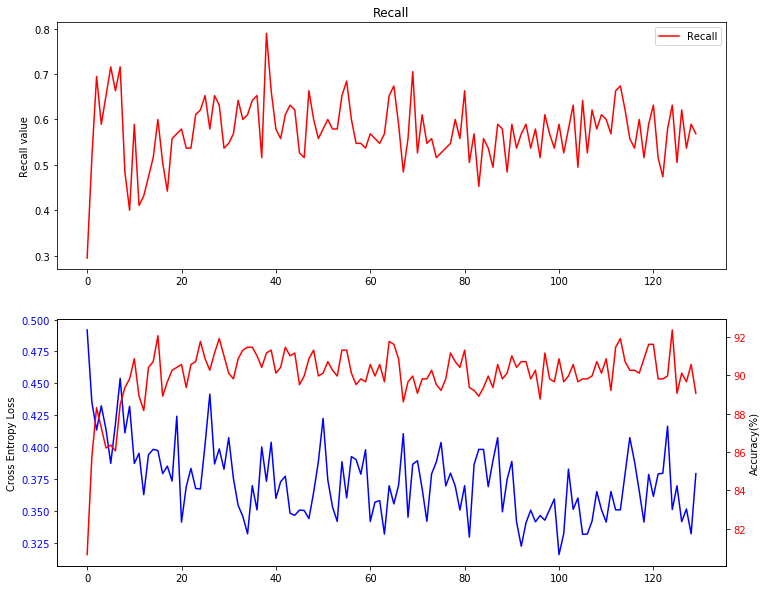

Step: 262   Cross Entropy Loss: 0.3511681854724884   Accuracy: 89.50524737631184 % 
F1 score is 0.5783132530120482 Recall score is 0.5052631578947369


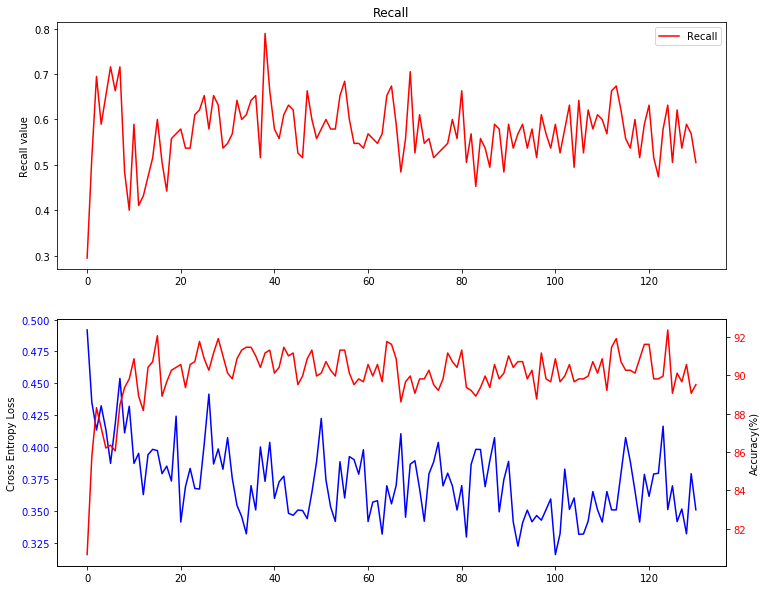

Step: 264   Cross Entropy Loss: 0.37074014544487   Accuracy: 90.25487256371814 % 
F1 score is 0.6368715083798883 Recall score is 0.6


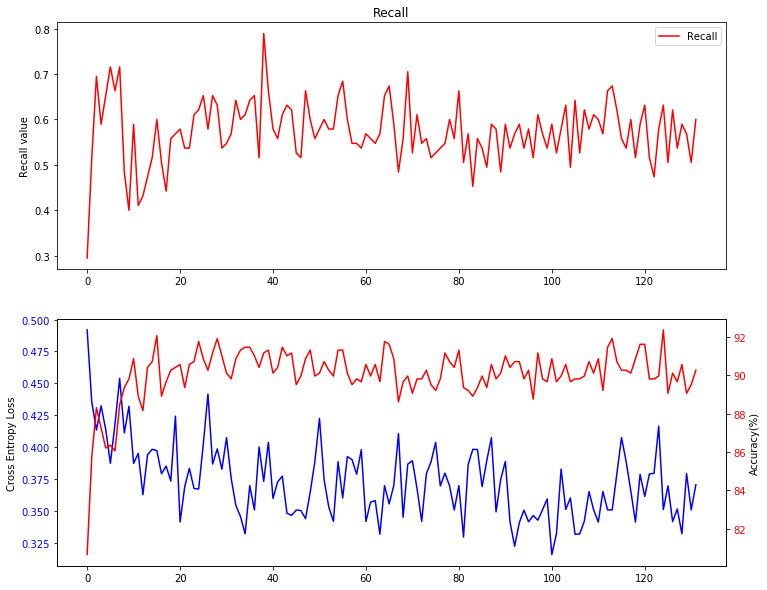

Step: 266   Cross Entropy Loss: 0.3227044939994812   Accuracy: 89.80509745127436 % 
F1 score is 0.6179775280898877 Recall score is 0.5789473684210527


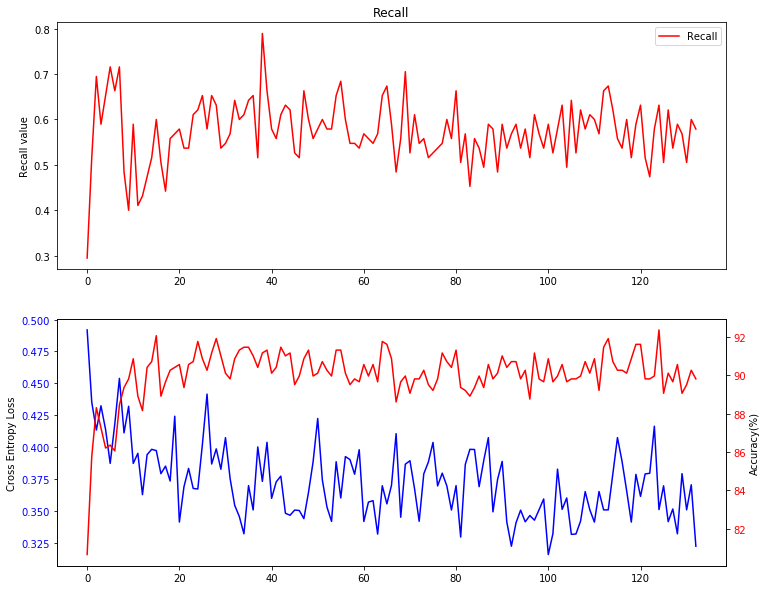

Step: 268   Cross Entropy Loss: 0.35103535652160645   Accuracy: 88.9055472263868 % 
F1 score is 0.5595238095238095 Recall score is 0.49473684210526314


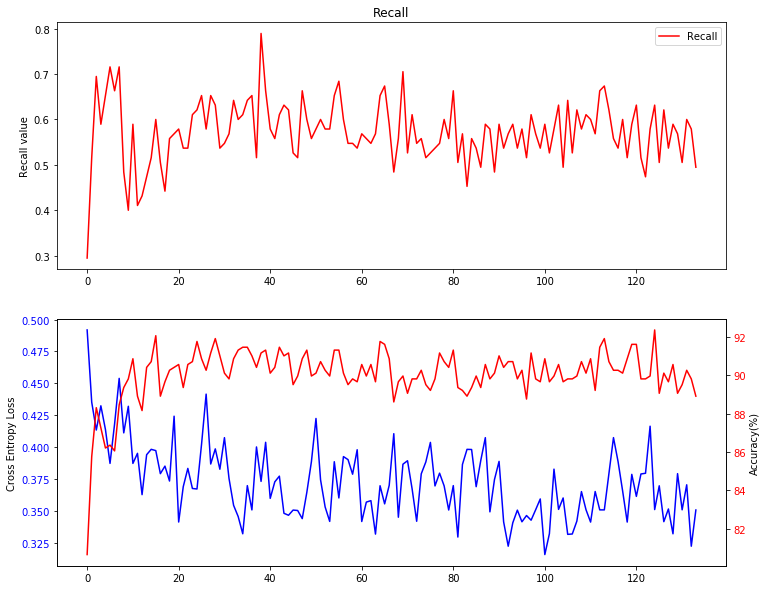

Step: 270   Cross Entropy Loss: 0.31599265336990356   Accuracy: 90.4047976011994 % 
F1 score is 0.632183908045977 Recall score is 0.5789473684210527


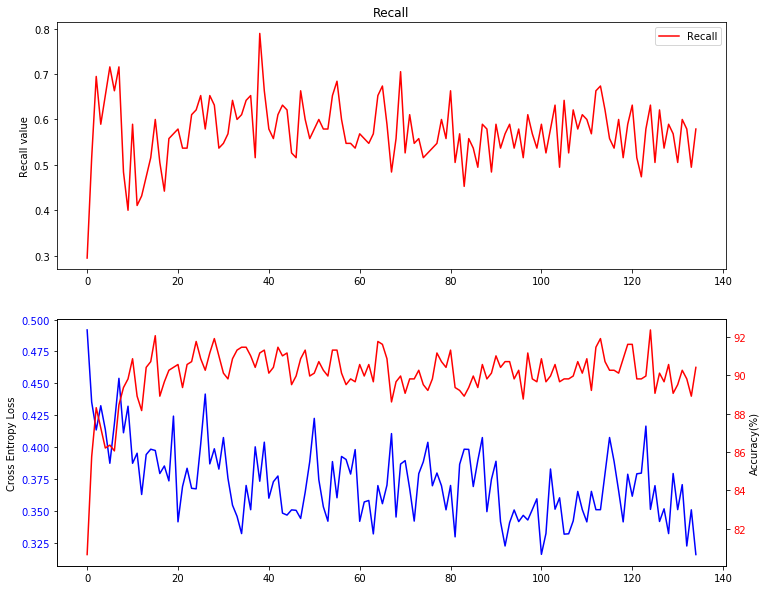

Step: 272   Cross Entropy Loss: 0.3604941964149475   Accuracy: 89.95502248875562 % 
F1 score is 0.6171428571428571 Recall score is 0.5684210526315789


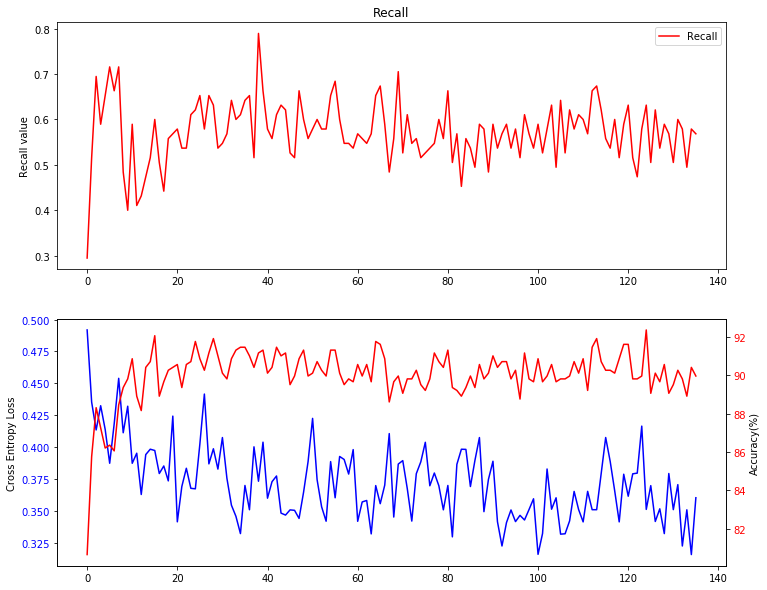

Step: 274   Cross Entropy Loss: 0.36035266518592834   Accuracy: 91.30434782608695 % 
F1 score is 0.6813186813186813 Recall score is 0.6526315789473685


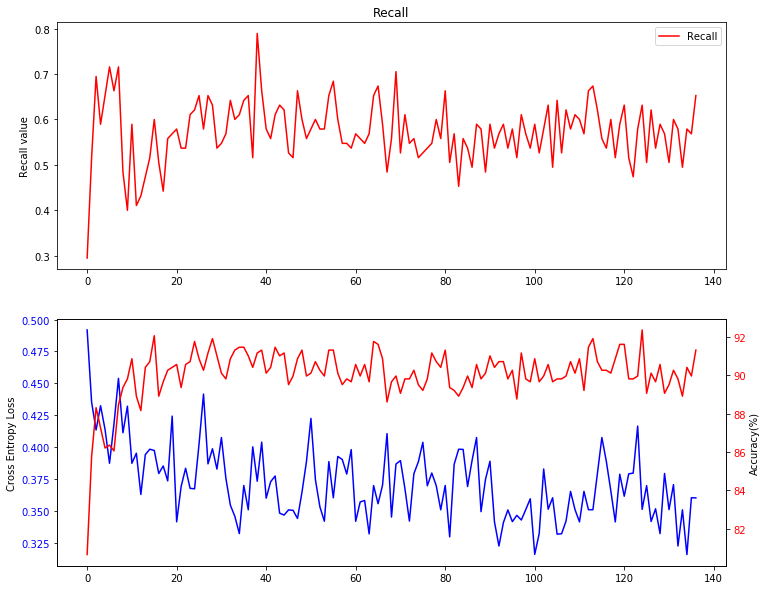

Step: 276   Cross Entropy Loss: 0.3415987193584442   Accuracy: 91.45427286356822 % 
F1 score is 0.6666666666666665 Recall score is 0.6


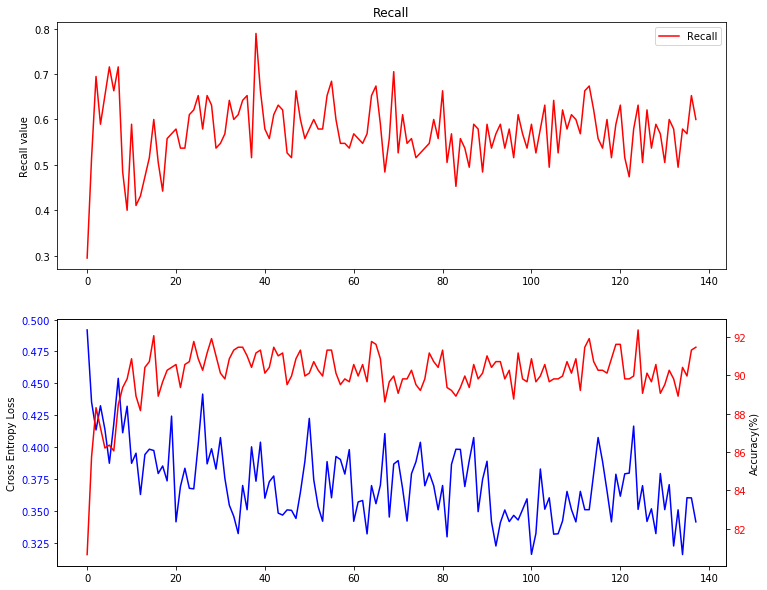

Step: 278   Cross Entropy Loss: 0.3698655962944031   Accuracy: 91.75412293853074 % 
F1 score is 0.6857142857142857 Recall score is 0.631578947368421


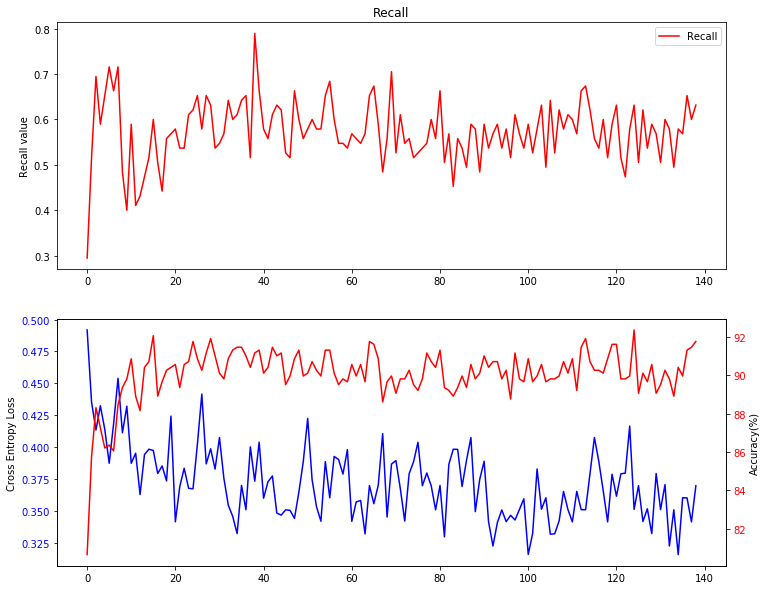

Step: 280   Cross Entropy Loss: 0.36045557260513306   Accuracy: 91.00449775112443 % 
F1 score is 0.6385542168674698 Recall score is 0.5578947368421052


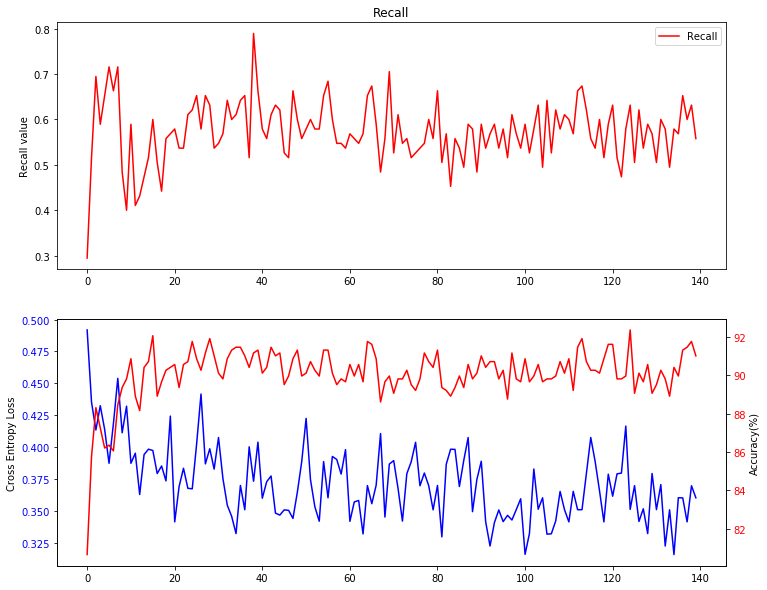

Step: 282   Cross Entropy Loss: 0.3604368269443512   Accuracy: 91.00449775112443 % 
F1 score is 0.6511627906976745 Recall score is 0.5894736842105263


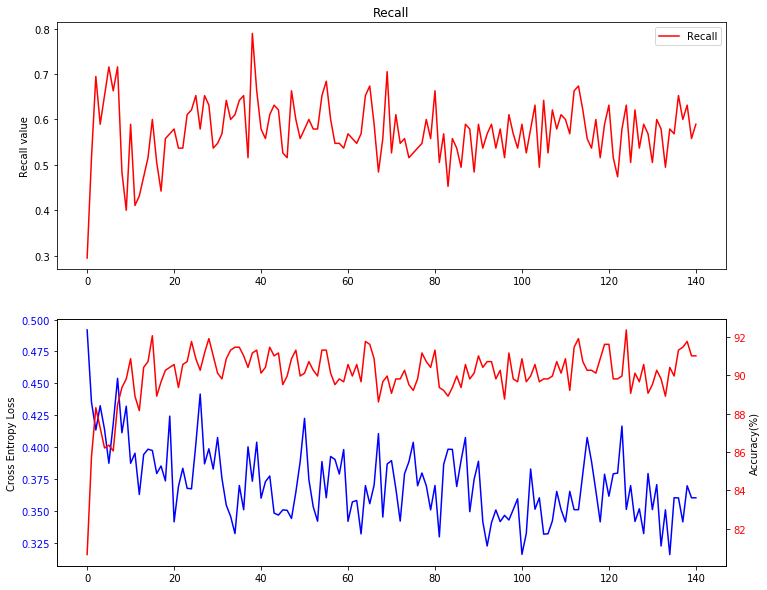

Step: 284   Cross Entropy Loss: 0.35101914405822754   Accuracy: 90.25487256371814 % 
F1 score is 0.6242774566473989 Recall score is 0.5684210526315789


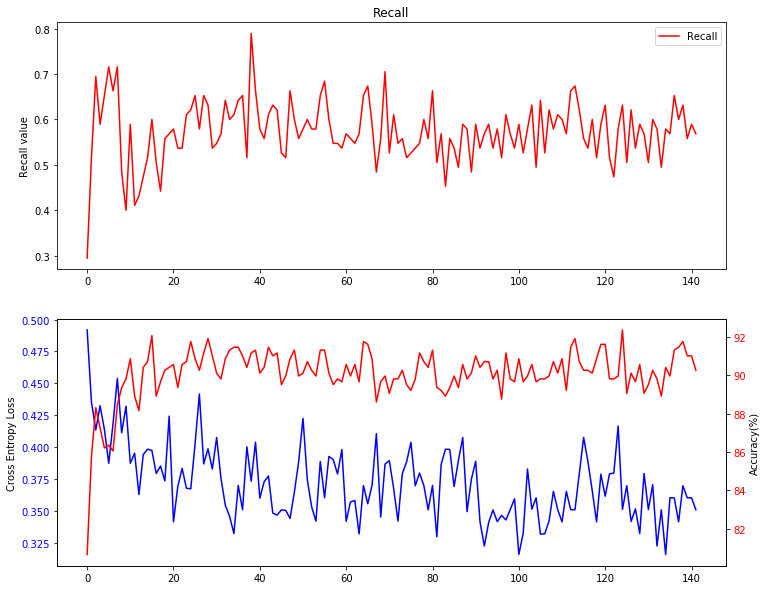

Step: 286   Cross Entropy Loss: 0.3510063886642456   Accuracy: 91.75412293853074 % 
F1 score is 0.7120418848167539 Recall score is 0.7157894736842105


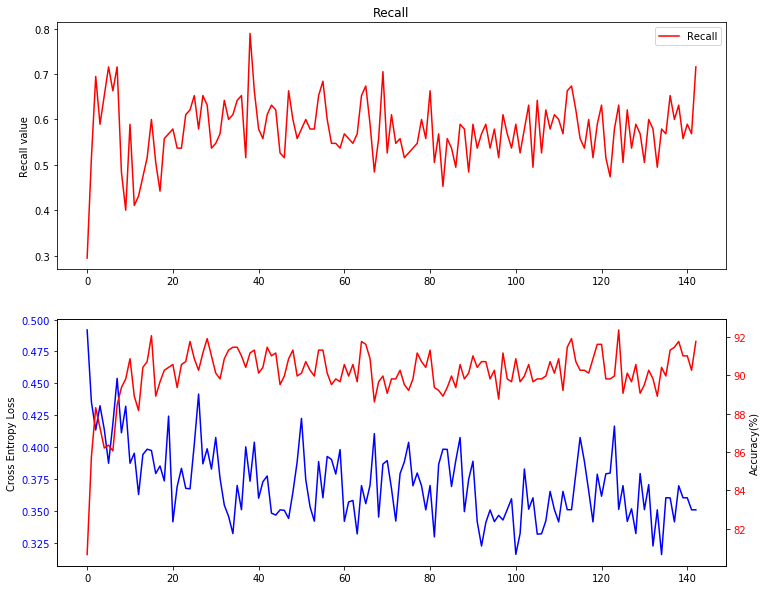

Step: 288   Cross Entropy Loss: 0.3605194091796875   Accuracy: 92.05397301349325 % 
F1 score is 0.7253886010362695 Recall score is 0.7368421052631579


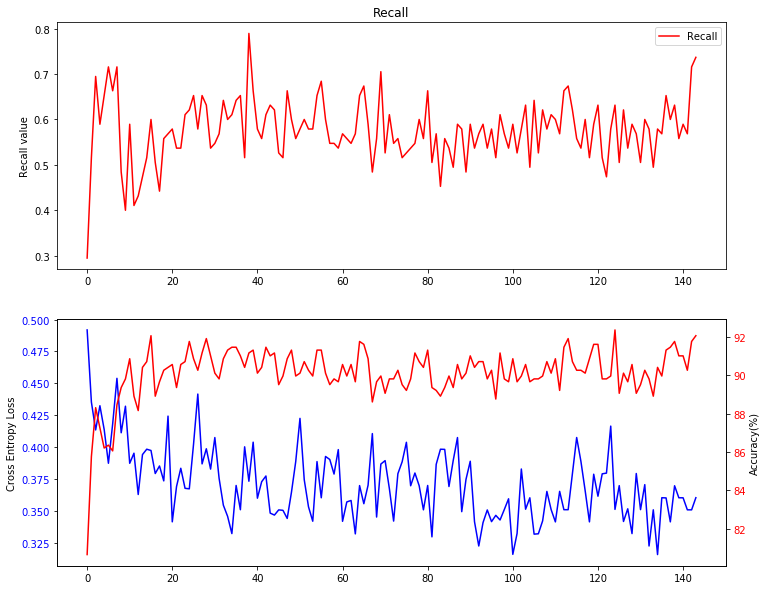

Step: 290   Cross Entropy Loss: 0.3510141670703888   Accuracy: 90.70464767616193 % 
F1 score is 0.6395348837209303 Recall score is 0.5789473684210527


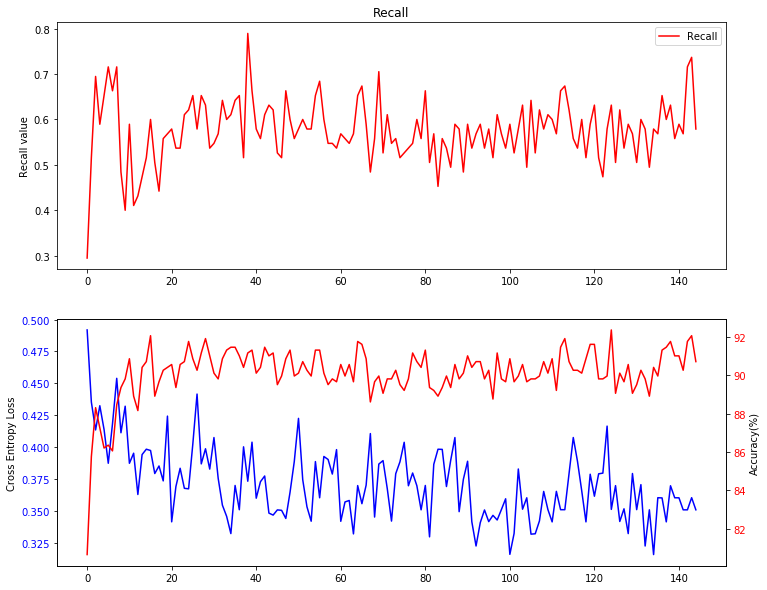

Step: 292   Cross Entropy Loss: 0.3415917158126831   Accuracy: 90.85457271364318 % 
F1 score is 0.6772486772486772 Recall score is 0.6736842105263158


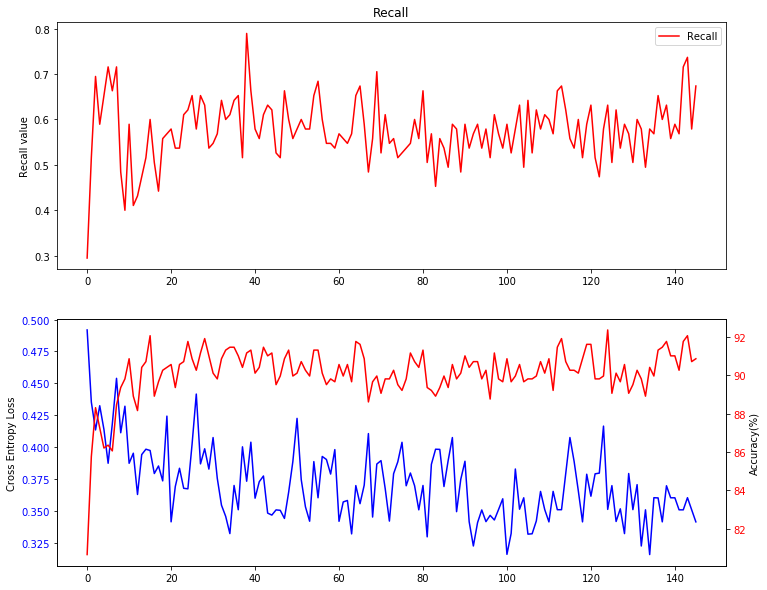

Step: 294   Cross Entropy Loss: 0.34222331643104553   Accuracy: 90.55472263868066 % 
F1 score is 0.6358381502890172 Recall score is 0.5789473684210527


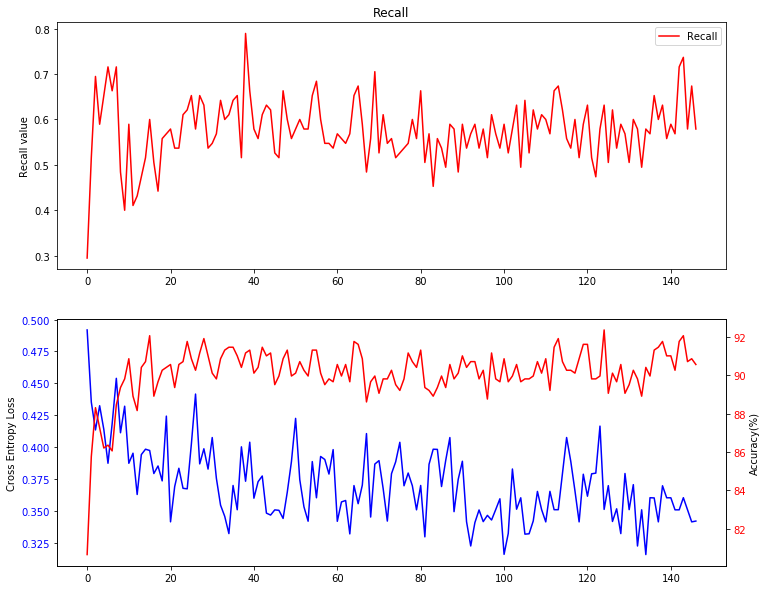

Step: 296   Cross Entropy Loss: 0.36043819785118103   Accuracy: 90.25487256371814 % 
F1 score is 0.6153846153846154 Recall score is 0.5473684210526316


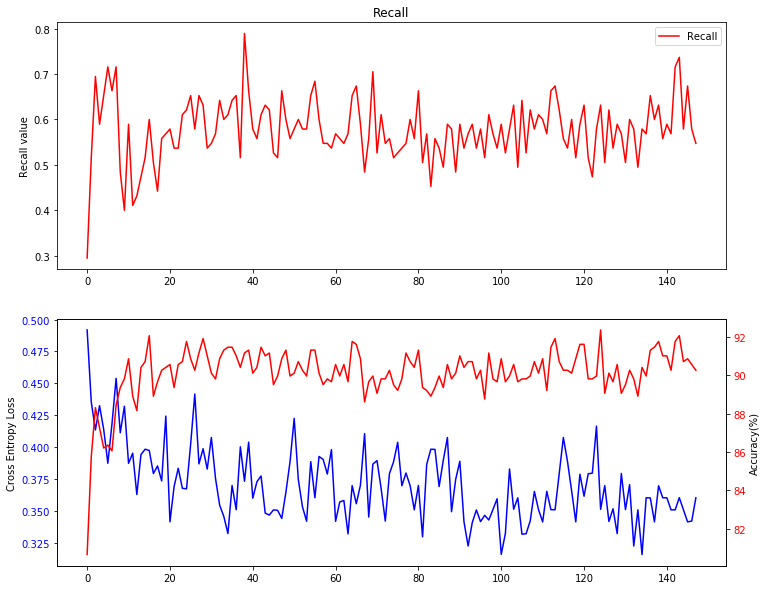

Step: 298   Cross Entropy Loss: 0.3388036787509918   Accuracy: 90.85457271364318 % 
F1 score is 0.6666666666666667 Recall score is 0.6421052631578947


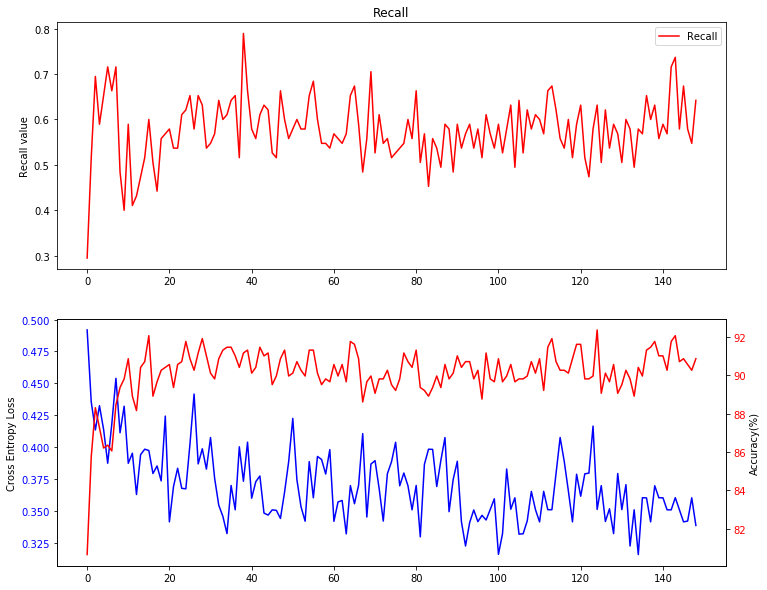

Step: 300   Cross Entropy Loss: 0.37000012397766113   Accuracy: 90.10494752623688 % 
F1 score is 0.6373626373626373 Recall score is 0.6105263157894737


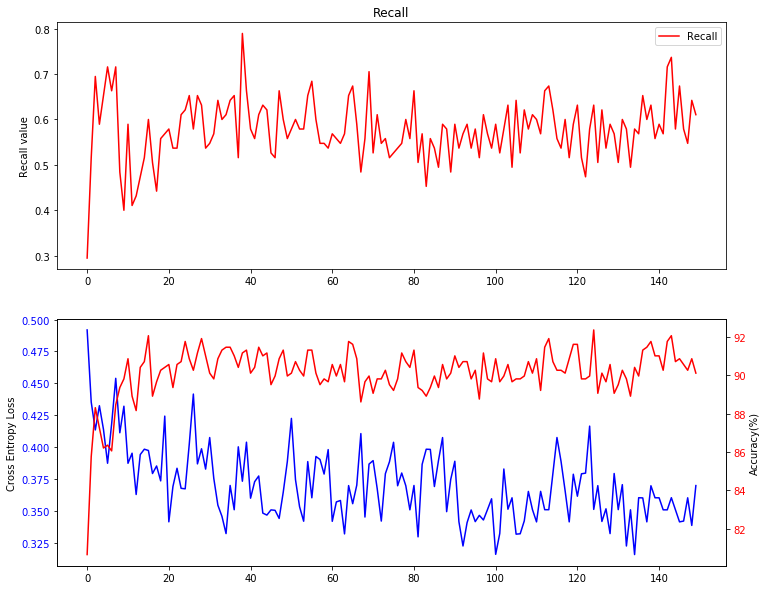

In [10]:
for epoch in range(epoch_number):
    loss = None
    for batch_x, batch_y in dataloader:
        y_predict = net(batch_x.to(device))
        loss = criterion(y_predict, batch_y.to(device).long().squeeze())
        
        optim.zero_grad()
        loss.backward()
        optim.step()

    # Print steps and loss every 100 loops
    if (epoch+1) % 2 == 0:
        predict = net(X_tens.to(device))
        loss = np.array(loss.detach().cpu().numpy())
        loss_all.append(loss)
        pred = torch.max(predict,dim=1)[1]
        # Print training informations
        accuracy = accuracy_score(pred.detach().cpu().numpy(), Y_test) * 100
        accuracy_all.append(accuracy)
        recl = recall_score(Y_test, pred.detach().cpu().numpy())
        f1_temp = f1_score(Y_test, pred.detach().cpu().numpy())
        recall_all.append(recl)
        f1_all.append(f1_temp)
        print("Step: {0}   Cross Entropy Loss: {1}   Accuracy: {2} % \nF1 score is {3} Recall score is {4}"
              .format(epoch+1, loss.item(),accuracy, f1_temp, recl))
        
        if recl*100 > acc_high[len(acc_high)-1]:
            acc_high.append(recl*100)    # Collect the highest accuracy rate currently
            pred_final = pred
            net_final = net
        else:
            pass

# =====Draw Plots====================================================================================
        fig, axs = plt.subplots(2,1,figsize=(12,10))
        ax1, ax2 = axs.flatten()
        x = np.linspace(0, len(predict), len(predict))
        ax1.set(
#                 ylim=[-0.4, 1.4],
                title='Recall')
#         ax1.set_xlabel('Iteration times/100') # x label
        ax1.set_ylabel('Recall value') # y label
        ax1.plot(recall_all,c='r', label="Recall")
#         ax1.scatter(x, Y_test,c='b', label="Test label")
        ax1.legend()
#         ax1.tick_params(axis='y', labelcolor='red')
        
        ax2 = plt.gca()
        ax2.set_ylabel('Cross Entropy Loss') # y label
        ax2.plot(loss_all, c='b', label="Cross Entropy Loss")
        ax2.tick_params(axis='y', labelcolor='blue')
        ax3 = ax2.twinx()
        ax3.set_ylabel('Accuracy(%)')
        ax3.tick_params(axis='y', labelcolor='red')
        ax3.plot(accuracy_all, c='r', label='Accuracy')

        plt.savefig(fname="./picture2/" + str(epoch+1) + ".png", figsize=[10, 10])
        plt.show()
# =====================================================================================================

In [11]:
print('Recall is %.3f' %(acc_high[-1]) ,'%')


Recall is 78.947 %


In [12]:
# # # Test code
predict = net_final(X_tens.to(device))
pred = torch.max(predict,dim=1)[1]
pred = pred.detach().cpu().numpy()
predict = predict.detach().cpu().numpy()

test_pred = np.zeros([len(predict),1])
test_pred = predict[:,1]


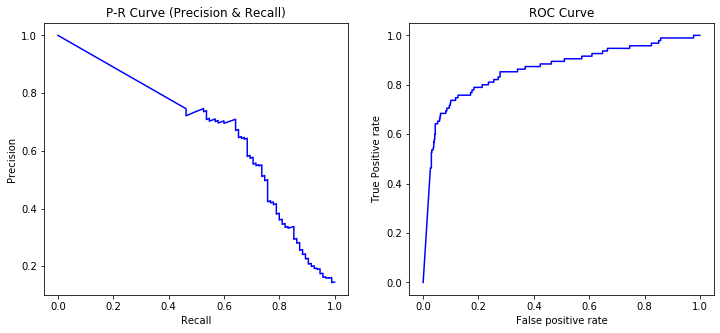

AUC value is 0.8624769966875231 
Recall value is 0.7894736842105263 
F1 value is 0.7177033492822966
Accuracy is 91.1544227886057 %


In [13]:
fig, axs = plt.subplots(1,2,figsize=(12,5))
ax1, ax2 = axs.flatten()

precision, recall, thresholds = precision_recall_curve(Y_test, test_pred)
FP_rate, TP_rate, thresholds = roc_curve(Y_test, test_pred)
auc_value = roc_auc_score(Y_test, test_pred)
recall_final = recall_score(Y_test, pred_final.detach().cpu().numpy())
f1_value = f1_score(Y_test, pred_final.detach().cpu().numpy())
accur_final = accuracy_score(Y_test, pred_final.detach().cpu().numpy()) * 100

ax1.set(
#         xlim=[0, 1], ylim=[0, 1],
        title='P-R Curve (Precision & Recall)')
ax1.set_xlabel('Recall') # x label
ax1.set_ylabel('Precision') # y label
ax1.plot(recall, precision,c='b')

ax2.set(
#         xlim=[0, 1], ylim=[0, 1],
        title='ROC Curve')
ax2.set_xlabel('False positive rate') # x label
ax2.set_ylabel('True Positive rate') # y label
ax2.plot(FP_rate, TP_rate,c='b')

plt.show()

print('AUC value is {0} \nRecall value is {1} \nF1 value is {2}\nAccuracy is {3} %'
      .format(auc_value, recall_final, f1_value, accur_final))

In [14]:
end = time.time()
print('Run time: ',end-start,'s')

Run time:  77.66146445274353 s


In [15]:
torch.save(net_final,'./model/bpnet_model_11.pt')